## Preparation


### Load dependencies


In [2]:
%load_ext autoreload
%autoreload 1
%aimport project_filtering.data_analysis
%aimport project_filtering.calculations
%aimport project_filtering

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
from io import BytesIO
from typing import Any, Dict, List, Literal, Optional, Sequence, Tuple

import matplotlib.pyplot as plt
import mordred as md
import numpy as np
import pandas as pd
import seaborn as sns
from IPython.display import display
from matplotlib.patches import Patch, PathPatch, Rectangle
from numpy.typing import NDArray
from tqdm.auto import tqdm
from tqdm.contrib.concurrent import thread_map

from project_filtering import (
    BASE_DIR,
    DEFAULT_DATA_OFFSET,
    DEFAULT_DATA_OFFSETS,
    DEFAULT_THRESHOLD,
    DEFAULT_THRESHOLDS,
    SEED,
    MODEL_NAMES,
    DEFAULT_VALUE_NAME,
    TOL
)
from project_filtering.calculations import (
    calc_diffs_corrs,
    calc_basic_stats,
    calc_classification_metrics,
    calc_classification_metrics_multi_model,
    calc_groups,
    calc_models_diffs,
    compare_threshold_methods,
    calc_values_diffs,
    get_modified_entries,
)
from project_filtering.data_analysis import (
    HATCH_DICT,
    plot_binned_values,
    plot_delta_corr,
    plot_delta_correlations,
    plot_distribution_deltas,
    plot_group_sizes,
    plot_stats_classification,
    # plot_stats_class_curve_v_mpe,
    plot_stats_group,
    plot_stats_models,
)
from project_filtering.utils import load_predicted_df
from sklearn.metrics import auc

In [4]:
OUTPUT_FOLDER = BASE_DIR / "data" / "output"

In [5]:
colorblind = sns.color_palette("colorblind")
colorblind

[(0.00392156862745098, 0.45098039215686275, 0.6980392156862745),
 (0.8705882352941177, 0.5607843137254902, 0.0196078431372549),
 (0.00784313725490196, 0.6196078431372549, 0.45098039215686275),
 (0.8352941176470589, 0.3686274509803922, 0.0),
 (0.8, 0.47058823529411764, 0.7372549019607844),
 (0.792156862745098, 0.5686274509803921, 0.3803921568627451),
 (0.984313725490196, 0.6862745098039216, 0.8941176470588236),
 (0.5803921568627451, 0.5803921568627451, 0.5803921568627451),
 (0.9254901960784314, 0.8823529411764706, 0.2),
 (0.33725490196078434, 0.7058823529411765, 0.9137254901960784)]

### Set Palette


In [6]:
new_order = [colorblind[i] for i in [0, 3, 7, 2, 5, 4, 6, 8, 1, 9]]
sns.color_palette(new_order)

[(0.00392156862745098, 0.45098039215686275, 0.6980392156862745),
 (0.8352941176470589, 0.3686274509803922, 0.0),
 (0.5803921568627451, 0.5803921568627451, 0.5803921568627451),
 (0.00784313725490196, 0.6196078431372549, 0.45098039215686275),
 (0.792156862745098, 0.5686274509803921, 0.3803921568627451),
 (0.8, 0.47058823529411764, 0.7372549019607844),
 (0.984313725490196, 0.6862745098039216, 0.8941176470588236),
 (0.9254901960784314, 0.8823529411764706, 0.2),
 (0.8705882352941177, 0.5607843137254902, 0.0196078431372549),
 (0.33725490196078434, 0.7058823529411765, 0.9137254901960784)]

In [7]:
sns.color_palette("colorblind6")

[(0.00392156862745098, 0.45098039215686275, 0.6980392156862745),
 (0.00784313725490196, 0.6196078431372549, 0.45098039215686275),
 (0.8352941176470589, 0.3686274509803922, 0.0),
 (0.8, 0.47058823529411764, 0.7372549019607844),
 (0.9254901960784314, 0.8823529411764706, 0.2),
 (0.33725490196078434, 0.7058823529411765, 0.9137254901960784)]

In [8]:
sns.set_context("paper", font_scale=0.7)

### Descriptor-Based Datasets


#### Noisy


In [9]:
noisy_desc_df = pd.read_csv(
    BASE_DIR / "data/processed/synthetic-dataset.csv", index_col=0, sep=";"
)
noisy_desc_df = noisy_desc_df.sort_values("smiles").reset_index(drop=True)
noisy_desc_df.index.names = ["#"]

#### Base


In [10]:
base_desc_df = pd.read_csv(
    BASE_DIR / "data/processed/synthetic-clean-dataset.csv", index_col=0, sep=";"
)
base_desc_df = base_desc_df.sort_values("smiles").reset_index(drop=True)
base_desc_df.index.names = ["#"]


#### Shuffled


In [11]:
shuffled_desc_dfs = {}
for file in (BASE_DIR / "data/processed/").glob("predicted-dataset-shuffle-*.csv"):
    shuffled_desc_dfs[float(file.name.split("-")[3])] = load_predicted_df(
        file, model_names=MODEL_NAMES
    )
shuffled_desc_dfs = pd.concat(shuffled_desc_dfs,names=["modified_%", "#"])
shuffled_desc_dfs

smiles  \
modified_% #                                                          
0.0        0                           Brc1c(Br)c(Br)c2[nH]cnc2c1Br   
           1                           Brc1c(Br)c(Br)c2[nH]nnc2c1Br   
           2                 Brc1ccc(-c2ccc(CN=c3nc[nH][nH]3)o2)cc1   
           3                      Brc1ccc(-c2ccc(CNCC3CCNCC3)o2)cc1   
           4                  Brc1ccc(-c2ccc(CNC[C@@H]3CCCO3)o2)cc1   
...                                                             ...   
5.0        79885             c1nc2c(c(=NCc3ccc4c(c3)OCO4)[nH]1)CCC2   
           79886                c1nc2c(c(N3CCC(N4CCCCC4)CC3)n1)CCC2   
           79887  c1nc2ccc(-c3nc(-c4ccc5c(c4)nnn5CCN4CCCCC4)no3)...   
           79888              c1nn2cnnc2cc1N1CCN(Cc2csc3c2CCCC3)CC1   
           79889                             c1nnc(C2CC2)n1C1CCNCC1   

                                                              inchi    values  \
modified_% #                                                                    
0.0        0      InChI=1S/C7H2Br4N2/c8-2-3(9)5(11)7-6(4(2)10)12...  0.678912   
           1      InChI=1S/C6HBr4N3/c7-1-2(8)4(10)6-5(3(1)9)11-1...  0.815859   
           2      InChI=1S/C13H11BrN4O/c14-10-3-1-9(2-4-10)12-6-... -0.359711   
           3      InChI=1S/C17H21BrN2O/c18-15-3-1-14(2-4-15)17-6... -0.372272   
           4      InChI=1S/C16H18BrNO2/c17-13-5-3-12(4-6-13)16-8... -0.392074   
...                                                             ...       ...   
5.0        79885  InChI=1S/C15H15N3O2/c1-2-11-12(3-1)17-8-18-15(... -0.423653   
           79886  InChI=1S/C17H26N4/c1-2-9-20(10-3-1)14-7-11-21(... -0.306283   
           79887  InChI=1S/C22H22N8O/c1-2-8-29(9-3-1)10-11-30-20...  0.200500   
           79888  InChI=1S/C18H22N6S/c1-2-4-17-16(3-1)14(12-25-1... -0.121405   
           79889  InChI=1S/C10H16N4/c1-2-8(1)10-13-12-7-14(10)9-... -0.658269   

                       cnn       gnn      fcfp       fcd        cb  
modified_% #                                                        
0.0        0      0.183134 -0.147329 -0.296589  0.169461 -0.153610  
           1      0.327013 -0.036774 -0.369125  0.259861 -0.117171  
           2     -0.349868 -0.332834 -0.354112 -0.377647 -0.329061  
           3     -0.359002 -0.361805 -0.360321 -0.353415 -0.346289  
           4     -0.396241 -0.382704 -0.390517 -0.397570 -0.383124  
...                    ...       ...       ...       ...       ...  
5.0        79885 -0.408230 -0.433601 -0.434258 -0.426839 -0.429857  
           79886 -0.288710 -0.314050 -0.222732 -0.277924 -0.328154  
           79887  0.216491  0.188318  0.173020  0.200960  0.196322  
           79888 -0.121222 -0.101615 -0.115270 -0.106122 -0.113770  
           79889 -0.619410 -0.671227 -0.703988 -0.654442 -0.653749  

[479340 rows x 8 columns]

#### Variable Addition


In [12]:
variable_add_desc_dfs = {}
for j in [0.025, 0.04, 0.05, 0.075, 0.1, 0.15, 0.25]:
    temp_dict = {}
    for i in [0.5, 1, 2.5, 5, 10]:
        filename = BASE_DIR / f"data/processed/predicted-variable-mu-{j}-{i}-42.csv"
        try:
            temp_dict[i] = load_predicted_df(filename, model_names=MODEL_NAMES)
        except FileNotFoundError:
            print(f"{filename} not found")
            continue
    variable_add_desc_dfs[j] = pd.concat(temp_dict, names=["modified_%", "#"])
variable_add_desc_dfs = pd.concat(variable_add_desc_dfs, names=["var_add"])

### QM9


#### Clean


In [13]:
base_qm9_df = pd.read_csv(BASE_DIR / "data/processed/qm9-clean.csv", sep=";")
base_qm9_df["values"] = base_qm9_df["g298_atom"] / (-1000)
base_qm9_df.index.names = ["#"]

#### Shuffled


In [14]:
shuffled_qm9_dfs = {}
for i in [0.0, 0.5, 1, 2.5, 5, 10]:
    filename = BASE_DIR / f"data/processed/qm9-shuffle-predictions-{i}-42.csv"
    try:
        shuffled_qm9_dfs[i] = load_predicted_df(filename, model_names=MODEL_NAMES)
    except FileNotFoundError:
        print(f"{filename} not found")
        continue
shuffled_qm9_dfs = pd.concat(shuffled_qm9_dfs,names=["modified_%", "#"])

#### Variable Addition


In [15]:
variable_add_qm9_dfs = {}
for j in [0.0075, 0.0125, 0.015, 0.0175, 0.02, 0.025, 0.05, 0.08, 0.15, 0.25]:
    temp_dict = {}
    for i in [0.5, 1, 2.5, 5, 10]:
        filename = (
            BASE_DIR / f"data/processed/qm9-variable-mu-predictions-{j}-{i}-42.csv"
        )
        try:
            temp_dict[i] = load_predicted_df(filename, model_names=MODEL_NAMES)
        except FileNotFoundError:
            print(f"{filename} not found")
            continue
    variable_add_qm9_dfs[j] = pd.concat(temp_dict, names=["modified_%", "#"])
variable_add_qm9_dfs = pd.concat(variable_add_qm9_dfs, names=["var_add"])

### GNN


In [16]:
gnn_df = pd.concat(
    [
        pd.read_csv(
            BASE_DIR / "data/processed/predicted-GNN-only-shuffle-42-46-2.5.csv",
            index_col=[0, 1],
            sep=";",
        ),
        pd.read_csv(
            BASE_DIR / "data/processed/predicted-GNN-only-shuffle-47-52-2.5.csv",
            index_col=[0, 1],
            sep=";",
        ),
    ]
)
gnn_df["gnn"] = [float(x.strip("[]")) for x in gnn_df["gnn"].to_numpy()]
gnn_df = (
    gnn_df.reset_index(names=["seed", "idx"])
    .pivot(index=["smiles", "inchi"], columns=["seed"], values=["gnn", "values"])
    .reset_index()
)

gnn_df.set_index(["smiles", "inchi"], append=True).stack(future_stack=True)
gnn_df.columns = [f"{x}-{y}" if y else str(x) for (x, y) in gnn_df.columns]
gnn_df["values"] = gnn_df["values-42"]
gnn_df = gnn_df.drop(columns=[x for x in gnn_df.columns if "values-" in x])
gnn_df = gnn_df.sort_values("smiles").reset_index(drop=True)
gnn_df.index.names = ["#"]
gnn_models = [x for x in gnn_df.columns if x.startswith("gnn")]
gnn_df.head()

,smiles,inchi,gnn-42,gnn-43,gnn-44,gnn-45,gnn-46,gnn-47,gnn-48,gnn-49,gnn-50,gnn-51,values
#,,,,,,,,,,,,,
0,Brc1c(Br)c(Br)c2[nH]cnc2c1Br,InChI=1S/C7H2Br4N2/c8-2-3(9)5(11)7-6(4(2)10)12...,-0.090712,0.578620,0.312483,0.650743,0.448968,0.749590,0.062619,0.619823,0.525567,0.627433,0.678912
1,Brc1c(Br)c(Br)c2[nH]nnc2c1Br,InChI=1S/C6HBr4N3/c7-1-2(8)4(10)6-5(3(1)9)11-1...,-0.029662,0.504092,0.572793,0.854348,0.337776,0.539971,0.148910,0.925470,0.628134,0.900105,0.815859
2,Brc1ccc(-c2ccc(CN=c3nc[nH][nH]3)o2)cc1,InChI=1S/C13H11BrN4O/c14-10-3-1-9(2-4-10)12-6-...,-0.337336,-0.328779,-0.290211,-0.332864,-0.329733,-0.326868,-0.364423,-0.365485,-0.372686,-0.348533,-0.359711
3,Brc1ccc(-c2ccc(CNCC3CCNCC3)o2)cc1,InChI=1S/C17H21BrN2O/c18-15-3-1-14(2-4-15)17-6...,-0.359819,-0.349863,-0.372720,-0.357736,-0.364960,-0.356615,-0.384397,-0.374281,-0.371516,-0.348271,-0.372272
4,Brc1ccc(-c2ccc(CNC[C@@H]3CCCO3)o2)cc1,InChI=1S/C16H18BrNO2/c17-13-5-3-12(4-6-13)16-8...,-0.400038,-0.386987,-0.377928,-0.390635,-0.401624,-0.404578,-0.411900,-0.394775,-0.388018,-0.400449,-0.392074


### FCFP


In [17]:
shuffle_comp = load_predicted_df(
    BASE_DIR / "data/processed/predicted-dataset-shuffle-2.5-42.csv",
    model_names=MODEL_NAMES,
)
shuffle_comp = shuffle_comp.sort_values("smiles").reset_index(drop=True)
shuffle_comp.index.names = ["#"]
fcfp_df = pd.read_csv(
    BASE_DIR / "data/processed/predicted-FCFP-only-shuffle-42-51-2.5.csv",
    index_col=[0, 1],
    sep=";",
)
fcfp_df["fcfp"] = [float(x.strip("[]")) for x in fcfp_df["fcfp"].to_numpy()]
fcfp_df = (
    fcfp_df.reset_index(names=["seed", "idx"])
    .pivot(index=["smiles", "inchi"], columns=["seed"], values=["fcfp", "values"])
    .reset_index()
)
fcfp_df.columns = [f"{x}-{y}" if y else str(x) for (x, y) in fcfp_df.columns]
fcfp_df["values"] = fcfp_df["values-42"]
fcfp_df = fcfp_df.drop(columns=[x for x in fcfp_df.columns if "values-" in x])
fcfp_df = fcfp_df.sort_values("smiles").reset_index(drop=True)
fcfp_df.index.names = ["#"]
fcfp_models = [x for x in fcfp_df.columns if x.startswith("fcfp")]

### METLIN SMRT


In [18]:
metlin_df = pd.read_csv(BASE_DIR / "data/input/metlin-predicted-rts-1.csv", index_col=0)
metlin_df.index.names = ["#"]
metlin_models = metlin_df.columns[:-2].to_list()

### NIST RI 2017


In [19]:
nist_df = pd.read_csv(BASE_DIR / "data/input/nist-predicted-1.csv")
nist_df.index.names = ["#"]
nist_models = nist_df.columns[3:].to_list()

## Methods


### Datasets


Figure S1


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


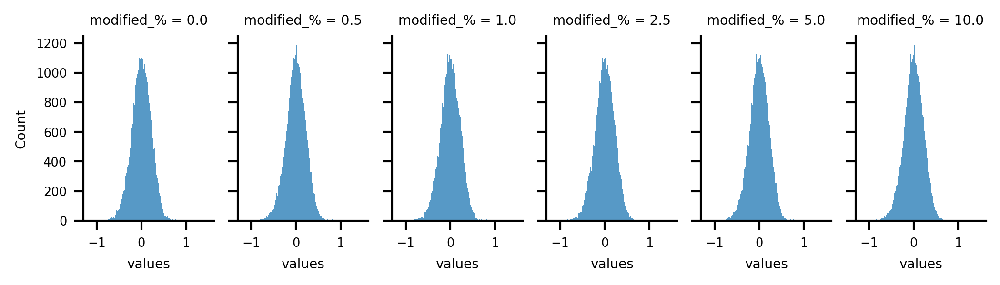

In [19]:
fg = sns.displot(
    data=shuffled_desc_dfs,
    x="values",
    col="modified_%",
    row=None,
    height=2,
    aspect=0.5,
    edgecolor=None,
    lw=0,
)
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S1.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S1.eps")

Figure S2


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


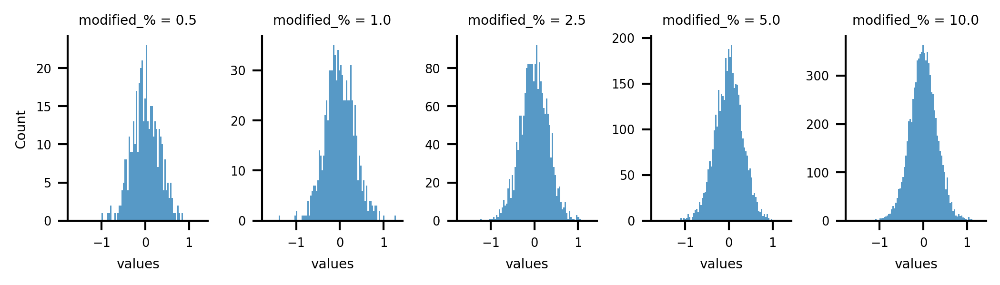

In [20]:
fg = plot_distribution_deltas(
    shuffled_desc_dfs, noisy_desc_df, "values", height=2, aspect=0.5
)
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S2.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S2.eps")

Figure S3


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


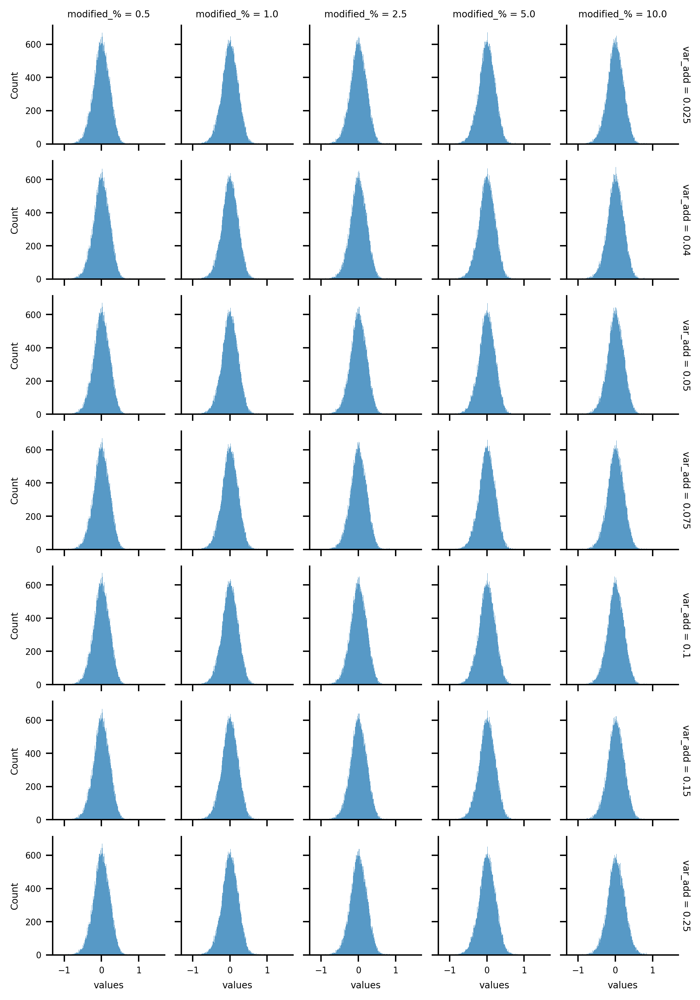

In [21]:
fg = sns.displot(
    data=variable_add_desc_dfs,
    x="values",
    col="modified_%",
    row="var_add",
    height=1.5,
    aspect=0.5,
    edgecolor=None,
    lw=0,
    facet_kws=dict(margin_titles=True),
)
fg.set_titles(template="{row_var} = {row_name}\n{col_var} = {col_name}")
fg.figure.set_dpi(300)
fg.figure.set_size_inches(7, 10)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S3.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S3.eps")

Figure S4


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


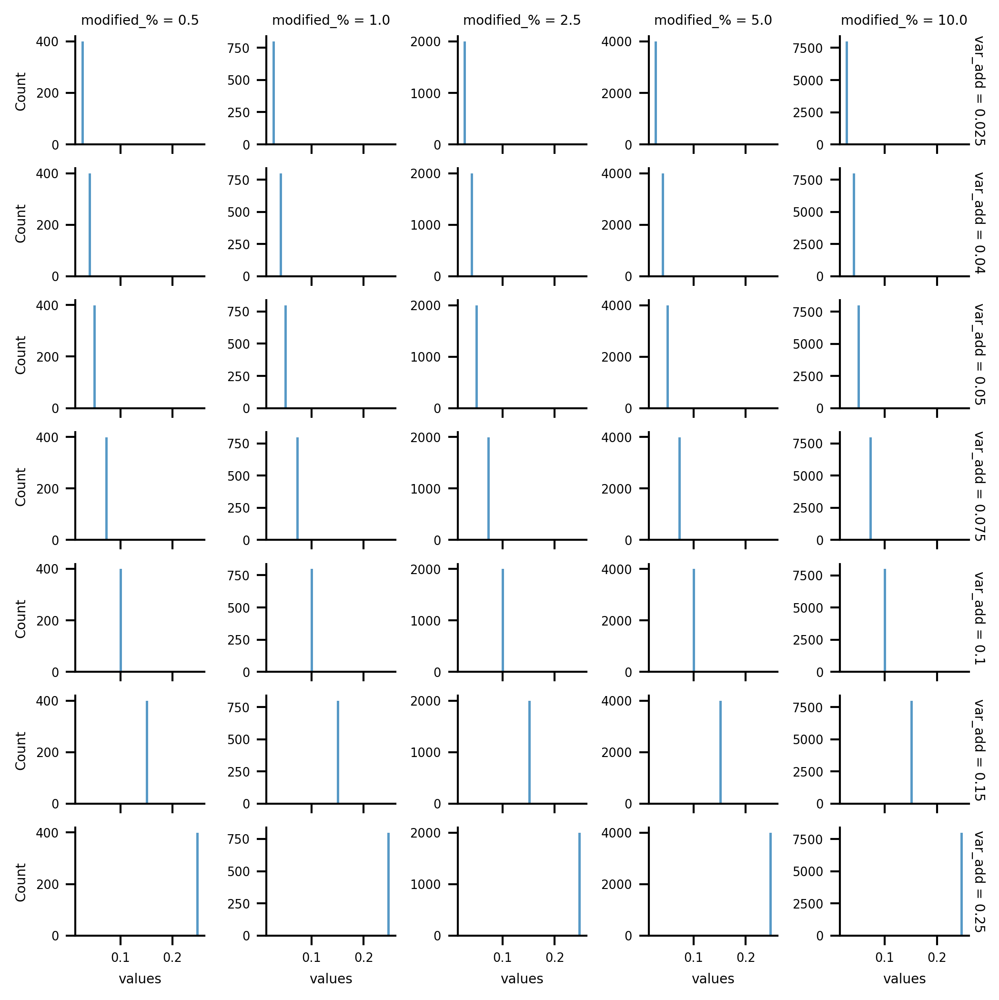

In [22]:
fg = plot_distribution_deltas(
    variable_add_desc_dfs, noisy_desc_df, "values", margin_titles=True
)
fg.set_titles(template="{row_var} = {row_name}\n{col_var} = {col_name}")
fg.figure.set_dpi(300)
fg.figure.set_size_inches(7, 7)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S4.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S4.eps")

Figure S5


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


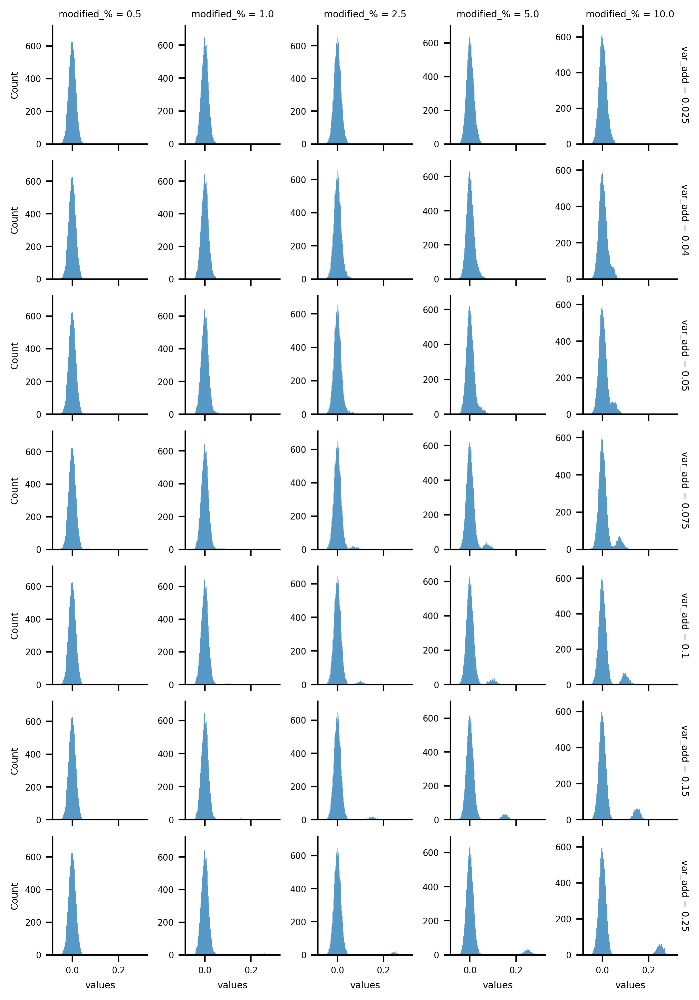

In [23]:
fg = plot_distribution_deltas(
    variable_add_desc_dfs, base_desc_df, "values", margin_titles=True
)
fg.set_titles(template="{row_var} = {row_name}\n{col_var} = {col_name}")
fg.figure.set_dpi(300)
fg.figure.set_size_inches(7, 10)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S5.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S5.eps")

Figure S6


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


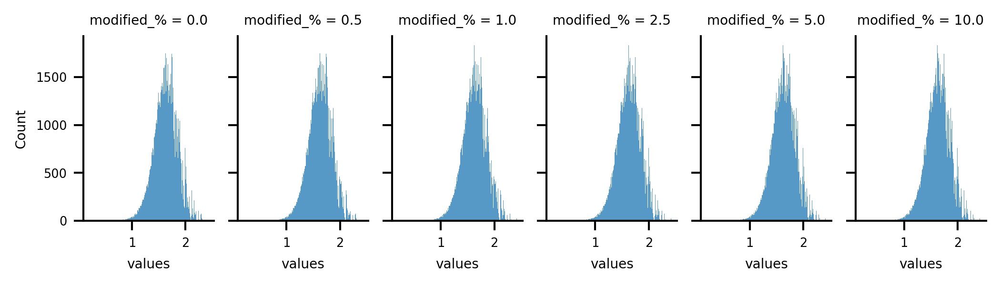

In [24]:
fg = sns.displot(
    data=shuffled_qm9_dfs,
    x="values",
    col="modified_%",
    row=None,
    height=2,
    aspect=1,
    edgecolor=None,
    lw=0,
)
# fg.set_titles(template="{row_var} = {row_name}\n{col_var} = {col_name}")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S6.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S6.eps")

Figure S7


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


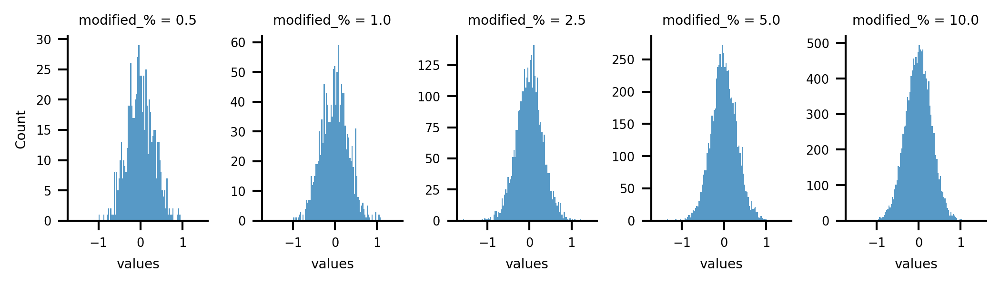

In [25]:
fg = plot_distribution_deltas(
    shuffled_qm9_dfs, base_qm9_df, "values", height=2, aspect=0.5
)
# fg.set_titles(template="{row_var} = {row_name}\n{col_var} = {col_name}")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S7.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S7.eps")

Figure S8


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


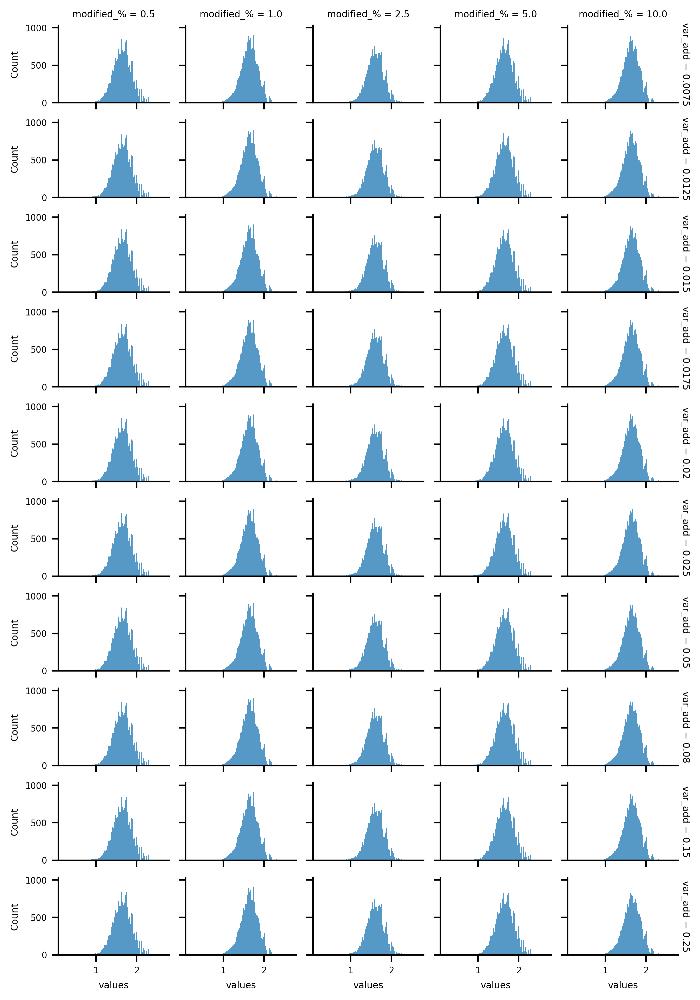

In [26]:
fg = sns.displot(
    data=variable_add_qm9_dfs,
    x="values",
    col="modified_%",
    row="var_add",
    height=2,
    aspect=0.5,
    edgecolor=None,
    lw=0,
    facet_kws=dict(margin_titles=True),
)
fg.figure.set_dpi(300)
fg.figure.set_size_inches(7, 10)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S8.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S8.eps")

Figure S9


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


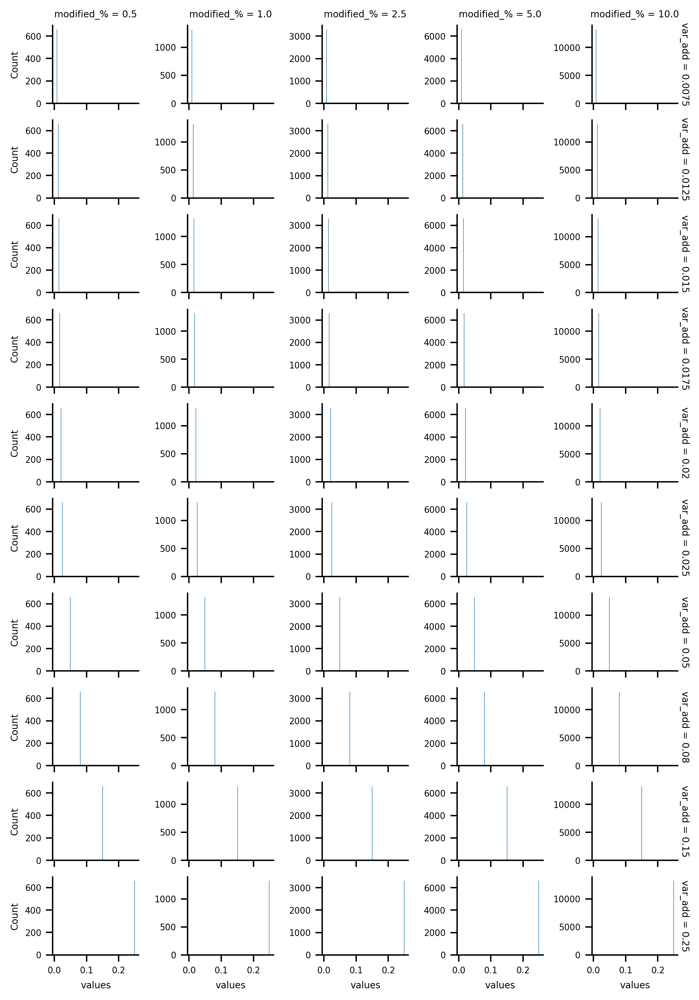

In [27]:
fg = plot_distribution_deltas(
    variable_add_qm9_dfs, base_qm9_df, "values", height=2, aspect=1, margin_titles=True
)
fg.figure.set_dpi(300)
fg.figure.set_size_inches(7, 10)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S9.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S9.eps")

## Results and Discussion


### Impact of Errors in Training Datasets on Prediction Accuracy


Figure 1


array([3.34645669, 2.5       ])

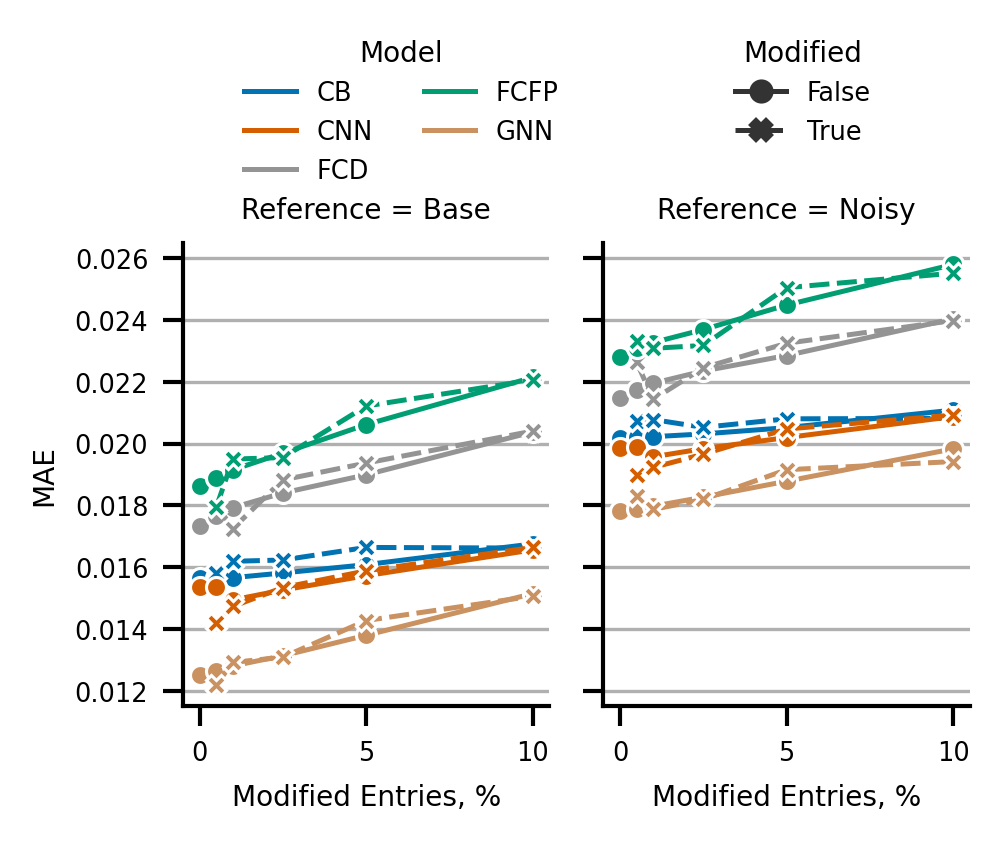

In [ ]:
noisy_stats = calc_models_diffs(
    dataframe=shuffled_desc_dfs,
    ref_data=noisy_desc_df,
)
noisy_stats["modified"] = get_modified_entries(
    data=shuffled_desc_dfs, ref_data=noisy_desc_df
)
clean_stats = calc_models_diffs(
    dataframe=shuffled_desc_dfs,
    ref_data=base_desc_df,
)
clean_stats["modified"] = get_modified_entries(
    data=shuffled_desc_dfs, ref_data=noisy_desc_df
)
plot_df = pd.concat({"Noisy": noisy_stats, "Base": clean_stats}, names=["Reference"])
plot_df["model_name"] = plot_df["model_name"].str.upper()
plot_df = plot_df.set_index(["model_name", "modified"], append=True)
plot_df.index.rename(
    ["Reference", "Modified Entries, %", "#", "Model", "Modified"], inplace=True
)
id_vars = ["Modified Entries, %", "Model", "Reference", "Modified"]
plot_df = plot_df.groupby(id_vars)["delta_abs"].mean().to_frame("MAE").reset_index()
# plot_df
sns.set_context("paper", font_scale=0.7)
fg = sns.relplot(
    data=plot_df,
    x="Modified Entries, %",
    y="MAE",
    style="Modified",
    row=None,
    col="Reference",
    hue="Model",
    kind="line",
    markers=True,
    palette="colorblind_reordered",
    height=2.5,
    aspect=0.6,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y")

handles, labels = fg.axes[0, 0].get_legend_handles_labels()

# Separate by your variables
model_handles = [h for h, l in zip(handles, labels) if l in plot_df["Model"].unique()]
model_labels = [l for l in labels if l in plot_df["Model"].unique()]

mod_handles = [
    h for h, l in zip(handles, labels) if l in plot_df["Modified"].unique().astype(str)
]
mod_labels = [l for l in labels if l in plot_df["Modified"].unique().astype(str)]

# Remove the auto legend
fg.legend.remove()

# Add them back separately
fg.figure.legend(
    model_handles,
    model_labels,
    title="Model",
    loc="upper center",
    bbox_to_anchor=(0.4, 1.1),
    ncol=2,
    frameon=False,
)

fg.figure.legend(
    mod_handles,
    mod_labels,
    title="Modified",
    loc="upper center",
    bbox_to_anchor=(0.8, 1.1),
    ncol=1,
    frameon=False,
)
fg.figure.set_dpi(300)
fg.figure.set_figwidth(85 / 25.4)
fg.tight_layout(rect=(0, 0, 1, 0.9))
fg.savefig(BASE_DIR / "reports/figures/Figure_1.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_1.eps")
np.array(fg.figure.get_size_inches())
# fg.figure.get_tightbbox()

Figure S10


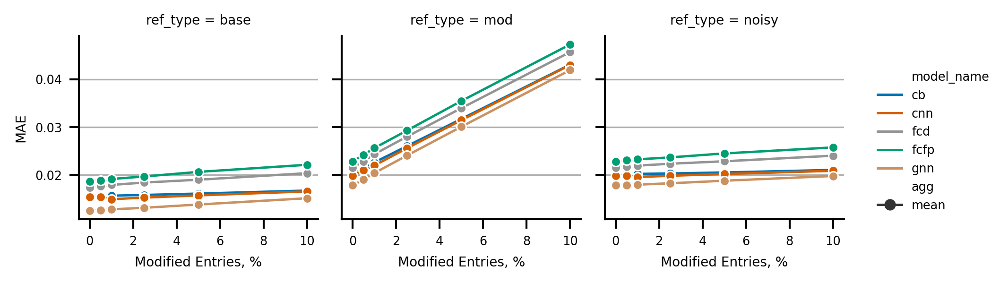

In [29]:
fg = plot_stats_models(
    dataframe=shuffled_desc_dfs,
    ref_data=noisy_desc_df,
    original_data=base_desc_df,
    model_names=MODEL_NAMES,
    data_offset=DEFAULT_DATA_OFFSET,
    x_var="modified_%",
    hue="model_name",
    col="ref_type",
    # style="modified",
    row=None,
    agg="mean",
    delta_type="delta_abs",
    split_modified=False,
    ignore_mod_df=False,
    facet_kws=dict(
        sharey="row",
    ),
    height=2,
    aspect=1,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y")
fg.set_ylabels("MAE")
fg.set_xlabels("Modified Entries, %")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S10.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S10.eps")

Figure S11


[7.08661417 4.        ]


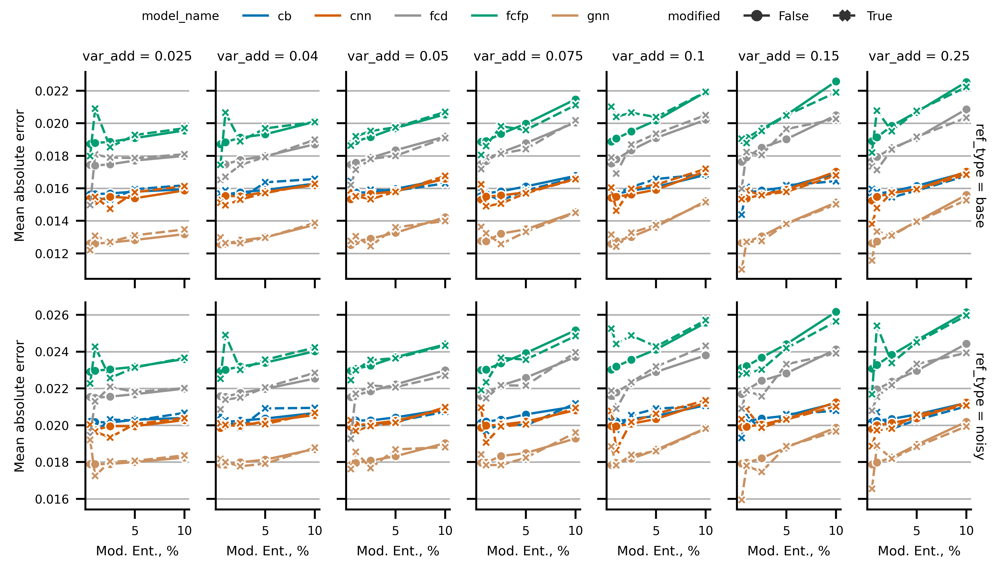

In [30]:
fg = plot_stats_models(
    dataframe=variable_add_desc_dfs,
    ref_data=noisy_desc_df,
    original_data=base_desc_df,
    model_names=MODEL_NAMES,
    data_offset=DEFAULT_DATA_OFFSET,
    x_var="modified_%",
    hue="model_name",
    row="ref_type",
    style="modified",
    col="var_add",
    agg="mean",
    delta_type="delta_abs",
    split_modified=True,
    ignore_mod_df=True,
    facet_kws=dict(sharey="row", margin_titles=True),
    height=2,
    aspect=0.75,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y")
fg.set_ylabels("Mean absolute error")
fg.set_xlabels("Mod. Ent., %")
fg.figure.set_dpi(600)
fg.figure.set_figwidth(180 / 25.4)
fg.set_titles(template="{col_var} = {col_name}\n{row_var} = {row_name}")
sns.move_legend(fg, loc="upper center", ncols=10)
fg.tight_layout(rect=(0, 0, 1, 0.95))
print(fg.figure.get_size_inches())
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S11.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S11.eps")

Figure S12


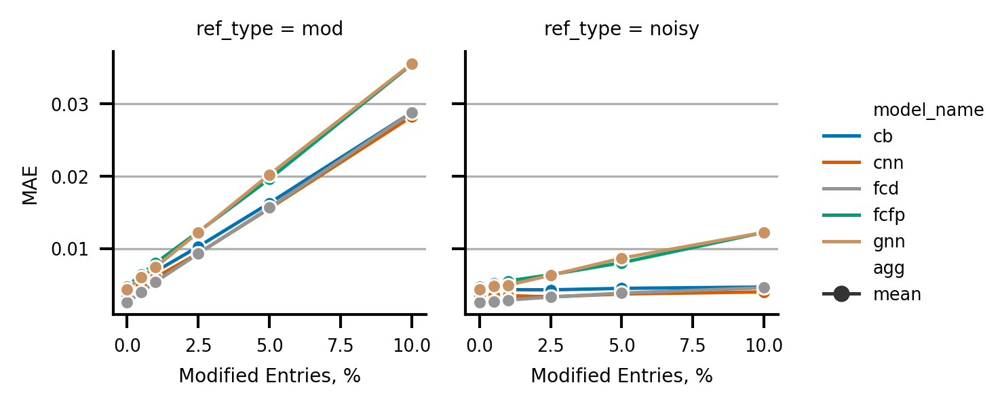

In [31]:
fg = plot_stats_models(
    dataframe=shuffled_qm9_dfs,
    ref_data=base_qm9_df,
    # original_data=base_qm9_df,
    model_names=MODEL_NAMES,
    data_offset=DEFAULT_DATA_OFFSET,
    x_var="modified_%",
    hue="model_name",
    col="ref_type",
    # style="modified",
    row=None,
    agg="mean",
    delta_type="delta_abs",
    split_modified=False,
    ignore_mod_df=False,
    facet_kws=dict(
        sharey="row",
    ),
    height=2,
    aspect=1,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y")
fg.set_ylabels("MAE")
fg.set_xlabels("Modified Entries, %")
fg.figure.set_dpi(300)
# fg.figure.set_figwidth(7)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S12.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S12.eps")

### Correlations Between Errors of Predictions of the Models


Figure 2


array([3.34645669, 4.95      ])

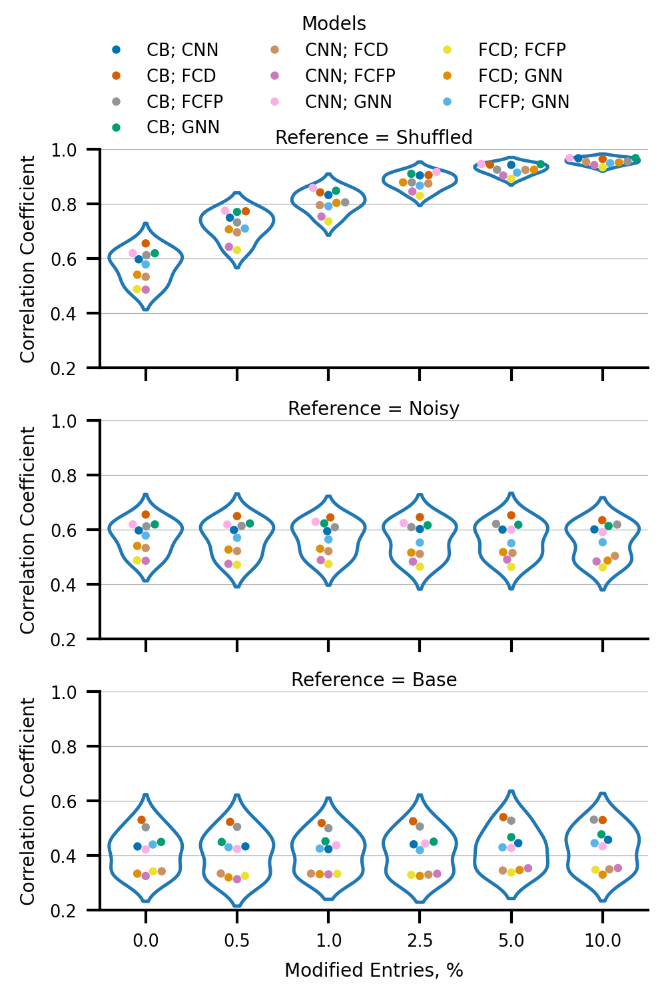

In [ ]:
mod_corr = calc_diffs_corrs(dataframe=shuffled_desc_dfs, ref_data=None, data_offset=1.5)
noisy_corr = calc_diffs_corrs(
    dataframe=shuffled_desc_dfs, ref_data=noisy_desc_df, data_offset=1.5
)
clean_corr = calc_diffs_corrs(
    dataframe=shuffled_desc_dfs, ref_data=base_desc_df, data_offset=1.5
)
plot_df = pd.concat(
    {"Shuffled": mod_corr, "Noisy": noisy_corr, "Base": clean_corr}, names=["Reference"]
)
# plot_df = plot_df.set_index("Reference", append=True)

plot_df.columns.name = "model_name_2"
plot_df = plot_df.melt(ignore_index=False).reset_index(
    # level=-1
)
plot_df = plot_df[plot_df["model_name"] != plot_df["model_name_2"]]
plot_df["pair"] = plot_df[["model_name", "model_name_2"]].apply(
    lambda x: "; ".join(sorted(x)), axis=1
)
plot_df = plot_df.sort_values("pair")
plot_df["pair"] = plot_df["pair"].str.upper()
id_vars = ["modified_%", "pair", "Reference"]
id_vars = [x for x in id_vars if x in plot_df.columns]
plot_df = plot_df.drop_duplicates(id_vars)
plot_df = plot_df.drop(columns=["model_name", "model_name_2"])
plot_df.columns = [
    "Reference",
    "Modified Entries, %",
    "Correlation Coefficient",
    "Models",
]
sns.set_context("paper", font_scale=0.7)
fg = sns.FacetGrid(
    plot_df, row="Reference", col=None, height=1.65, aspect=2, sharey=True
)
fg.map_dataframe(
    sns.swarmplot,
    # sns.stripplot,
    x="Modified Entries, %",
    y="Correlation Coefficient",
    hue="Models",
    palette="colorblind_reordered",
    s=3,
    # marker="_",
    # linewidth=2,
)
fg.map_dataframe(
    sns.violinplot,
    x="Modified Entries, %",
    y="Correlation Coefficient",
    # hue="Reference",
    inner=None,
    fill=False,
    density_norm="width",
    # palette="colorblind_reordered",
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
    ax.set_title(y=0.975, label=ax.title.get_text(), pad=4)
fg.set(ylim=(0.2, 1.0))
fg.add_legend(title="Models")
sns.move_legend(fg, "upper center", ncols=3)
fg.figure.set_dpi(300)
fg.figure.set_figwidth(85 / 25.4)
fg.figure.subplots_adjust(hspace=0.1, bottom=0.1)
fg.tight_layout(rect=(0, 0, 1, 0.9))
fg.savefig(BASE_DIR / "reports/figures/Figure_2.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_2.eps")
np.array(fg.figure.get_size_inches())

array([6.1655, 3.    ])

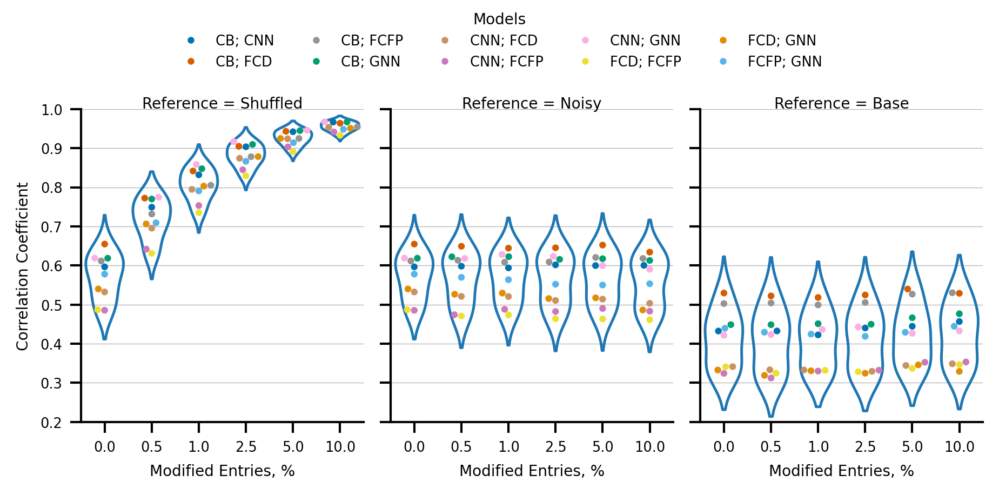

In [ ]:
mod_corr = calc_diffs_corrs(dataframe=shuffled_desc_dfs, ref_data=None, data_offset=1.5)
noisy_corr = calc_diffs_corrs(
    dataframe=shuffled_desc_dfs, ref_data=noisy_desc_df, data_offset=1.5
)
clean_corr = calc_diffs_corrs(
    dataframe=shuffled_desc_dfs, ref_data=base_desc_df, data_offset=1.5
)
plot_df = pd.concat(
    {"Shuffled": mod_corr, "Noisy": noisy_corr, "Base": clean_corr}, names=["Reference"]
)
# plot_df = plot_df.set_index("Reference", append=True)

plot_df.columns.name = "model_name_2"
plot_df = plot_df.melt(ignore_index=False).reset_index(
    # level=-1
)
plot_df = plot_df[plot_df["model_name"] != plot_df["model_name_2"]]
plot_df["pair"] = plot_df[["model_name", "model_name_2"]].apply(
    lambda x: "; ".join(sorted(x)), axis=1
)
plot_df = plot_df.sort_values("pair")
plot_df["pair"] = plot_df["pair"].str.upper()
id_vars = ["modified_%", "pair", "Reference"]
id_vars = [x for x in id_vars if x in plot_df.columns]
plot_df = plot_df.drop_duplicates(id_vars)
plot_df = plot_df.drop(columns=["model_name", "model_name_2"])
plot_df.columns = [
    "Reference",
    "Modified Entries, %",
    "Correlation Coefficient",
    "Models",
]
sns.set_context("paper", font_scale=0.7)
fg = sns.FacetGrid(
    plot_df, col="Reference", row=None, height=3, aspect=0.6, sharey=True
)
fg.map_dataframe(
    sns.swarmplot,
    # sns.stripplot,
    x="Modified Entries, %",
    y="Correlation Coefficient",
    hue="Models",
    palette="colorblind_reordered",
    s=3,
    # marker="_",
    # linewidth=2,
)
fg.map_dataframe(
    sns.violinplot,
    x="Modified Entries, %",
    y="Correlation Coefficient",
    # hue="Reference",
    inner=None,
    fill=False,
    density_norm="width",
    # palette="colorblind_reordered",
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
    ax.set_title(y=0.975, label=ax.title.get_text(), pad=4)
fg.set(ylim=(0.2, 1.0))
fg.add_legend(title="Models")
sns.move_legend(fg, "upper center", ncols=5)
fg.figure.set_dpi(300)
# fg.figure.set_figwidth(85 / 25.4)
fg.figure.subplots_adjust(hspace=0.1, bottom=0.1)
fg.tight_layout(rect=(0, 0, 1, 0.85))
fg.savefig(BASE_DIR / "reports/figures/Figure_2-horizontal.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_2-horizontal.eps")
np.array(fg.figure.get_size_inches())

array([6.1655, 3.    ])

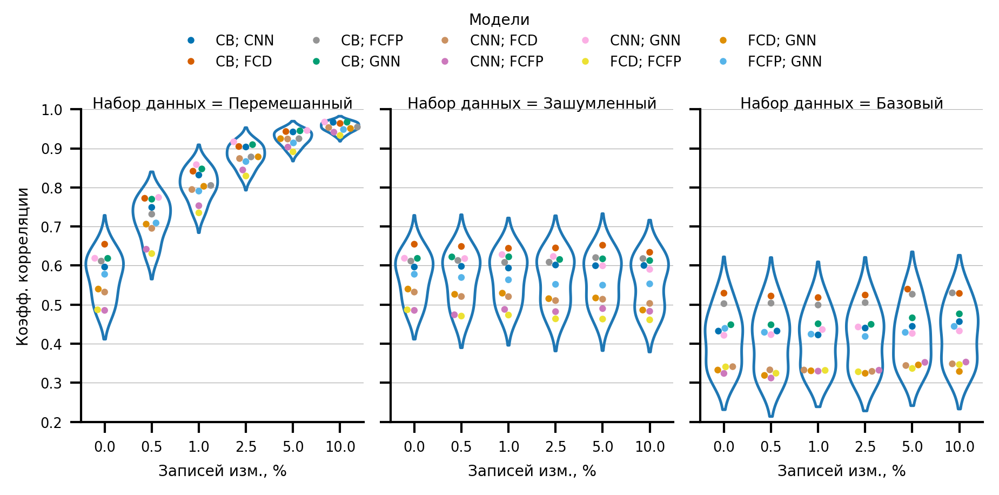

In [ ]:
mod_corr = calc_diffs_corrs(dataframe=shuffled_desc_dfs, ref_data=None, data_offset=1.5)
noisy_corr = calc_diffs_corrs(
    dataframe=shuffled_desc_dfs, ref_data=noisy_desc_df, data_offset=1.5
)
clean_corr = calc_diffs_corrs(
    dataframe=shuffled_desc_dfs, ref_data=base_desc_df, data_offset=1.5
)
plot_df = pd.concat(
    {"Перемешанный": mod_corr, "Зашумленный": noisy_corr, "Базовый": clean_corr}, names=["Reference"]
)
# plot_df = plot_df.set_index("Reference", append=True)

plot_df.columns.name = "model_name_2"
plot_df = plot_df.melt(ignore_index=False).reset_index(
    # level=-1
)
plot_df = plot_df[plot_df["model_name"] != plot_df["model_name_2"]]
plot_df["pair"] = plot_df[["model_name", "model_name_2"]].apply(
    lambda x: "; ".join(sorted(x)), axis=1
)
plot_df = plot_df.sort_values("pair")
plot_df["pair"] = plot_df["pair"].str.upper()
id_vars = ["modified_%", "pair", "Reference"]
id_vars = [x for x in id_vars if x in plot_df.columns]
plot_df = plot_df.drop_duplicates(id_vars)
plot_df = plot_df.drop(columns=["model_name", "model_name_2"])
plot_df.columns = [
    "Набор данных",
    "Modified Entries, %",
    "Correlation Coefficient",
    "Модель",
]
sns.set_context("paper", font_scale=0.7)
fg = sns.FacetGrid(
    plot_df, col="Набор данных", row=None, height=3, aspect=0.6, sharey=True
)
fg.map_dataframe(
    sns.swarmplot,
    # sns.stripplot,
    x="Modified Entries, %",
    y="Correlation Coefficient",
    hue="Модель",
    palette="colorblind_reordered",
    s=3,
    # marker="_",
    # linewidth=2,
)
fg.map_dataframe(
    sns.violinplot,
    x="Modified Entries, %",
    y="Correlation Coefficient",
    # hue="Reference",
    inner=None,
    fill=False,
    density_norm="width",
    # palette="colorblind_reordered",
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
    ax.set_title(y=0.975, label=ax.title.get_text(), pad=4)
fg.set(ylim=(0.2, 1.0))
fg.add_legend(title="Модели")
sns.move_legend(fg, "upper center", ncols=5)
fg.figure.set_dpi(300)
# fg.figure.set_figwidth(85 / 25.4)
fg.figure.subplots_adjust(hspace=0.1, bottom=0.1)
fg.tight_layout(rect=(0, 0, 1, 0.85))
fg.set_xlabels("Записей изм., %")
fg.set_ylabels("Коэфф. корреляции")
fg.savefig(BASE_DIR / "reports/figures/Figure_2-horizontal-ru.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_2-horizontal-ru.eps")
np.array(fg.figure.get_size_inches())

Figure S13a


d:\Research\project-filtering\.venv\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 30.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


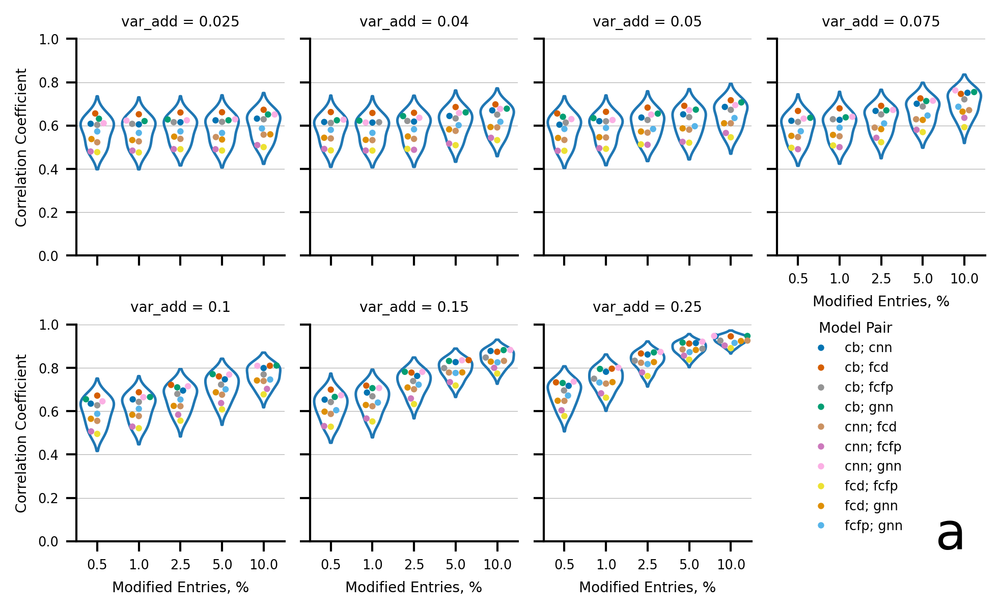

In [33]:
fg = plot_delta_correlations(variable_add_desc_dfs, s=3, height=2, aspect=1.5, col_wrap=4)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
fg.set(ylim=(0, 1))
fg.set_xlabels("Modified Entries, %")
fg.set_ylabels("Correlation Coefficient")
fg.legend.set_title("Model Pair")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
sns.move_legend(fg, loc="center", bbox_to_anchor=(0.8, 0.3))
fg.figure.text(x=0.875, y=0.1, s="a", fontsize=24)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S13a.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S13a.eps")

Figure S13b

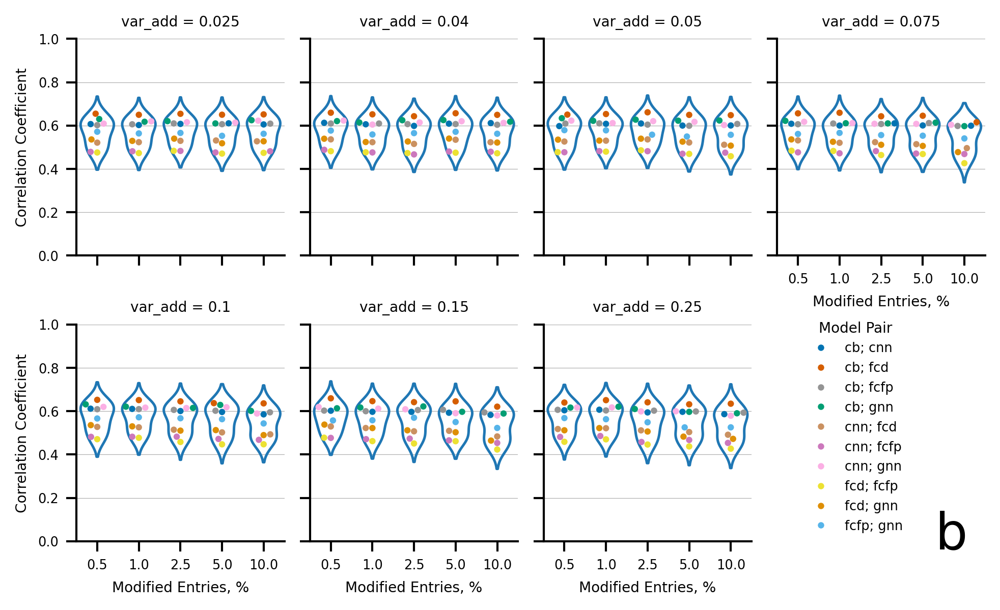

In [34]:
fg = plot_delta_correlations(
    variable_add_desc_dfs, ref_data=noisy_desc_df, s=3, height=2, aspect=1.5, col_wrap=4
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
fg.set(ylim=(0, 1))
fg.set_xlabels("Modified Entries, %")
fg.set_ylabels("Correlation Coefficient")
fg.legend.set_title("Model Pair")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
sns.move_legend(fg, loc="center", bbox_to_anchor=(0.8, 0.3))
fg.figure.text(x=0.875, y=0.1, s="b", fontsize=24)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S13b.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S13b.eps")

Figure S13c

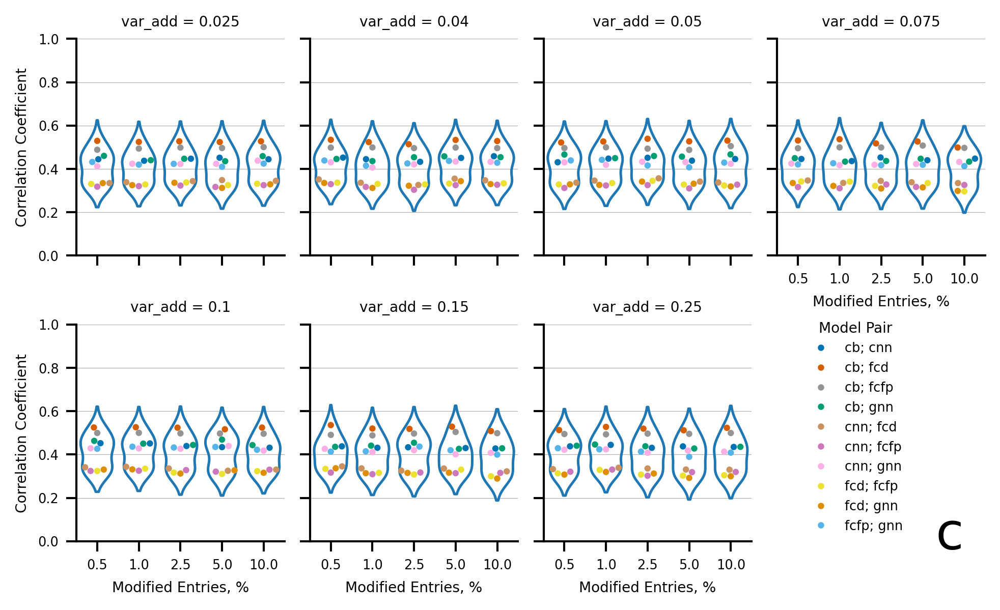

In [35]:
fg = plot_delta_correlations(
    variable_add_desc_dfs, ref_data=base_desc_df, s=3, height=2, aspect=1.5, col_wrap=4
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
fg.set(ylim=(0, 1))
fg.set_xlabels("Modified Entries, %")
fg.set_ylabels("Correlation Coefficient")
fg.legend.set_title("Model Pair")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
sns.move_legend(fg, loc="center", bbox_to_anchor=(0.8, 0.3))
fg.figure.text(x=0.875, y=0.1, s="c", fontsize=24)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S13c.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S13c.eps")

Figure S14a


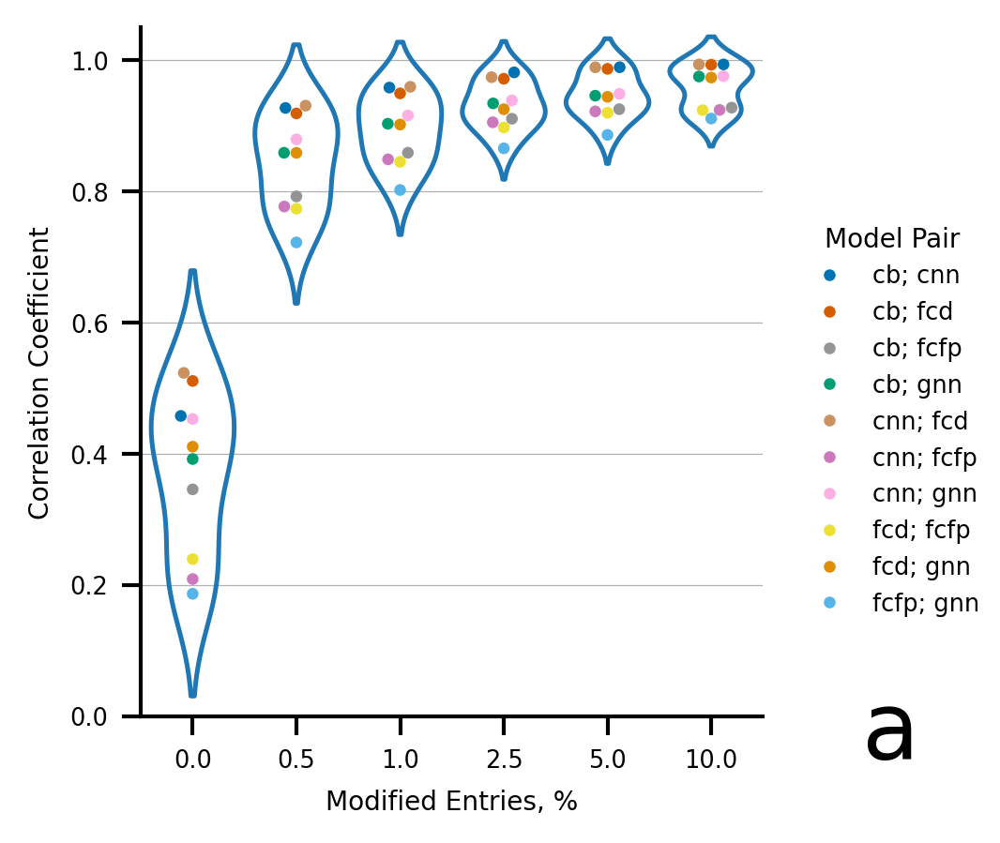

In [36]:
fg = plot_delta_correlations(shuffled_qm9_dfs, s=3, height=3, aspect=1)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
fg.set(ylim=(0, 1.05))
fg.set_xlabels("Modified Entries, %")
fg.set_ylabels("Correlation Coefficient")
fg.legend.set_title("Model Pair")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(3.5)
fg.figure.text(x=0.875, y=0.1, s="a", fontsize=24)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S14a.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S14a.eps")

Figure S14b

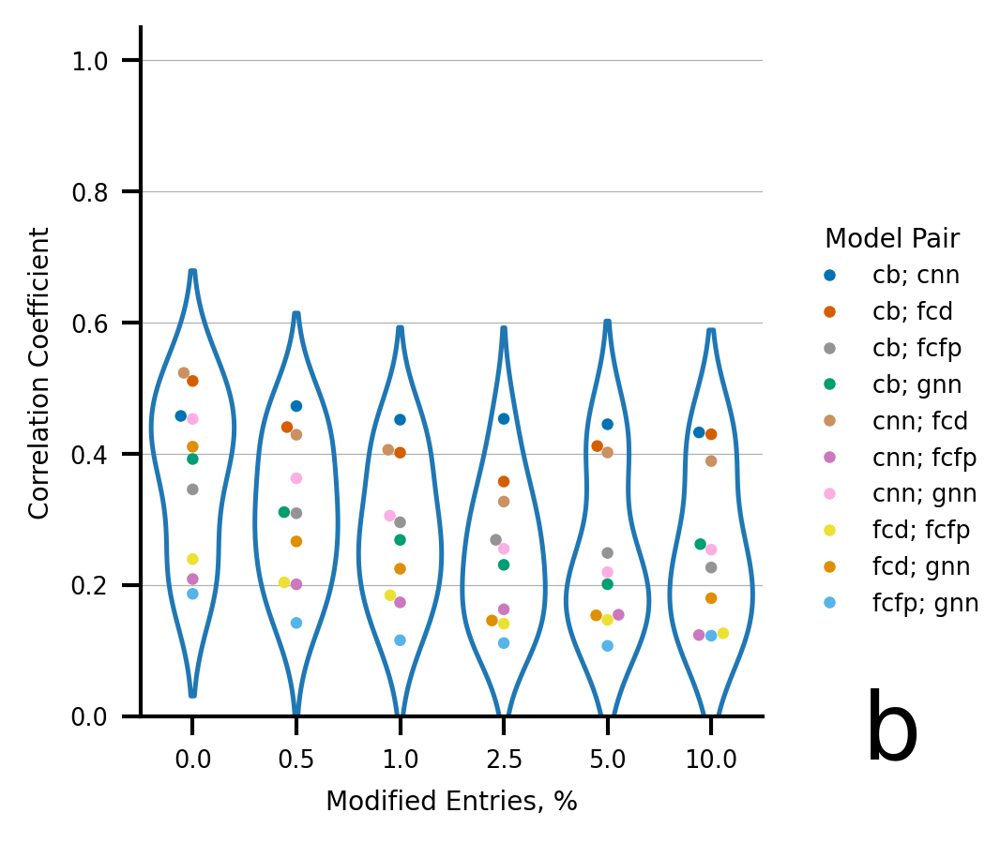

In [37]:
fg = plot_delta_correlations(
    shuffled_qm9_dfs, ref_data=base_qm9_df, s=3, height=3, aspect=1
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
fg.set(ylim=(0, 1.05))
fg.set_xlabels("Modified Entries, %")
fg.set_ylabels("Correlation Coefficient")
fg.legend.set_title("Model Pair")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(3.5)
fg.figure.text(x=0.875, y=0.1, s="b", fontsize=24)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S14b.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S14b.eps")

Figure S15a


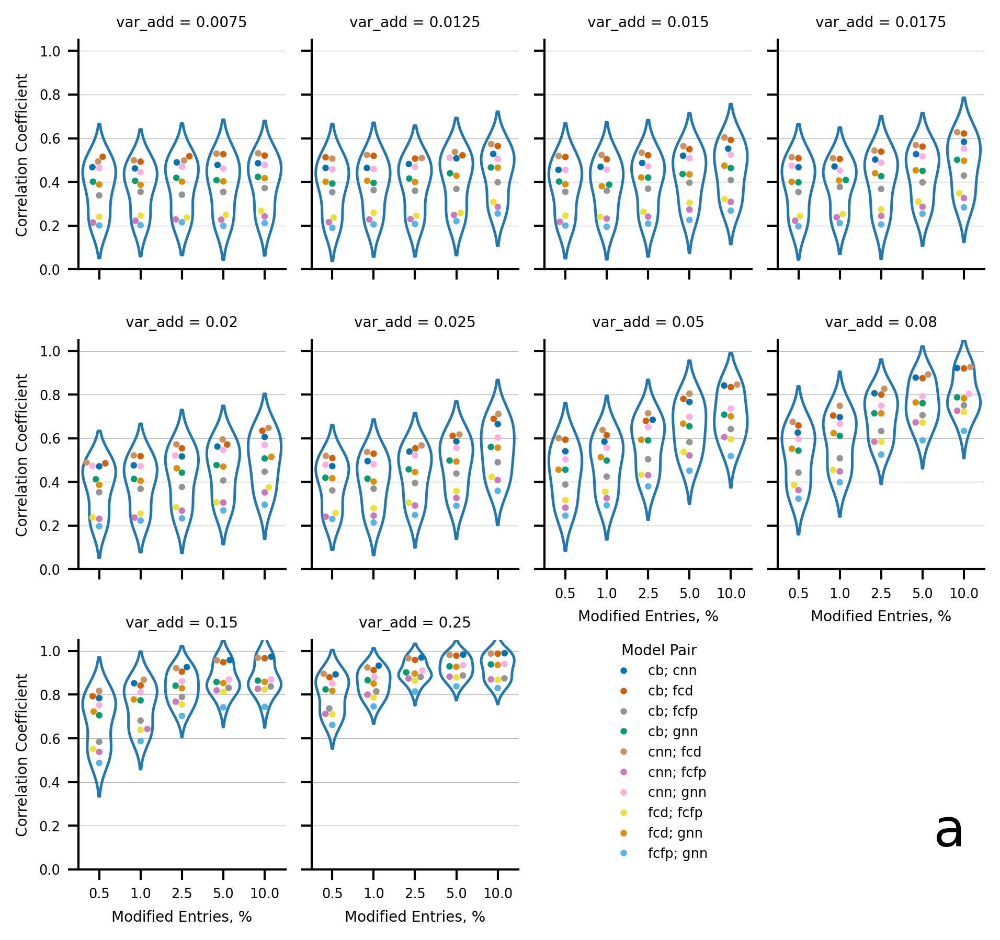

In [38]:
fg = plot_delta_correlations(variable_add_qm9_dfs, s=3, height=2, aspect=1, col_wrap=4)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
fg.set(ylim=(0, 1.05))
fg.set_xlabels("Modified Entries, %")
fg.set_ylabels("Correlation Coefficient")
fg.legend.set_title("Model Pair")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
sns.move_legend(fg, loc="center", bbox_to_anchor=(0.6, 0.2))
fg.figure.text(x=0.85, y=0.1, s="a", fontsize=24)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S15a.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S15a.eps")

Figure S15b

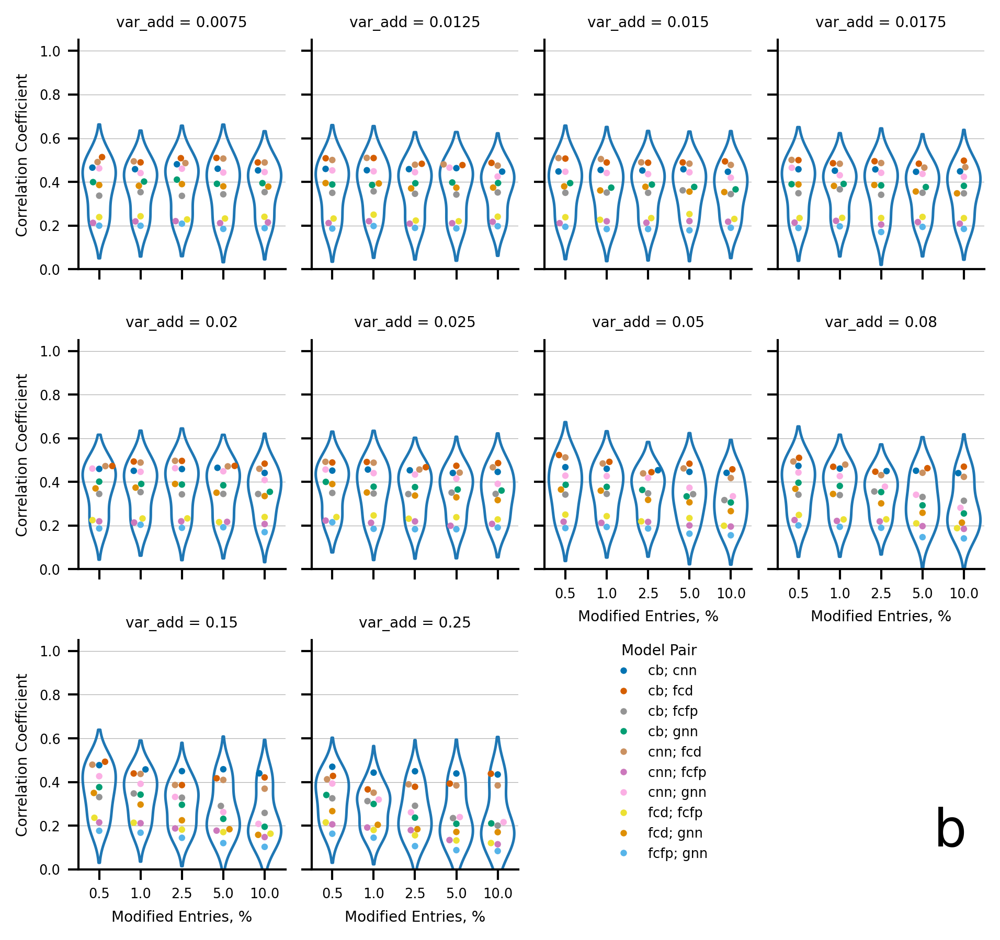

In [39]:
fg = plot_delta_correlations(
    variable_add_qm9_dfs, ref_data=base_qm9_df, s=3, height=2, aspect=1, col_wrap=4
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
fg.set(ylim=(0, 1.05))
fg.set_xlabels("Modified Entries, %")
fg.set_ylabels("Correlation Coefficient")
fg.legend.set_title("Model Pair")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
sns.move_legend(fg, loc="center", bbox_to_anchor=(0.6, 0.2))
fg.figure.text(x=0.85, y=0.1, s="b", fontsize=24)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S15b.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S15b.eps")

Figure S16a


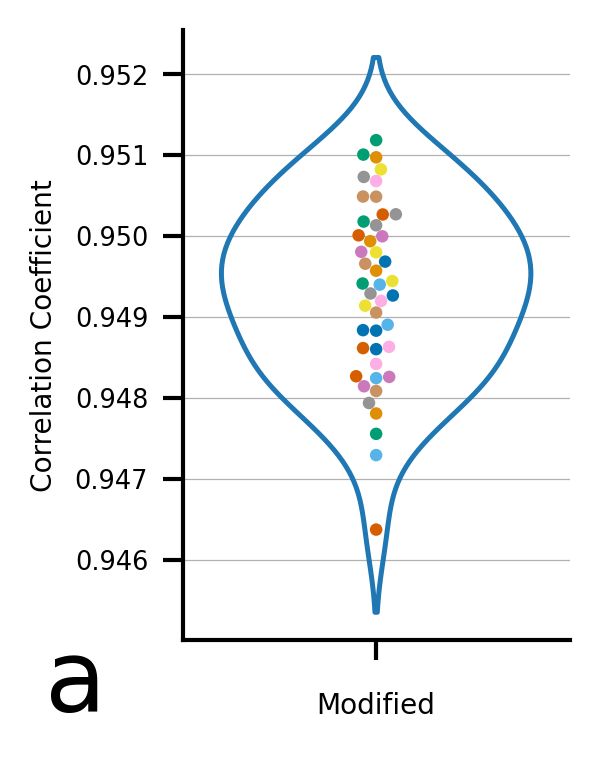

In [40]:
fg = plot_delta_correlations(
    gnn_df,
    model_names=gnn_models,
    x=None,
    s=3,
    height=2.5,
    aspect=0.75,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
# fg.set(ylim=(0, 1.05))
fg.set_xlabels("Modified")
fg.set_ylabels("Correlation Coefficient")
# fg.legend.set_title("Model Pair")
fg.legend.remove()
fg.figure.set_dpi(300)
fg.figure.set_size_inches(2, 2.5)
fg.figure.text(x=0.075, y=0.05, s="a", fontsize=24)
fg.tight_layout(rect=(0, 0, 1, 1))
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S16a.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S16a.eps")

Figure S16b

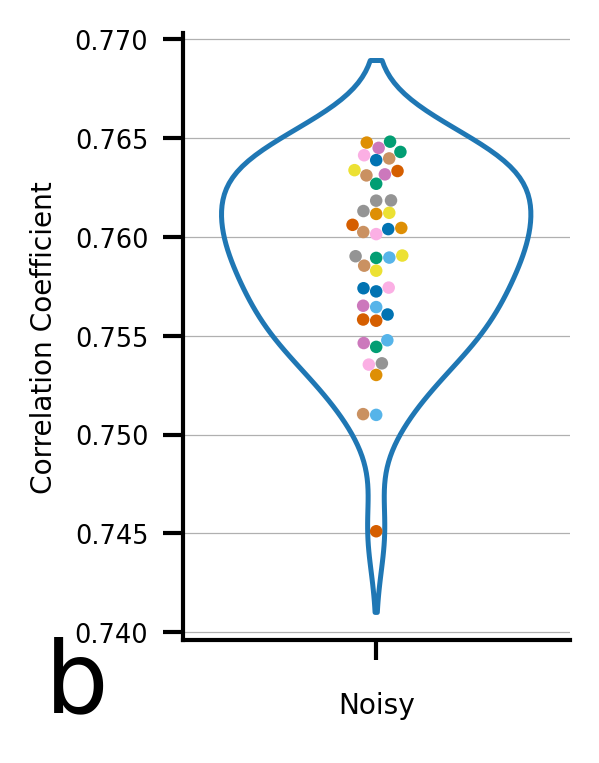

In [41]:
fg = plot_delta_correlations(
    gnn_df,
    ref_data=noisy_desc_df,
    model_names=gnn_models,
    x=None,
    s=3,
    height=2.5,
    aspect=0.75,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
# fg.set(ylim=(0, 1.05))
fg.set_xlabels("Noisy")
fg.set_ylabels("Correlation Coefficient")
# fg.legend.set_title("Model Pair")
fg.legend.remove()
fg.figure.set_dpi(300)
fg.figure.set_size_inches(2, 2.5)
fg.figure.text(x=0.075, y=0.05, s="b", fontsize=24)
fg.tight_layout(rect=(0, 0, 1, 1))
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S16b.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S16b.eps")

Figure S16c

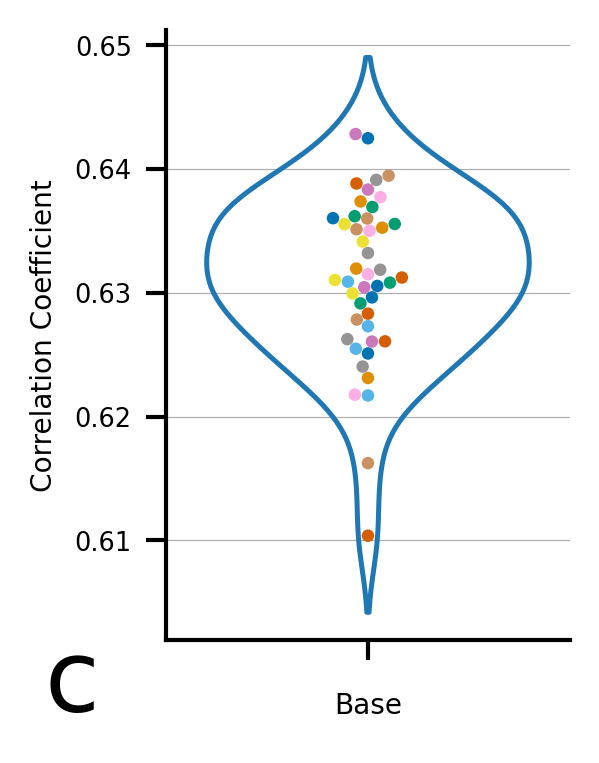

In [42]:
fg = plot_delta_correlations(
    gnn_df,
    ref_data=base_desc_df,
    model_names=gnn_models,
    x=None,
    s=3,
    height=2.5,
    aspect=0.75,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
# fg.set(ylim=(0, 1.05))
fg.set_xlabels("Base")
fg.set_ylabels("Correlation Coefficient")
# fg.legend.set_title("Model Pair")
fg.legend.remove()
fg.figure.set_size_inches(2, 2.5)
fg.figure.set_dpi(300)
fg.figure.text(x=0.075, y=0.05, s="c", fontsize=24)
fg.tight_layout(rect=(0, 0, 1, 1))
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S16c.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S16c.eps")

Figure S17a


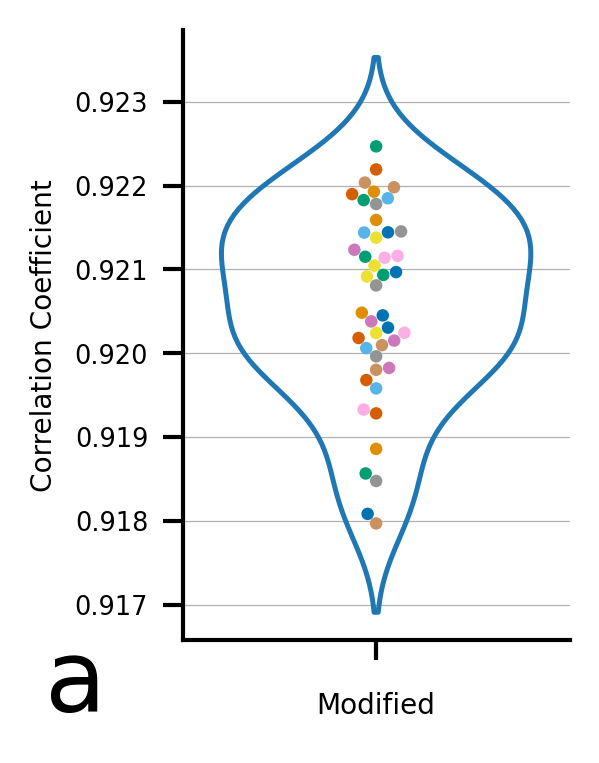

In [43]:
fg = plot_delta_correlations(
    fcfp_df,
    model_names=fcfp_models,
    x=None,
    s=3,
    height=2.5,
    aspect=1,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
# fg.set(ylim=(0, 1.05))
fg.set_xlabels("Modified")
fg.set_ylabels("Correlation Coefficient")
# fg.legend.set_title("Model Pair")
fg.legend.remove()
fg.figure.set_dpi(300)
fg.figure.set_size_inches(2, 2.5)
fg.figure.text(x=0.075, y=0.05, s="a", fontsize=24)
fg.tight_layout(rect=(0, 0, 1, 1))
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S17a.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S17a.eps")

Figure S17b

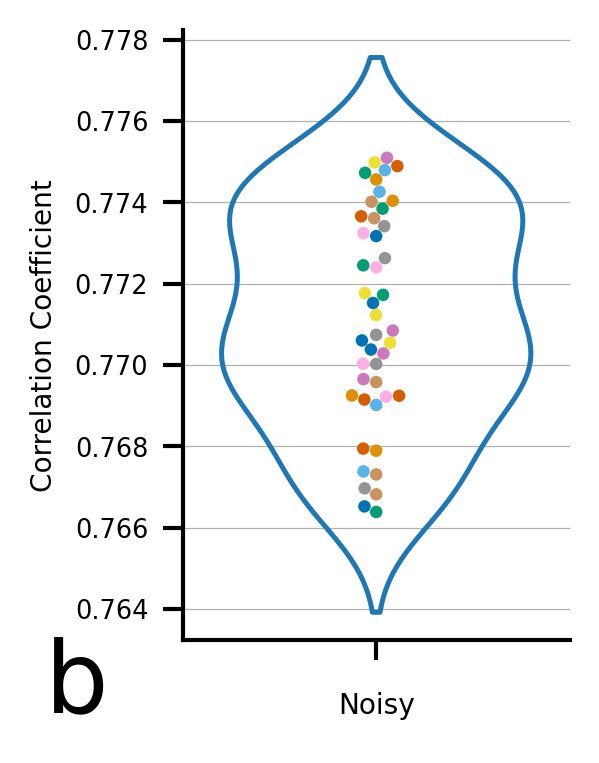

In [44]:
fg = plot_delta_correlations(
    fcfp_df,
    ref_data=noisy_desc_df,
    model_names=fcfp_models,
    x=None,
    s=3,
    height=2.5,
    aspect=1,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
# fg.set(ylim=(0, 1.05))
fg.set_xlabels("Noisy")
fg.set_ylabels("Correlation Coefficient")
# fg.legend.set_title("Model Pair")
fg.legend.remove()
fg.figure.set_size_inches(2, 2.5)
fg.figure.set_dpi(300)
fg.figure.text(x=0.075, y=0.05, s="b", fontsize=24)
fg.tight_layout(rect=(0, 0, 1, 1))
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S17b.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S17b.eps")

Figure S17c

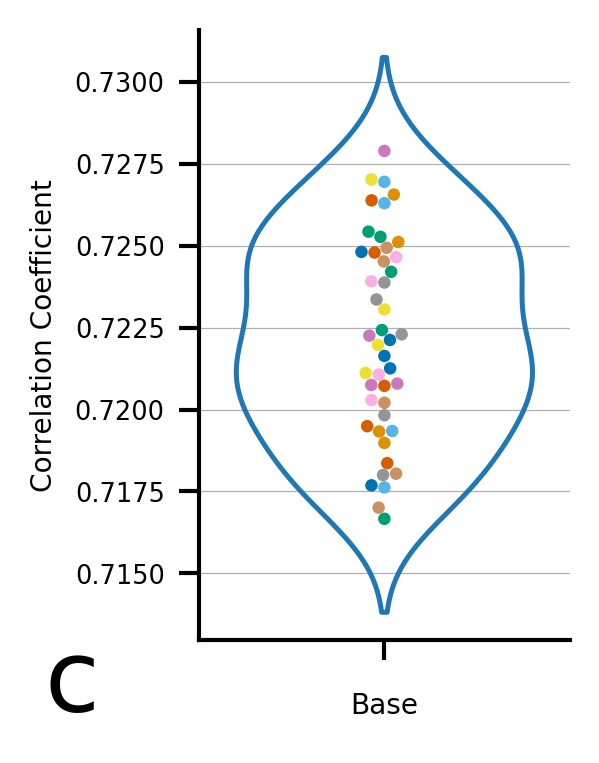

In [45]:
fg = plot_delta_correlations(
    fcfp_df,
    ref_data=base_desc_df,
    model_names=fcfp_models,
    x=None,
    s=3,
    height=2.5,
    aspect=1,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
# fg.set(ylim=(0, 1.05))
fg.set_xlabels("Base")
fg.set_ylabels("Correlation Coefficient")
# fg.legend.set_title("Model Pair")
fg.legend.remove()
fg.figure.set_dpi(300)
fg.figure.set_size_inches(2, 2.5)
fg.figure.text(x=0.075, y=0.05, s="c", fontsize=24)
fg.tight_layout(rect=(0, 0, 1, 1))
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S17c.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S17c.eps")

Figure S18


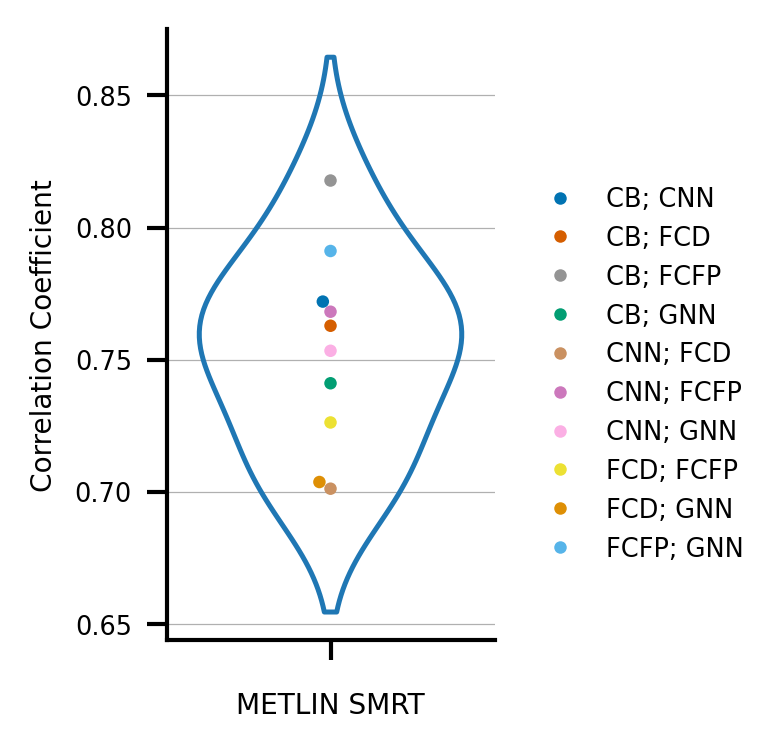

In [46]:
fg = plot_delta_correlations(
    metlin_df,
    model_names=metlin_models,
    value_name="EXP",
    x=None,
    s=3,
    height=2.5,
    aspect=1,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
# fg.set(ylim=(0, 1.05))
fg.set_xlabels("METLIN SMRT")
fg.set_ylabels("Correlation Coefficient")
# fg.legend.set_title("Model Pair")
# fg.legend.remove()
fg.figure.set_dpi(300)
fg.figure.set_figwidth(2.5)
fg.tight_layout(rect=(0, 0, 0.7, 1))
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S18.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S18.eps")

Figure S19


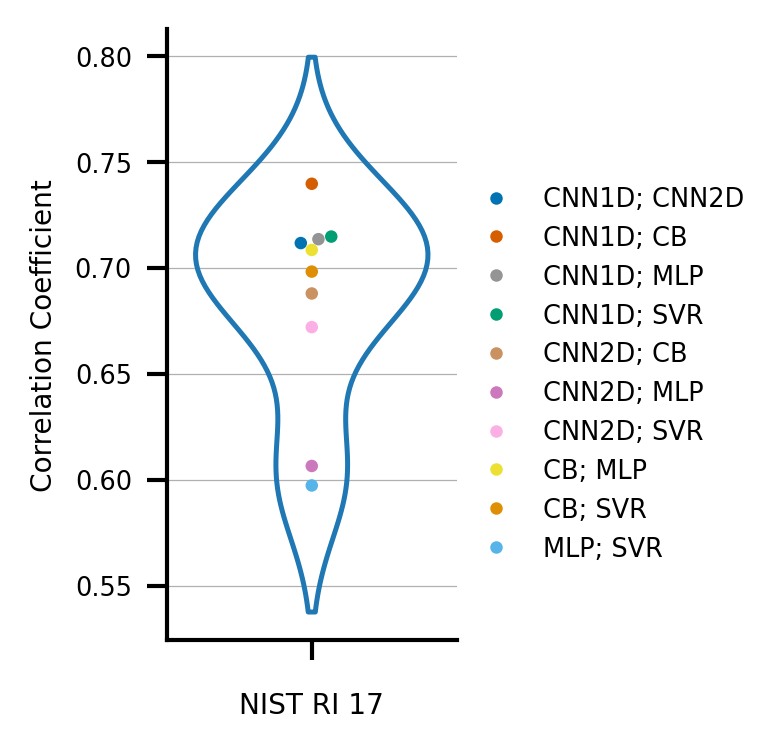

In [47]:
fg = plot_delta_correlations(
    nist_df,
    model_names=nist_models,
    value_name="RI_X",
    x=None,
    s=3,
    height=2.5,
    aspect=1,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
# fg.set(ylim=(0, 1.05))
fg.set_xlabels("NIST RI 17")
fg.set_ylabels("Correlation Coefficient")
handles, labels = fg.ax.get_legend_handles_labels()
new_labels = []
for label in labels:
    new_labels.append(
        label.replace("RI_", "").replace("1D", "CNN1D").replace("2D", "CNN2D")
    )
fg.legend.remove()
fg.figure.legend(handles=handles, labels=new_labels, loc="right", frameon=False)
# fg.legend.set_title("Model Pair")
# fg.legend.remove()
fg.figure.set_dpi(300)
fg.figure.set_figwidth(2.5)
fg.tight_layout(rect=(0, 0, 0.65, 1))
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S19.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S19.eps")

### Single Architecture Performance: A Comparison to Mixture of Models


In [ ]:
gnn_data = calc_classification_metrics_multi_model(
    dataframe=gnn_df,
    ref_dataframe=noisy_desc_df,
    model_names=gnn_models,
    thresholds=np.geomspace(0.1, 100, 100),
)

fcfp_data = calc_classification_metrics_multi_model(
    dataframe=fcfp_df,
    ref_dataframe=noisy_desc_df,
    model_names=fcfp_models,
    thresholds=np.geomspace(0.1, 100, 100),
)

mix_data = calc_classification_metrics_multi_model(
    dataframe=shuffle_comp,
    ref_dataframe=noisy_desc_df,
    model_names=MODEL_NAMES,
    thresholds=np.geomspace(0.1, 100, 100),
)


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Figure 3


In [20]:
gnn_data["models"] = "GNN"
mix_data["models"] = "MIX"
fcfp_data["models"] = "FCFP"
plot_data = pd.concat([gnn_data, fcfp_data, mix_data]).reset_index()[
    ["n_models", "threshold_%", "precision", "recall", "f1", "models"]
]
plot_data.columns = [
    "# Models",
    "threshold_%",
    "Precision",
    "Recall",
    "F1",
    "Models",
]

aucs = {
    "GNN": {},
    "FCFP": {},
    "MIX": {},
}

for i in range(1, 6):
    xs = plot_data.loc[
        (plot_data["# Models"] == i) & (plot_data["Models"] == "MIX"), "Recall"
    ].to_numpy()
    ys = plot_data.loc[
        (plot_data["# Models"] == i) & (plot_data["Models"] == "MIX"), "Precision"
    ].to_numpy()
    # ys = ys[np.argsort(xs)]
    # xs = xs[np.argsort(xs)]
    auc_val = auc(xs, ys)
    aucs["MIX"][i] = auc_val
    # print(i, auc_val)
for i in range(1, 11):
    xs = plot_data.loc[
        (plot_data["# Models"] == i) & (plot_data["Models"] == "GNN"), "Recall"
    ].to_numpy()
    ys = plot_data.loc[
        (plot_data["# Models"] == i) & (plot_data["Models"] == "GNN"), "Precision"
    ].to_numpy()
    # ys = ys[np.argsort(xs)]
    # xs = xs[np.argsort(xs)]
    auc_val = auc(xs, ys)
    aucs["GNN"][i] = auc_val
    # print(i, auc(xs, ys))
for i in range(1, 11):
    xs = plot_data.loc[
        (plot_data["# Models"] == i) & (plot_data["Models"] == "FCFP"), "Recall"
    ].to_numpy()
    ys = plot_data.loc[
        (plot_data["# Models"] == i) & (plot_data["Models"] == "FCFP"), "Precision"
    ].to_numpy()
    # ys = ys[np.argsort(xs)]
    # xs = xs[np.argsort(xs)]
    auc_val = auc(xs, ys)
    aucs["FCFP"][i] = auc_val
    # print(i, auc(xs, ys))
aucs = pd.DataFrame(aucs)
aucs_plot = aucs.melt(
    var_name="Models", value_name="AUCPRC", ignore_index=False
).reset_index(names=["# Models"])
aucs_plot = aucs_plot.loc[np.isin(aucs_plot["# Models"], [1, 5, 10]), :]

[2.80925 3.     ]
[(<matplotlib.lines.Line2D object at 0x000002364A2790A0>, 'Models'), (<matplotlib.lines.Line2D object at 0x000002369E13DDC0>, 'GNN'), (<matplotlib.lines.Line2D object at 0x000002364A29B500>, 'FCFP'), (<matplotlib.lines.Line2D object at 0x000002369E10C230>, 'MIX'), (<matplotlib.lines.Line2D object at 0x000002364A284A40>, '# Models'), (<matplotlib.lines.Line2D object at 0x000002364A286000>, '1'), (<matplotlib.lines.Line2D object at 0x000002364A284B90>, '5'), (<matplotlib.lines.Line2D object at 0x000002369E13FEC0>, '10')]


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


array([4.05320669, 3.        ])

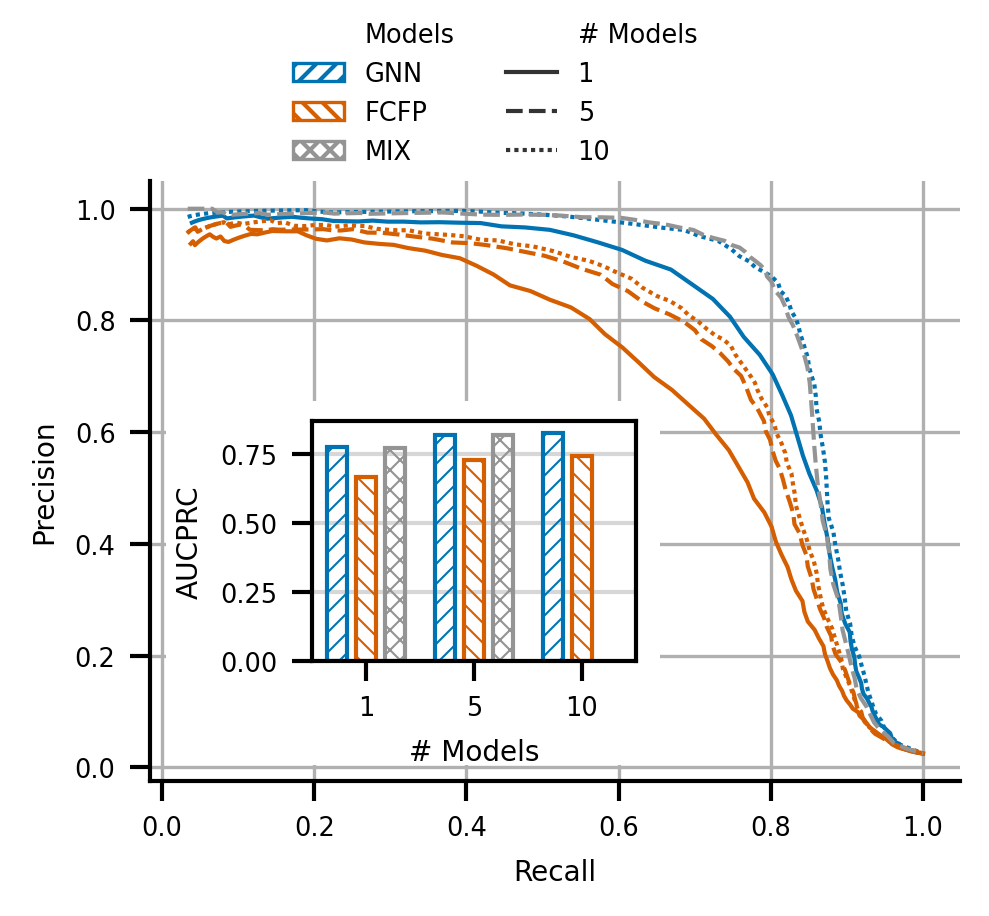

In [21]:
fg = sns.relplot(
    plot_data[
        ((plot_data["Models"] == "MIX") & (plot_data["# Models"] == 5))
        | (np.isin(plot_data["# Models"], [1, 10]) & (plot_data["Models"] == "GNN"))
        | (np.isin(plot_data["# Models"], [1, 5, 10]) & (plot_data["Models"] == "FCFP"))
    ],
    y="Precision",
    x="Recall",
    hue="Models",
    style="# Models",
    kind="line",
    markers=False,
    lw=1,
    height=3,
    aspect=0.7,
    palette="colorblind_reordered",
)
for ax in fg.axes.flatten():
    ax.grid(True)

print(fg.figure.get_size_inches())
fg.figure.set_dpi(300)
fg.figure.set_figwidth(85 / 25.4)
fg.tight_layout(rect=(0, 0, 1, 0.85))

ax = fg.axes[0, 0]
axins = ax.inset_axes(
    (0.2, 0.2, 0.4, 0.4), frameon=True, facecolor="white", alpha=1, zorder=6
)
axins.grid(axis="y", lw=1, alpha=0.5)
axins.set_axisbelow(True)
bp = sns.barplot(
    data=aucs_plot,
    x="# Models",
    y="AUCPRC",
    hue="Models",
    palette="colorblind_reordered",
    ax=axins,
    legend=False,
    fill=False,
    dodge=True,
    gap=0.3,
    linewidth=1,
)

for patch in axins.patches:
    patch.set_hatch(HATCH_DICT[patch.get_edgecolor()[:-1]])
    patch.set_hatch_linewidth(0.5)


ax.add_patch(
    Rectangle(
        (0.005, 0.005), 0.65, 0.65, facecolor="white", edgecolor=None, zorder=5
    )
)
handles, labels = fg.axes[0, 0].get_legend_handles_labels()
print(list(zip(handles, labels)))
patches = [
    (
        Patch(
            facecolor="white",
            edgecolor=h.get_color(),
            label=l,
            hatch=HATCH_DICT.get(h.get_color(), "****"),
            hatch_linewidth=0.5,
        )
        if str(l).isupper()
        else h
    )
    for (h, l) in zip(handles, labels)
]
fg.legend.remove()
fg.add_legend(handles=patches)
sns.move_legend(fg, "upper center", ncols=2)
fg.savefig(BASE_DIR / "reports/figures/Figure_3.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_3.eps")
np.array(fg.figure.get_size_inches())

[3.058 3.   ]
[(<matplotlib.lines.Line2D object at 0x00000236D1F7B560>, 'Модели'), (<matplotlib.lines.Line2D object at 0x00000236D1FCED20>, 'GNN'), (<matplotlib.lines.Line2D object at 0x00000236CBA94200>, 'FCFP'), (<matplotlib.lines.Line2D object at 0x00000236C86977D0>, 'MIX'), (<matplotlib.lines.Line2D object at 0x00000236C8696360>, '# Моделей'), (<matplotlib.lines.Line2D object at 0x00000236C8694590>, '1'), (<matplotlib.lines.Line2D object at 0x00000236C8694EF0>, '5'), (<matplotlib.lines.Line2D object at 0x00000236C86A4050>, '10')]


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


array([3.86475, 3.     ])

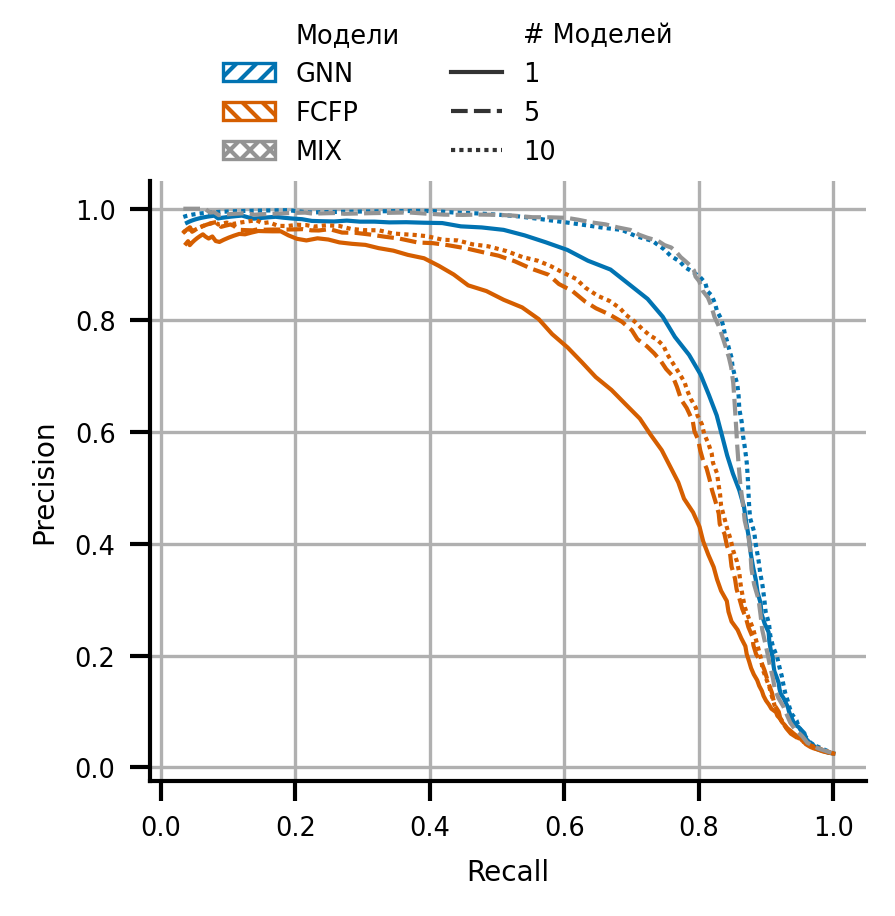

In [41]:
plot_data_ru = plot_data.copy()
plot_data_ru = plot_data_ru.rename(columns={"# Models": "# Моделей", "Models":"Модели"})
fg = sns.relplot(
    plot_data_ru[
        ((plot_data_ru["Модели"] == "MIX") & (plot_data_ru["# Моделей"] == 5))
        | (np.isin(plot_data_ru["# Моделей"], [1, 10]) & (plot_data_ru["Модели"] == "GNN"))
        | (
            np.isin(plot_data_ru["# Моделей"], [1, 5, 10])
            & (plot_data_ru["Модели"] == "FCFP")
        )
    ],
    y="Precision",
    x="Recall",
    hue="Модели",
    style="# Моделей",
    kind="line",
    markers=False,
    lw=1,
    height=3,
    aspect=0.75,
    palette="colorblind_reordered",
)
for ax in fg.axes.flatten():
    ax.grid(True)

print(fg.figure.get_size_inches())
fg.figure.set_dpi(300)
# fg.figure.set_figwidth(85 / 25.4)
fg.tight_layout(rect=(0, 0, 1, 0.85))


handles, labels = fg.axes[0, 0].get_legend_handles_labels()
print(list(zip(handles, labels)))
patches = [
    (
        Patch(
            facecolor="white",
            edgecolor=h.get_color(),
            label=l,
            hatch=HATCH_DICT.get(h.get_color(), "****"),
            hatch_linewidth=0.5,
        )
        if str(l).isupper()
        else h
    )
    for (h, l) in zip(handles, labels)
]
fg.legend.remove()
fg.add_legend(handles=patches)
sns.move_legend(fg, "upper center", ncols=2)
fg.savefig(BASE_DIR / "reports/figures/Figure_3-1-ru.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_3-1-ru.eps")
np.array(fg.figure.get_size_inches())

[(<matplotlib.patches.Rectangle object at 0x00000236C27DBBF0>, 'GNN'), (<matplotlib.patches.Rectangle object at 0x00000236D1BDAD80>, 'FCFP'), (<matplotlib.patches.Rectangle object at 0x00000236C8694140>, 'MIX')]


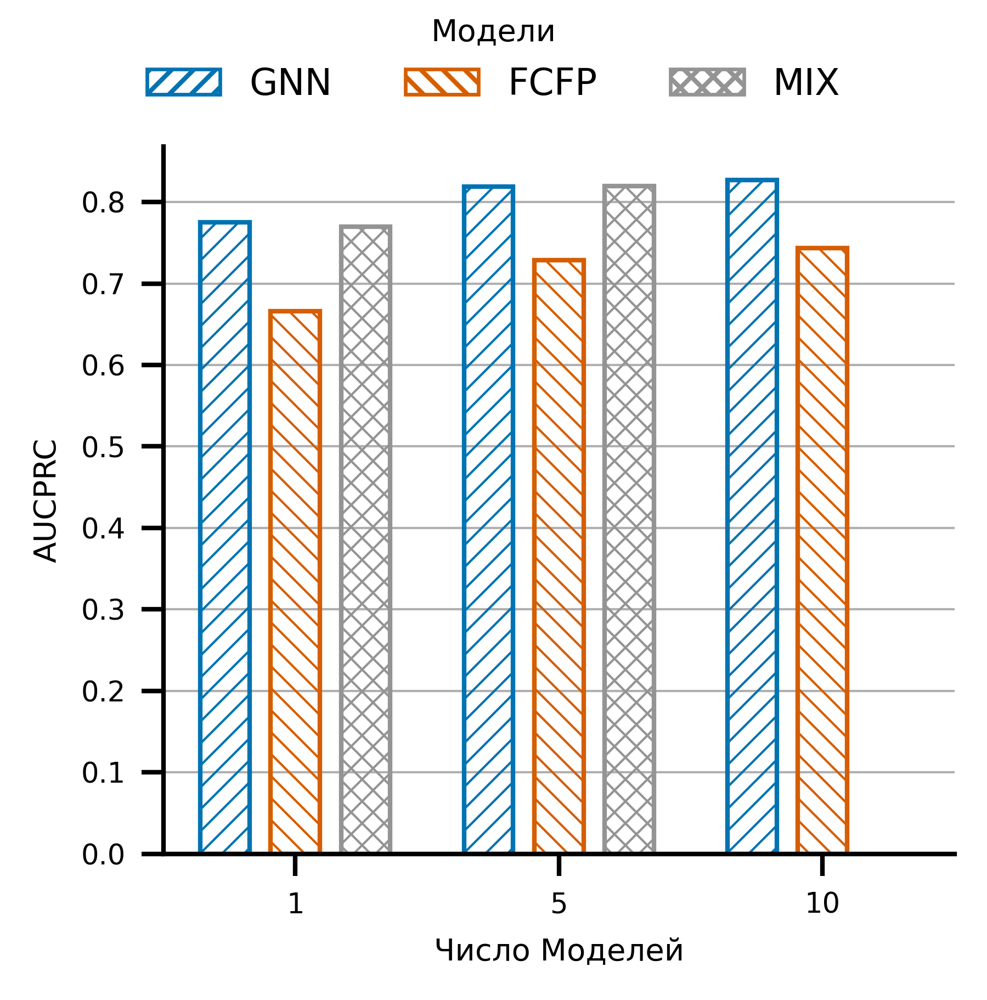

In [74]:
aucs_plot_ru = aucs_plot.copy()
aucs_plot_ru = aucs_plot_ru.rename(
    columns={"# Models": "Число Моделей", "Models": "Модели"}
)
fg = sns.catplot(
    data=aucs_plot_ru,
    x="Число Моделей",
    y="AUCPRC",
    hue="Модели",
    palette="colorblind_reordered",
    fill=False,
    dodge=True,
    gap=0.3,
    linewidth=1,
    kind="bar",
    height=3,
    aspect=0.6,
)

for patch in fg.ax.patches:
    patch.set_hatch(HATCH_DICT[patch.get_edgecolor()[:-1]])
    patch.set_hatch_linewidth(0.5)

for ax in fg.axes.flatten():
    ax.grid(axis="y", lw=0.5)
    ax.set_axisbelow(True)


handles, labels = fg.axes[0, 0].get_legend_handles_labels()
print(list(zip(handles, labels)))
patches = [
    (
        Patch(
            facecolor="white",
            edgecolor=h.get_edgecolor(),
            label=l,
            hatch=HATCH_DICT.get(h.get_edgecolor()[:-1], ".."),
            hatch_linewidth=0.5,
        )
        if str(l).isupper()
        else h
    )
    for (h, l) in zip(handles, labels)
]
fg.legend.remove()
fg.add_legend(
    title="Модели",
    handles=patches,
    loc="upper center",
    ncols=3,
    fontsize=8,
    title_fontsize=10,
    borderpad=0,
)
# sns.move_legend(fg, "upper center", ncols=3)
fg.figure.set_size_inches((3,3))
fg.tight_layout(rect=(0, 0, 1, 0.9))

fg.figure.set_dpi(600)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_3-2-ru.png", dpi=1000)

### Distribution of Entries across Groups


Figure 4


[3.34645669 2.        ]


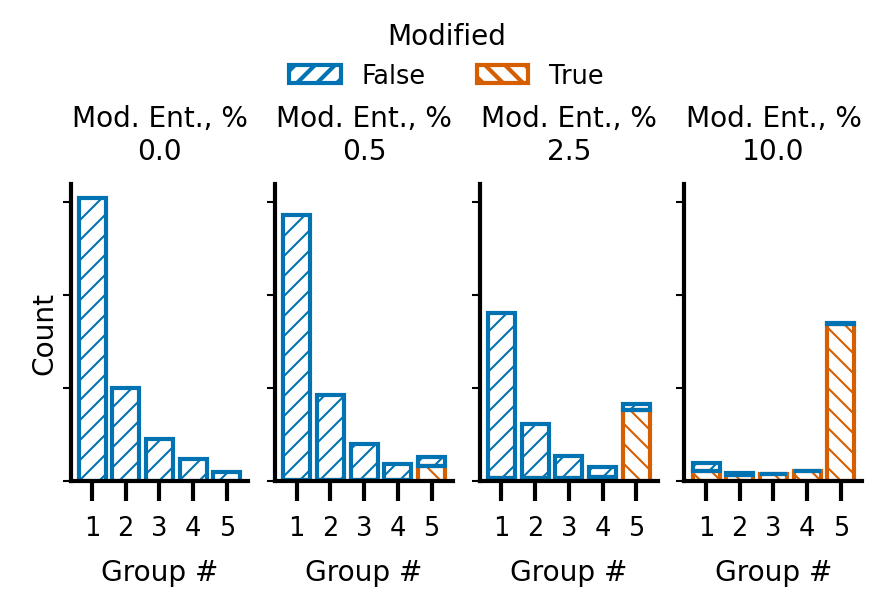

In [ ]:
plot_df = calc_groups(
    dataframe=shuffled_desc_dfs,
    thresholds=DEFAULT_THRESHOLD,
    data_offsets=DEFAULT_DATA_OFFSET,
)
ground_truth = get_modified_entries(
    data=shuffled_desc_dfs, ref_data=noisy_desc_df
).to_frame("modified")
plot_df = plot_df.join(ground_truth)
plot_df = plot_df.set_index("modified", append=True)
plot_df = plot_df.reset_index().drop(
    columns=["threshold_%", "data_offset", "s_5_a", "s_5_r", "s_5_n"]
)
plot_df.columns = ["Mod. Ent., %", "#", "Modified", "Group #"]
plot_df = plot_df.loc[np.isin(plot_df["Group #"], np.arange(1, 6)), :]
plot_df = plot_df.loc[np.isin(plot_df["Mod. Ent., %"], [0, 0.5, 2.5, 10]), :]
fg = sns.displot(
    data=plot_df,
    x="Group #",
    col="Mod. Ent., %",
    hue="Modified",
    kind="hist",
    fill=False,
    shrink=0.8,
    element="bars",
    multiple="stack",
    discrete=True,
    linewidth=1,
    height=2,
    aspect=0.3,
    palette="colorblind_reordered",
)

for ax in fg.axes.flatten():
    for patch in ax.patches:
        patch.set_hatch(HATCH_DICT[patch.get_edgecolor()[:-1]])
        patch.set_hatch_linewidth(0.5)


handles = fg.legend.legend_handles
for handle in handles:
    handle.set_hatch(HATCH_DICT[handle.get_edgecolor()[:-1]])
    handle.set_hatch_linewidth(0.5)


fg.set_titles(
    row_template="{row_var}\n{row_name}", col_template="{col_var}\n{col_name}"
)
sns.move_legend(fg, "upper center", ncols=3)
fg.figure.set_figwidth(85 / 25.4)
fg.tight_layout(rect=(0, 0, 1, 0.9))
fg.figure.set_dpi(300)
fg.set_yticklabels([])
fg.set(xticks=(np.arange(1, 6).astype(int)))
fg.figure.subplots_adjust(wspace=0.15)
fg.set_ylabels(labelpad=0)
fg.tick_params(axis="y", pad=1, width=0.5, length=2)
fg.set(
    ylim=(
        0,
        1.05
        * plot_df.loc[plot_df["Group #"] == 1, :]
        .groupby(["Mod. Ent., %", "Group #"])
        .size()
        .max(),
    )
)
fg.savefig(BASE_DIR / "reports/figures/Figure_4.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_4.eps")
print(fg.figure.get_size_inches())

Figure S20


[7.08661417 8.75      ]


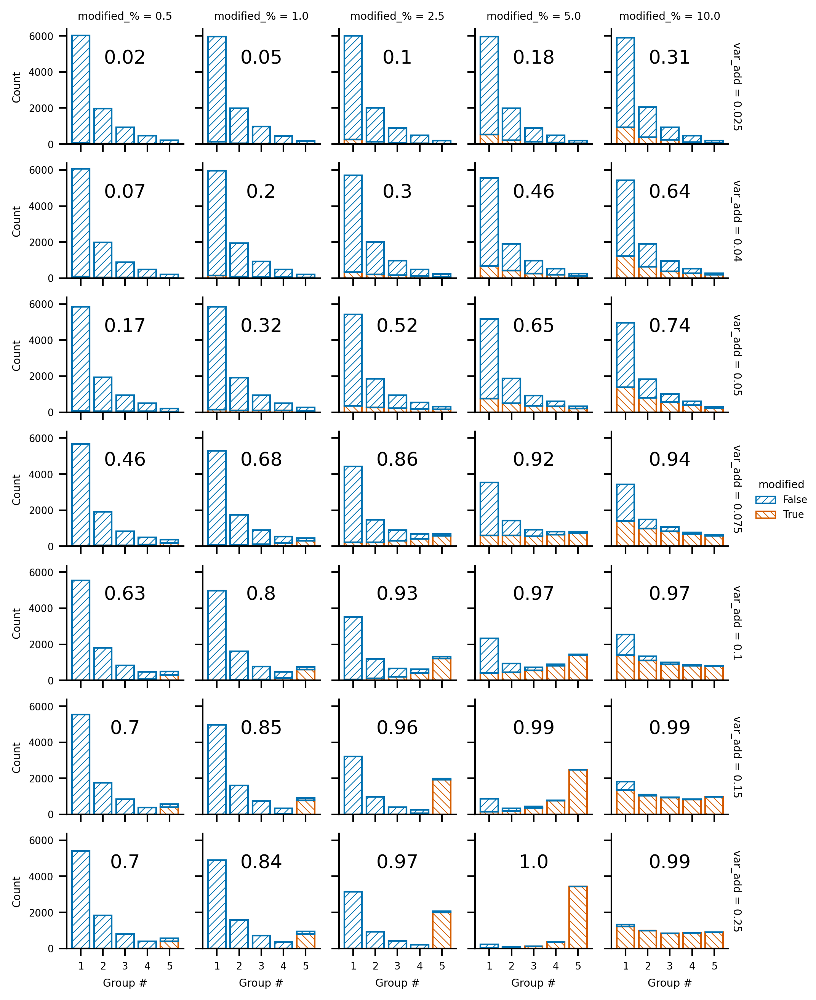

In [20]:
fg = plot_group_sizes(
    dataframe=variable_add_desc_dfs,
    model_names=MODEL_NAMES,
    ref_data=noisy_desc_df,
    groups=np.arange(1, 6),
    group_stat="both",
    hue="modified",
    col="modified_%",
    row="var_add",
    height=1.25,
    aspect=1,
    add_catplot=False,
    plot_type="histplot",
    margin_titles=True,
)
plot_df = calc_classification_metrics(
    dataframe=variable_add_desc_dfs,
    ref_dataframe=noisy_desc_df,
    model_names=MODEL_NAMES,
    thresholds=DEFAULT_THRESHOLD,
    data_offsets=DEFAULT_DATA_OFFSET,
    group_stat="both",
    recursive=False,
)
precisions = (
    plot_df.xs(5, level="group_#")["precision"].unstack(1).sort_index().round(2).T
)
# display(precisions)

for i, row in enumerate(fg.axes):
    for j, ax in enumerate(row):
        # print(axs)
        ax.text(
            s=precisions.to_numpy()[i, j],
            x=0.5,
            y=0.7,
            transform=ax.transAxes,
            fontdict={"fontsize": 12},
            ha="center",
        )
fg.set_xlabels("Group #")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(180 / 25.4)
fg.tight_layout(rect=(0, 0, 0.93, 1))
fg.savefig(BASE_DIR / "reports/figures/Figure_S20.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S20.eps")
print(fg.figure.get_size_inches())

Figure S21


[7.08661417 2.        ]


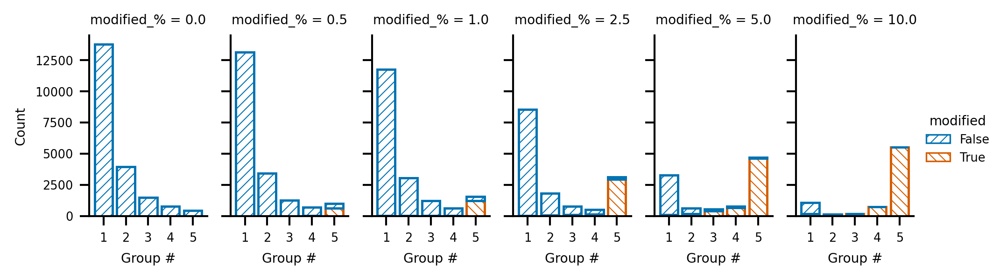

In [70]:
fg = plot_group_sizes(
    dataframe=shuffled_qm9_dfs,
    model_names=MODEL_NAMES,
    ref_data=base_qm9_df,
    groups=np.arange(1, 6),
    group_stat="both",
    hue="modified",
    col="modified_%",
    row=None,
    height=2,
    aspect=0.75,
    add_catplot=False,
    plot_type="histplot",
)

fg.set_xlabels("Group #")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(180 / 25.4)
fg.tight_layout()
fg.savefig(BASE_DIR / "reports/figures/Figure_S21.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S21.eps")
print(fg.figure.get_size_inches())

Figure S22


[ 7. 10.]


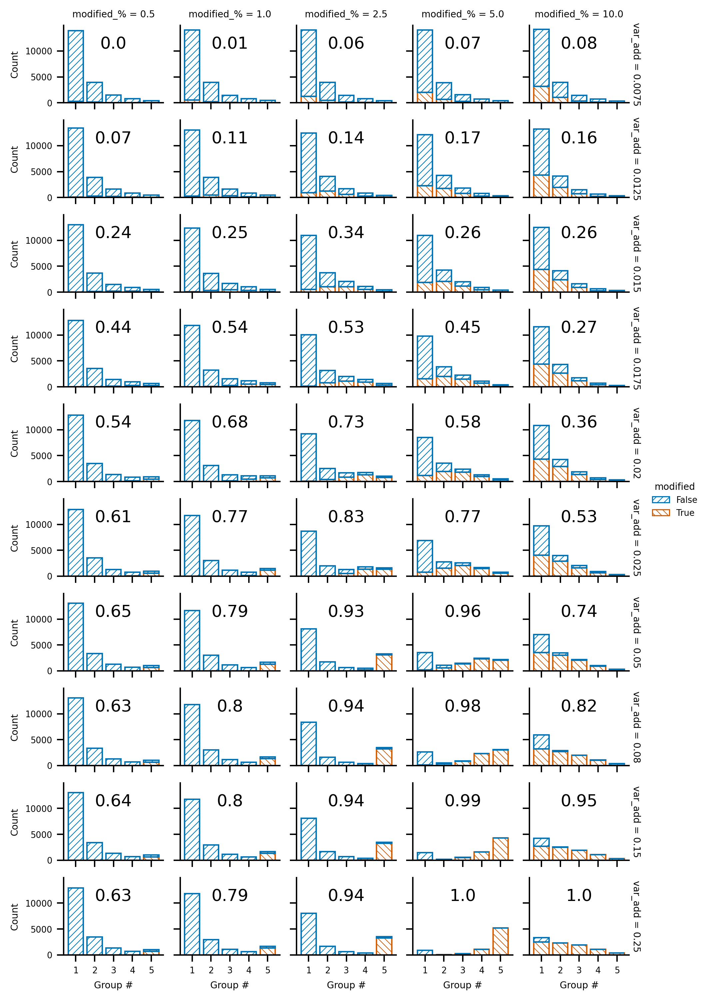

In [ ]:
fg = plot_group_sizes(
    dataframe=variable_add_qm9_dfs,
    model_names=MODEL_NAMES,
    ref_data=base_qm9_df,
    groups=np.arange(1, 6),
    group_stat="both",
    hue="modified",
    col="modified_%",
    row="var_add",
    height=1.25,
    aspect=1,
    add_catplot=False,
    plot_type="histplot",
    margin_titles=True,
)

plot_df = calc_classification_metrics(
    dataframe=variable_add_qm9_dfs,
    ref_dataframe=base_qm9_df,
    model_names=MODEL_NAMES,
    thresholds=DEFAULT_THRESHOLD,
    data_offsets=DEFAULT_DATA_OFFSET,
    group_stat="both",
    recursive=False,
)
precisions = (
    plot_df.xs(5, level="group_#")["precision"].unstack(1).sort_index().round(2).T
)
# display(precisions)

for i, row in enumerate(fg.axes):
    for j, ax in enumerate(row):
        # print(axs)
        ax.text(
            s=precisions.to_numpy()[i, j],
            x=0.5,
            y=0.7,
            transform=ax.transAxes,
            fontdict={"fontsize": 12},
            ha="center",
        )

fg.set_xlabels("Group #")
fg.figure.set_dpi(300)
fg.figure.set_size_inches(7, 10)
fg.tight_layout(rect=(0, 0, 0.93, 1))
fg.savefig(BASE_DIR / "reports/figures/Figure_S22.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S22.eps")
print(fg.figure.get_size_inches())

Figure S23a


[3. 3.]


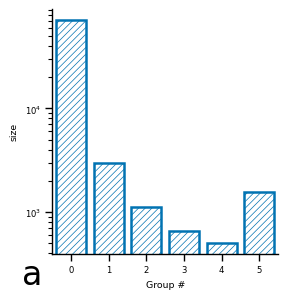

In [72]:
fg = plot_group_sizes(
    dataframe=metlin_df,
    model_names=metlin_models,
    value_name="EXP",
    thresholds=DEFAULT_THRESHOLD,
    add_catplot=False,
    group_stat="both",
    plot_type="barplot",
    col=None,
    row=None,
    hue=None,
    height=3,
    aspect=0.75,
)

for ax in fg.axes.flatten():
    for patch in ax.patches:
        patch.set_hatch(HATCH_DICT[patch.get_edgecolor()[:-1]])
        patch.set_hatch_linewidth(0.5)


handles = fg.legend.legend_handles
for handle in handles:
    handle.set_hatch(HATCH_DICT[handle.get_edgecolor()[:-1]])
    handle.set_hatch_linewidth(0.5)

fg.set(yscale="log")
fg.set_xlabels("Group #")
fg.figure.text(x=0.075, y=0.05, s="a", fontsize=24)
fg.figure.set_size_inches(3,3)
fg.tight_layout()
fg.savefig(BASE_DIR / "reports/figures/Figure_S23a.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S23a.eps")
print(fg.figure.get_size_inches())

Figure S23b


[3. 3.]


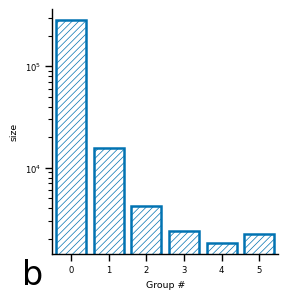

In [73]:
fg = plot_group_sizes(
    dataframe=nist_df,
    model_names=nist_models,
    value_name="RI_X",
    thresholds=DEFAULT_THRESHOLD,
    add_catplot=False,
    group_stat="both",
    plot_type="barplot",
    col=None,
    row=None,
    hue=None,
    aspect=0.75,
    height=3,
)
for ax in fg.axes.flatten():
    for patch in ax.patches:
        patch.set_hatch(HATCH_DICT[patch.get_edgecolor()[:-1]])
        patch.set_hatch_linewidth(0.5)


handles = fg.legend.legend_handles
for handle in handles:
    handle.set_hatch(HATCH_DICT[handle.get_edgecolor()[:-1]])
    handle.set_hatch_linewidth(0.5)

fg.set(yscale="log")
fg.set_xlabels("Group #")
fg.figure.text(x=0.075, y=0.05, s="b", fontsize=24)
fg.figure.set_size_inches(3,3)
fg.tight_layout()
fg.savefig(BASE_DIR / "reports/figures/Figure_S23b.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S23b.eps")
print(fg.figure.get_size_inches())

### Standard Deviation of Predictions as a Function of Group Number

Figure 5


[3.34645669 3.75      ]


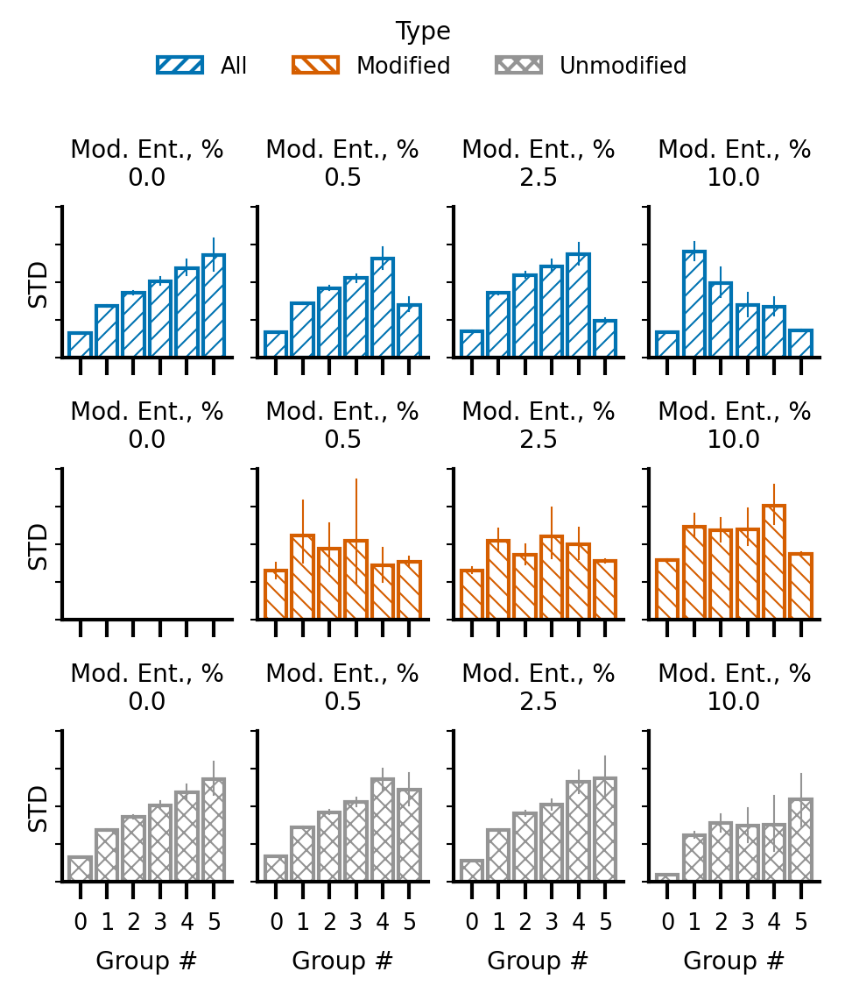

In [ ]:
group_df = calc_groups(
    dataframe=shuffled_desc_dfs,
    thresholds=DEFAULT_THRESHOLD,
    data_offsets=DEFAULT_DATA_OFFSET,
)
basic_df = calc_basic_stats(
    dataframe=shuffled_desc_dfs,
)
ground_truth = get_modified_entries(data=shuffled_desc_dfs, ref_data=noisy_desc_df)
plot_df = group_df.join(basic_df).join(ground_truth)
plot_df = plot_df.set_index("modified", append=True)
plot_df = plot_df[["s_5_b","p_std"]]
all_df = plot_df.copy()
mod_df = plot_df.xs(True, level="modified", drop_level=False)
unmod_df = plot_df.xs(False, level="modified", drop_level=False)
# plot_df = plot_df.droplevel(level=["modified", "threshold_%","data_offset"])
plot_df = pd.concat(
    {
        "All": all_df,
        "Modified": mod_df,
        "Unmodified": unmod_df,
        #  "Unmodified": unmod_df
    },
    names=["Type"],
).reset_index()
plot_df = plot_df[["Type","modified_%","s_5_b","p_std"]]
plot_df = plot_df.iloc[np.isin(plot_df["modified_%"], [0, 0.5, 2.5, 10])]
plot_df.columns = ["Type", "Mod. Ent., %", "Group #", "STD"]
fg = sns.catplot(
    data=plot_df,
    x="Group #",
    y="STD",
    hue="Type",
    row="Type",
    kind="bar",
    col="Mod. Ent., %",
    fill=False,
    native_scale=True,
    dodge=False,
    # gap=0.4,
    palette="colorblind_reordered",
    linewidth=1,
    err_kws={"lw": 0.5},
    height=1.25,
    aspect=1,
    sharey=False,
)

for ax in fg.axes.flatten():
    for patch in ax.patches:
        patch.set_hatch(HATCH_DICT[patch.get_edgecolor()[:-1]])
        patch.set_hatch_linewidth(0.5)

handles = fg.legend.legend_handles
for handle in handles:
    handle.set_hatch(HATCH_DICT[handle.get_edgecolor()[:-1]])
    handle.set_hatch_linewidth(0.5)


sns.move_legend(fg, "upper center", ncols=3)
fg.set_yticklabels(())
fg.set(xticks=np.arange(0, 6).astype(int))
fg.set_titles(template="{col_var}\n{col_name}")
fg.figure.set_figwidth(85 / 25.4)
fg.tight_layout(rect=(0, 0, 1, 0.9))
fg.figure.set_dpi(300)
fg.figure.subplots_adjust(wspace=0.15)
fg.set_ylabels(labelpad=0)
fg.tick_params(axis="y", pad=1, width=0.5, length=2)

fg.savefig(BASE_DIR / "reports/figures/Figure_5.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_5.eps")

print(fg.figure.get_size_inches())

Figure 6


[3.34645669 4.        ]


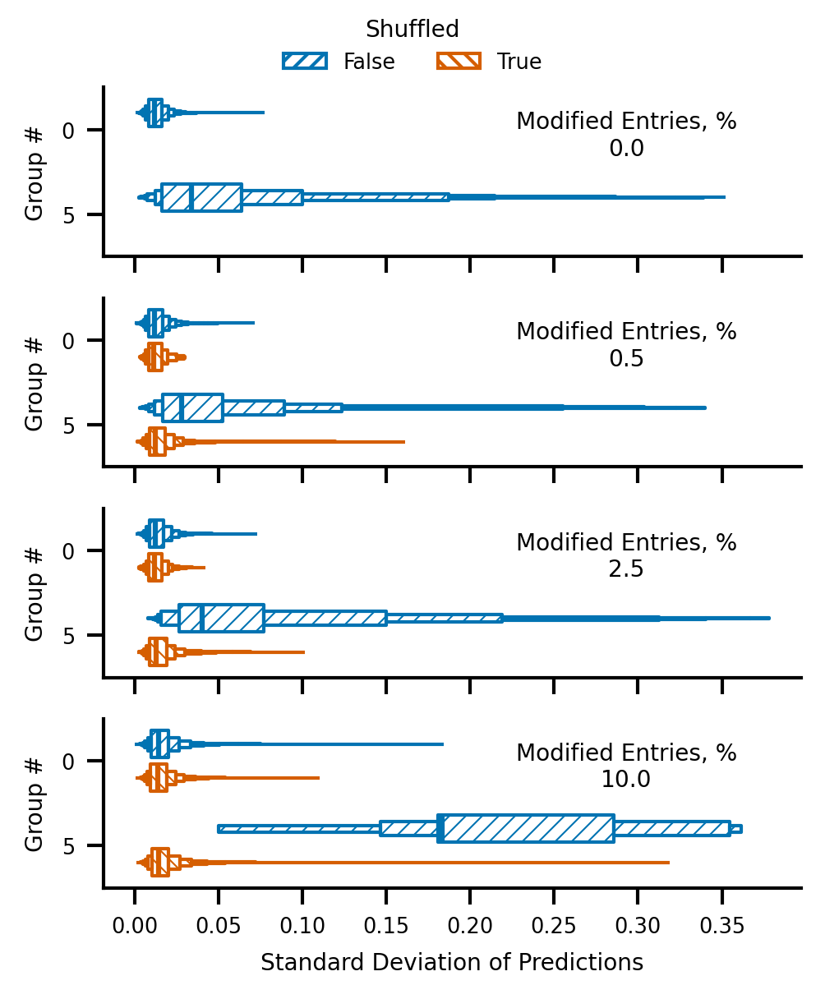

In [ ]:
group_df = calc_groups(
    dataframe=shuffled_desc_dfs,
    thresholds=DEFAULT_THRESHOLD,
    data_offsets=DEFAULT_DATA_OFFSET,
)
basic_df = calc_basic_stats(
    dataframe=shuffled_desc_dfs,
)
ground_truth = get_modified_entries(data=shuffled_desc_dfs, ref_data=noisy_desc_df)
plot_df = group_df.join(basic_df).join(ground_truth)
plot_df = plot_df.set_index("modified", append=True)
plot_df = plot_df[["s_5_b","p_std"]]
plot_df = plot_df.reset_index()
plot_df = plot_df[["modified_%","#","modified","s_5_b","p_std"]]
plot_df = plot_df.loc[
    (np.isin(plot_df["s_5_b"], [0, 5]))
    & (np.isin(plot_df["modified_%"], [0, 0.5, 2.5, 10])),
    :,
]
plot_df.columns = [
    "Modified Entries, %",
    "#",
    "Shuffled",
    "Group #",
    "Standard Deviation of Predictions",
]
fg = sns.catplot(
    data=plot_df,
    y="Group #",
    x="Standard Deviation of Predictions",
    row="Modified Entries, %",
    hue="Shuffled",
    kind="boxen",
    orient="h",
    palette="colorblind_reordered",
    showfliers=False,
    k_depth="full",
    dodge=True,
    gap=0.2,
    # k_depth=5,
    fill=False,
    height=1,
    aspect=3,
    lw=1,
)

fg.set_titles(row_template="{row_var}\n{row_name}")
for ax in fg.axes.flatten():
    # print("Ax: ", ax)
    ax.text(
        s=ax.get_title(),
        x=0.75,
        y=0.6,
        transform=ax.transAxes,
        ha="center",
        fontdict={"fontsize": ax.title.get_fontsize()},
    )
    # ax.title.set_position((1.05, 0))
    for collection in ax.collections:
        # print("\tCollection: ", collection, collection.get_edgecolor().flatten())
        for path in collection.get_paths():
            patch = PathPatch(
                path,
                facecolor=None,
                edgecolor=collection.get_edgecolor(),
                fill=False,
                hatch=HATCH_DICT[tuple(collection.get_edgecolor().flatten()[:-1])],
                hatch_linewidth=0.5,
                lw=0.5,
            )
            ax.add_patch(patch)
fg.set_titles(template="")
handles = fg.legend.legend_handles
for handle in handles:
    handle.set_hatch(HATCH_DICT[handle.get_edgecolor()[:-1]])


sns.move_legend(fg, "upper center", ncols=2)
fg.figure.set_figwidth(85 / 25.4)
# plt.subplots_adjust(right=0.9)
fg.tight_layout(rect=(0, 0, 1.0, 0.95))
fg.figure.set_dpi(300)
fg.savefig(BASE_DIR / "reports/figures/Figure_6.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_6.eps")
print(fg.figure.get_size_inches())

Figure 6 RU

[3.34645669 4.        ]


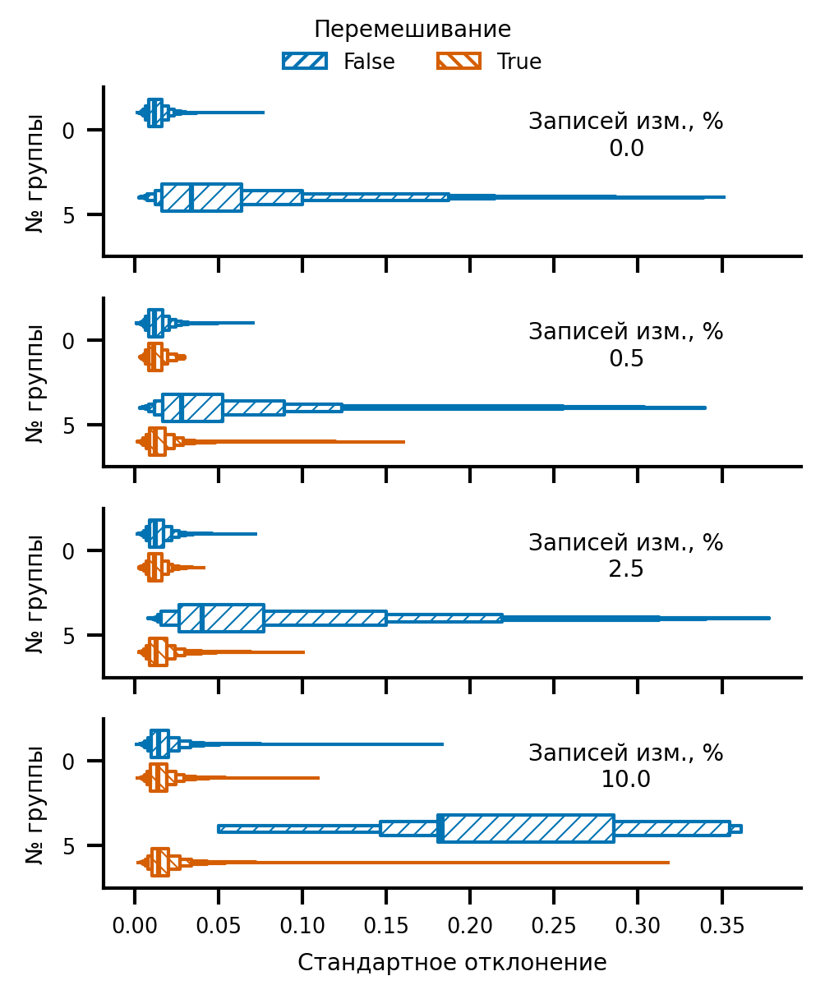

In [ ]:
group_df = calc_groups(
    dataframe=shuffled_desc_dfs,
    thresholds=DEFAULT_THRESHOLD,
    data_offsets=DEFAULT_DATA_OFFSET,
)
basic_df = calc_basic_stats(
    dataframe=shuffled_desc_dfs,
)
ground_truth = get_modified_entries(data=shuffled_desc_dfs, ref_data=noisy_desc_df)
plot_df = group_df.join(basic_df).join(ground_truth)
plot_df = plot_df.set_index("modified", append=True)
plot_df = plot_df[["s_5_b","p_std"]]
plot_df = plot_df.reset_index()
plot_df = plot_df[["modified_%","#","modified","s_5_b","p_std"]]
plot_df = plot_df.loc[
    (np.isin(plot_df["s_5_b"], [0, 5]))
    & (np.isin(plot_df["modified_%"], [0, 0.5, 2.5, 10])),
    :,
]
plot_df.columns = [
    "Записей изм., %",
    "#",
    "Перемешивание",
    "Group #",
    "Standard Deviation of Predictions",
]
fg = sns.catplot(
    data=plot_df,
    y="Group #",
    x="Standard Deviation of Predictions",
    row="Записей изм., %",
    hue="Перемешивание",
    kind="boxen",
    orient="h",
    palette="colorblind_reordered",
    showfliers=False,
    k_depth="full",
    dodge=True,
    gap=0.2,
    # k_depth=5,
    fill=False,
    height=1,
    aspect=3,
    lw=1,
)

fg.set_titles(row_template="{row_var}\n{row_name}")
for ax in fg.axes.flatten():
    # print("Ax: ", ax)
    ax.text(
        s=ax.get_title(),
        x=0.75,
        y=0.6,
        transform=ax.transAxes,
        ha="center",
        fontdict={"fontsize": ax.title.get_fontsize()},
    )
    # ax.title.set_position((1.05, 0))
    for collection in ax.collections:
        # print("\tCollection: ", collection, collection.get_edgecolor().flatten())
        for path in collection.get_paths():
            patch = PathPatch(
                path,
                facecolor=None,
                edgecolor=collection.get_edgecolor(),
                fill=False,
                hatch=HATCH_DICT[tuple(collection.get_edgecolor().flatten()[:-1])],
                hatch_linewidth=0.5,
                lw=0.5,
            )
            ax.add_patch(patch)
fg.set_titles(template="")
handles = fg.legend.legend_handles
for handle in handles:
    handle.set_hatch(HATCH_DICT[handle.get_edgecolor()[:-1]])


sns.move_legend(fg, "upper center", ncols=2)
fg.figure.set_figwidth(85 / 25.4)
# plt.subplots_adjust(right=0.9)
fg.tight_layout(rect=(0, 0, 1.0, 0.95))
fg.set_ylabels("№ группы")
fg.set_xlabels("Стандартное отклонение")
fg.figure.set_dpi(300)
fg.savefig(BASE_DIR / "reports/figures/Figure_6_ru.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_6_ru.eps")
print(fg.figure.get_size_inches())

Figure S24


[7. 9.]


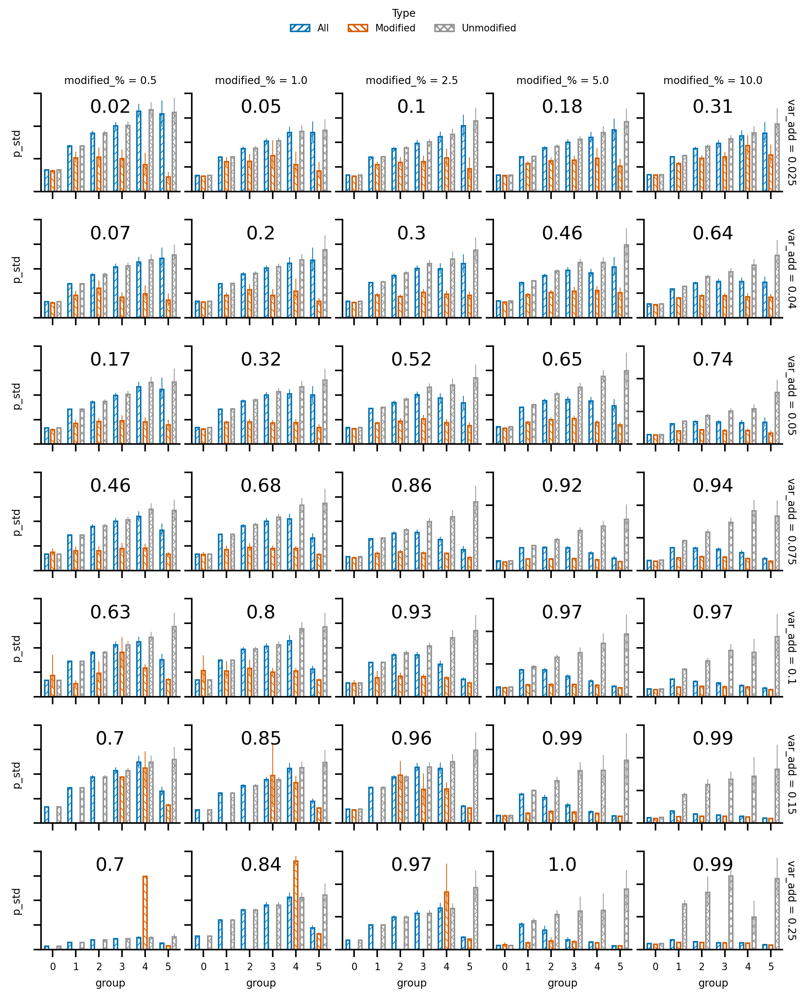

In [ ]:
fg = plot_stats_group(
    dataframe=variable_add_desc_dfs,
    model_names=MODEL_NAMES,
    ref_data=noisy_desc_df,
    mod_df_reference=True,
    split_modified=True,
    groups=np.arange(0, 6),
    group_stat="both",
    stats="p_std",
    kind="barplot",
    x_var="group",
    y_var="p_std",
    row="var_add",
    col="modified_%",
    hue="Type",
    annot_sizes=False,
    height=1,
    aspect=2,
    margin_titles=True,
)
plot_df = calc_classification_metrics(
    dataframe=variable_add_desc_dfs,
    ref_dataframe=noisy_desc_df,
    model_names=MODEL_NAMES,
    thresholds=DEFAULT_THRESHOLD,
    data_offsets=DEFAULT_DATA_OFFSET,
    group_stat="both",
    recursive=False,
)
precisions = (
    plot_df.xs(5, level="group_#")["precision"].unstack(1).sort_index().round(2).T
)
# display(precisions)

for i, row in enumerate(fg.axes):
    for j, ax in enumerate(row):
        # print(axs)
        ax.text(
            s=precisions.to_numpy()[i, j],
            x=0.5,
            y=0.8,
            transform=ax.transAxes,
            ha="center",
            fontsize=12,
        )


sns.move_legend(fg, "upper center", ncols=3)
fg.set_yticklabels(())
fg.set(xticks=np.arange(0, 6).astype(int))
fg.set_titles(template="{col_var} = {col_name}\n{row_var} = {row_name}")
fg.tight_layout(rect=(0, 0, 1.0, 0.95))
fg.figure.set_dpi(300)
fg.figure.set_size_inches(7, 9)
fg.savefig(BASE_DIR / "reports/figures/Figure_S24.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S24.eps")
print(fg.figure.get_size_inches())

[7. 9.]


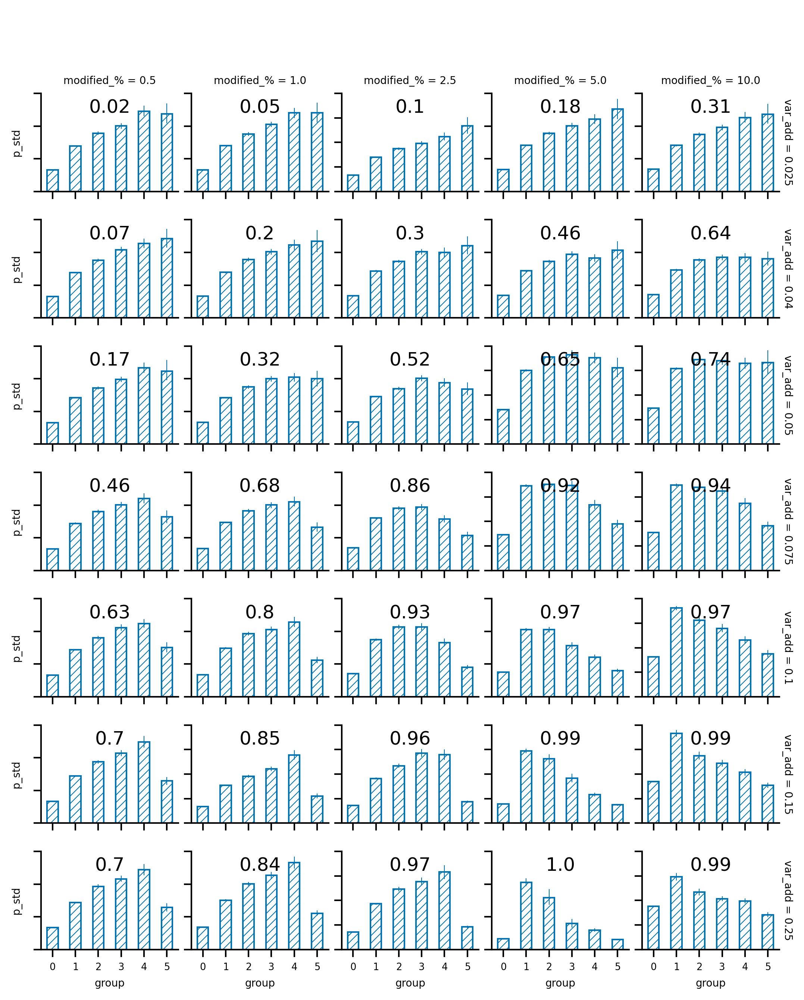

In [ ]:
fg = plot_stats_group(
    dataframe=variable_add_desc_dfs,
    model_names=MODEL_NAMES,
    ref_data=noisy_desc_df,
    mod_df_reference=True,
    split_modified=False,
    groups=np.arange(0, 6),
    group_stat="both",
    stats="p_std",
    kind="barplot",
    x_var="group",
    y_var="p_std",
    row="var_add",
    col="modified_%",
    hue=None,
    annot_sizes=False,
    height=1,
    aspect=2,
    margin_titles=True,
)
plot_df = calc_classification_metrics(
    dataframe=variable_add_desc_dfs,
    ref_dataframe=noisy_desc_df,
    model_names=MODEL_NAMES,
    thresholds=DEFAULT_THRESHOLD,
    data_offsets=DEFAULT_DATA_OFFSET,
    group_stat="both",
    recursive=False,
)
precisions = (
    plot_df.xs(5, level="group_#")["precision"].unstack(1).sort_index().round(2).T
)
# display(precisions)

for i, row in enumerate(fg.axes):
    for j, ax in enumerate(row):
        # print(axs)
        ax.text(
            s=precisions.to_numpy()[i, j],
            x=0.5,
            y=0.8,
            transform=ax.transAxes,
            ha="center",
            fontsize=12,
        )


sns.move_legend(fg, "upper center", ncols=3)
fg.set_yticklabels(())
fg.set(xticks=np.arange(0, 6).astype(int))
fg.set_titles(template="{col_var} = {col_name}\n{row_var} = {row_name}")
fg.tight_layout(rect=(0, 0, 1.0, 0.95))
fg.figure.set_dpi(300)
fg.figure.set_size_inches(7, 9)
fg.savefig(BASE_DIR / "reports/figures/Figure_S24-s.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S24-s.eps")
print(fg.figure.get_size_inches())

Figure S25


[7. 5.]


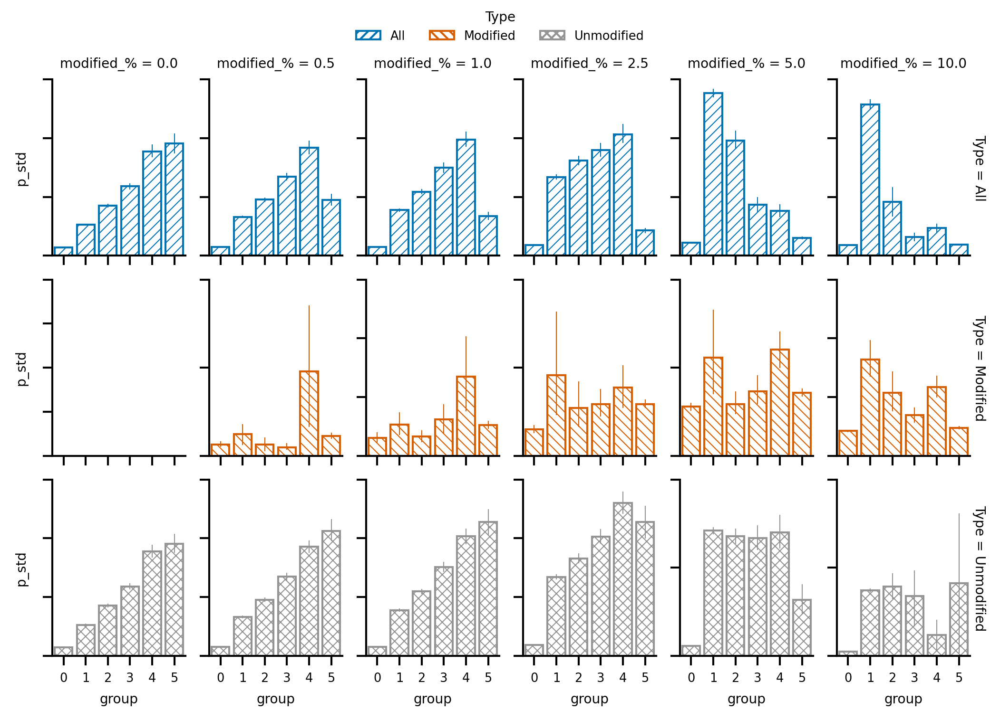

In [79]:
fg = plot_stats_group(
    dataframe=shuffled_qm9_dfs,
    model_names=MODEL_NAMES,
    ref_data=base_qm9_df,
    mod_df_reference=True,
    split_modified=True,
    groups=np.arange(0, 6),
    group_stat="both",
    stats="p_std",
    kind="barplot",
    x_var="group",
    y_var="p_std",
    row="Type",
    col="modified_%",
    hue="Type",
    annot_sizes=False,
    height=1,
    aspect=2,
    margin_titles=True,
    dodge=False,
)
sns.move_legend(fg, "upper center", ncols=3)
fg.set_yticklabels(())
fg.set(xticks=np.arange(0, 6).astype(int))
fg.set_titles(template="{col_var} = {col_name}\n{row_var} = {row_name}")
fg.figure.set_size_inches(7, 5)
fg.tight_layout(rect=(0, 0, 1.0, 0.95))
fg.figure.set_dpi(300)
fg.savefig(BASE_DIR / "reports/figures/Figure_S25.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S25.eps")
print(fg.figure.get_size_inches())

Figure S26


[7. 9.]


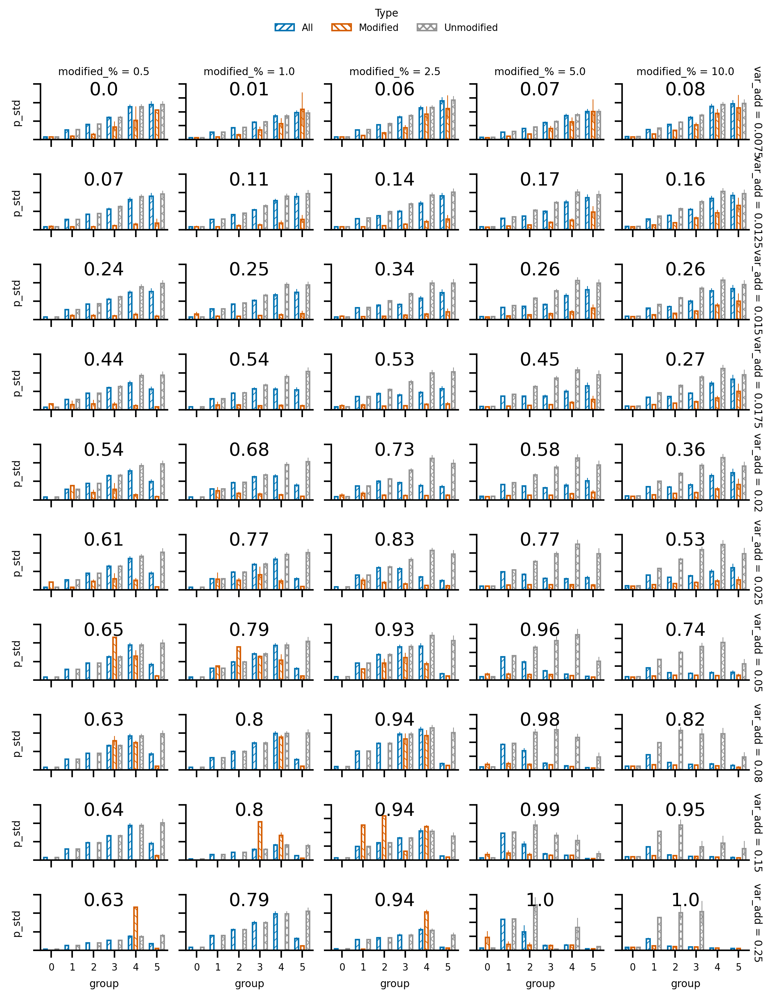

In [ ]:
fg = plot_stats_group(
    dataframe=variable_add_qm9_dfs,
    model_names=MODEL_NAMES,
    ref_data=base_qm9_df,
    mod_df_reference=True,
    split_modified=True,
    groups=np.arange(0, 6),
    group_stat="both",
    stats="p_std",
    kind="barplot",
    x_var="group",
    y_var="p_std",
    row="var_add",
    col="modified_%",
    hue="Type",
    annot_sizes=False,
    height=1,
    aspect=2,
    margin_titles=True,
    dodge=True,
)
plot_df = calc_classification_metrics(
    dataframe=variable_add_qm9_dfs,
    ref_dataframe=base_qm9_df,
    model_names=MODEL_NAMES,
    thresholds=DEFAULT_THRESHOLD,
    data_offsets=DEFAULT_DATA_OFFSET,
    group_stat="both",
    recursive=False,
)
precisions = (
    plot_df.xs(5, level="group_#")["precision"].unstack(1).sort_index().round(2).T
)

for i, row in enumerate(fg.axes):
    for j, ax in enumerate(row):
        # print(axs)
        ax.text(
            s=precisions.to_numpy()[i, j],
            x=0.5,
            y=0.8,
            transform=ax.transAxes,
            ha="center",
            fontsize=12,
        )

sns.move_legend(fg, "upper center", ncols=3)
fg.set_yticklabels(())
fg.set(xticks=np.arange(0, 6).astype(int))
fg.set_titles(template="{col_var} = {col_name}\n{row_var} = {row_name}")
fg.figure.set_dpi(300)
fg.figure.set_size_inches(7, 9)
fg.tight_layout(rect=(0, 0, 1.0, 0.95))
fg.savefig(BASE_DIR / "reports/figures/Figure_S26.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S26.eps")
print(fg.figure.get_size_inches())

[7. 9.]


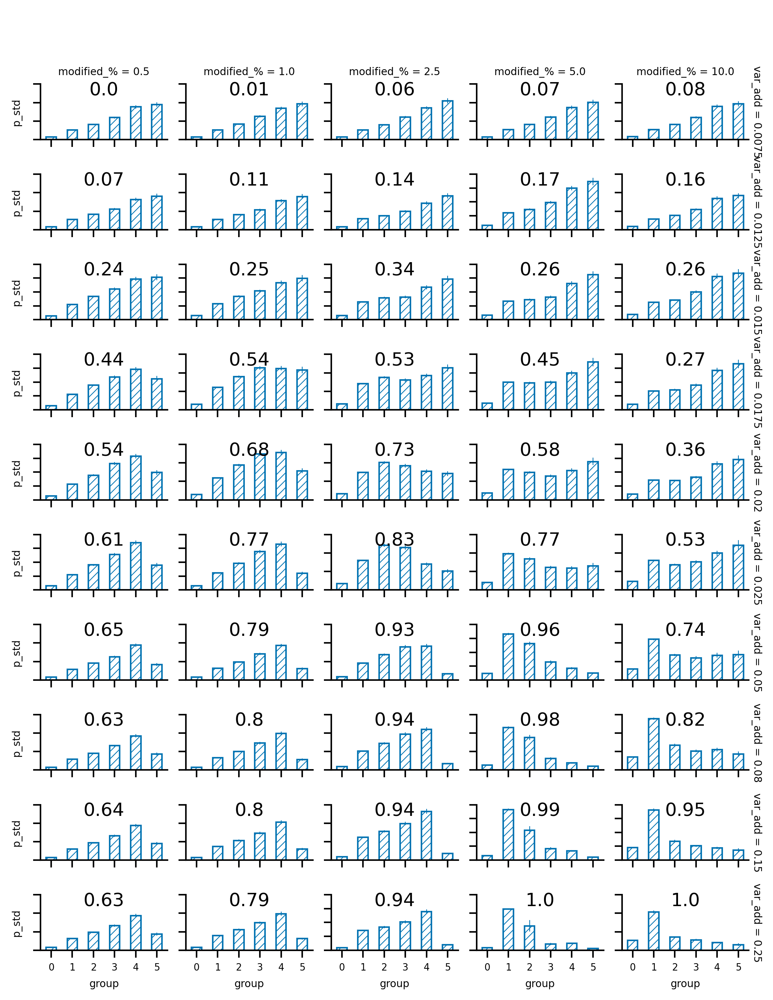

In [ ]:
fg = plot_stats_group(
    dataframe=variable_add_qm9_dfs,
    model_names=MODEL_NAMES,
    ref_data=base_qm9_df,
    mod_df_reference=True,
    split_modified=False,
    groups=np.arange(0, 6),
    group_stat="both",
    stats="p_std",
    kind="barplot",
    x_var="group",
    y_var="p_std",
    row="var_add",
    col="modified_%",
    hue=None,
    annot_sizes=False,
    height=1,
    aspect=2,
    margin_titles=True,
    dodge=True,
)
plot_df = calc_classification_metrics(
    dataframe=variable_add_qm9_dfs,
    ref_dataframe=base_qm9_df,
    model_names=MODEL_NAMES,
    thresholds=DEFAULT_THRESHOLD,
    data_offsets=DEFAULT_DATA_OFFSET,
    group_stat="both",
    recursive=False,
)
precisions = (
    plot_df.xs(5, level="group_#")["precision"].unstack(1).sort_index().round(2).T
)

for i, row in enumerate(fg.axes):
    for j, ax in enumerate(row):
        # print(axs)
        ax.text(
            s=precisions.to_numpy()[i, j],
            x=0.5,
            y=0.8,
            transform=ax.transAxes,
            ha="center",
            fontsize=12,
        )

sns.move_legend(fg, "upper center", ncols=3)
fg.set_yticklabels(())
fg.set(xticks=np.arange(0, 6).astype(int))
fg.set_titles(template="{col_var} = {col_name}\n{row_var} = {row_name}")
fg.figure.set_dpi(300)
fg.figure.set_size_inches(7, 9)
fg.tight_layout(rect=(0, 0, 1.0, 0.95))
fg.savefig(BASE_DIR / "reports/figures/Figure_S26-s.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S26-s.eps")
print(fg.figure.get_size_inches())

Figure S27

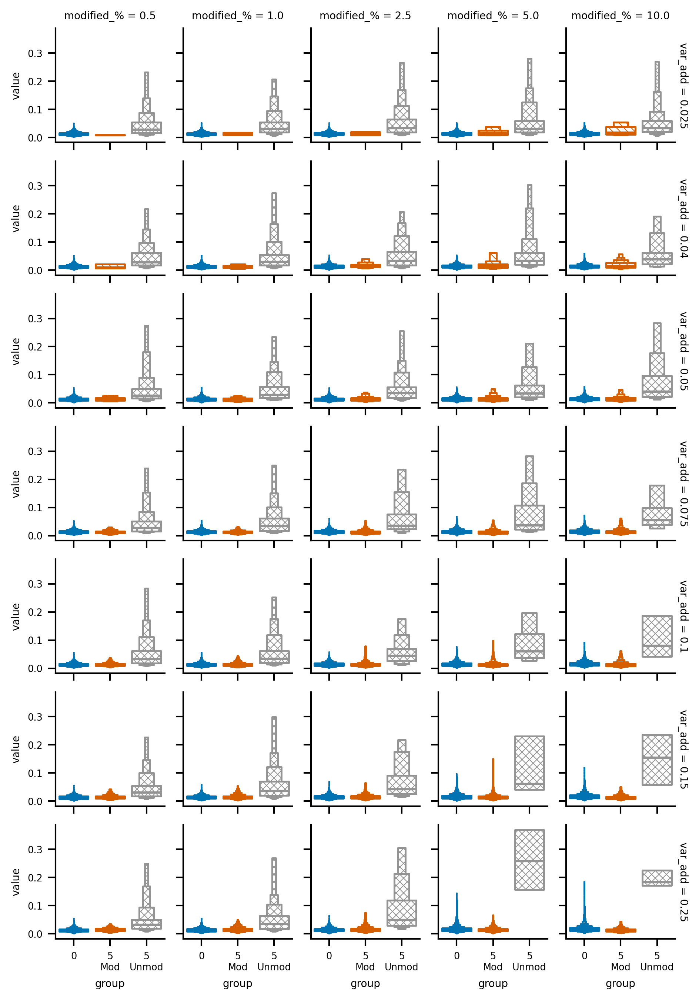

In [81]:
fg = plot_stats_group(
    dataframe=variable_add_desc_dfs,
    model_names=MODEL_NAMES,
    ref_data=noisy_desc_df,
    stats="p_std",
    row="var_add",
    mod_df_reference=True,
    split_modified="last",
    group_stat="both",
    data_offset=DEFAULT_DATA_OFFSET,
    thresholds=DEFAULT_THRESHOLD,
    kind="catplot",
    hue="group",
    height=1.5,
    aspect=1,
    annot_sizes=False,
    margin_titles=True,
)

for ax in fg.axes.flatten():
    # ax.title.set_position((1.05, 0))
    for collection in ax.collections:
        # print("\tCollection: ", collection, collection.get_edgecolor().flatten())
        for path in collection.get_paths():
            patch = PathPatch(
                path,
                facecolor=None,
                edgecolor=collection.get_edgecolor(),
                fill=False,
                hatch=HATCH_DICT[tuple(collection.get_edgecolor().flatten()[:-1])],
                hatch_linewidth=0.5,
                lw=0.5,
            )
            ax.add_patch(patch)

fg.figure.set_dpi(300)
fg.figure.set_size_inches(7, 9)
fg.tight_layout(rect=(0, 0, 0.9, 1))
fg.savefig(BASE_DIR / "reports/figures/Figure_S27.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S27.eps")

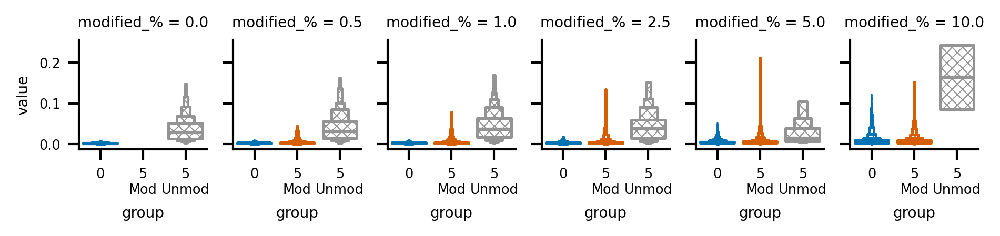

In [82]:
fg = plot_stats_group(
    dataframe=shuffled_qm9_dfs,
    model_names=MODEL_NAMES,
    ref_data=base_qm9_df,
    stats="p_std",
    mod_df_reference=True,
    split_modified="last",
    group_stat="both",
    data_offset=DEFAULT_DATA_OFFSET,
    thresholds=DEFAULT_THRESHOLD,
    kind="catplot",
    hue="group",
    height=1.5,
    aspect=1,
    annot_sizes=False,
)
for ax in fg.axes.flatten():
    # ax.title.set_position((1.05, 0))
    for collection in ax.collections:
        # print("\tCollection: ", collection, collection.get_edgecolor().flatten())
        for path in collection.get_paths():
            patch = PathPatch(
                path,
                facecolor=None,
                edgecolor=collection.get_edgecolor(),
                fill=False,
                hatch=HATCH_DICT[tuple(collection.get_edgecolor().flatten()[:-1])],
                hatch_linewidth=0.5,
                lw=0.5,
            )
            ax.add_patch(patch)

fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
fg.tight_layout(rect=(0, 0, 0.9, 1))
fg.savefig(BASE_DIR / "reports/figures/Figure_S28.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S28.eps")

Figure S29


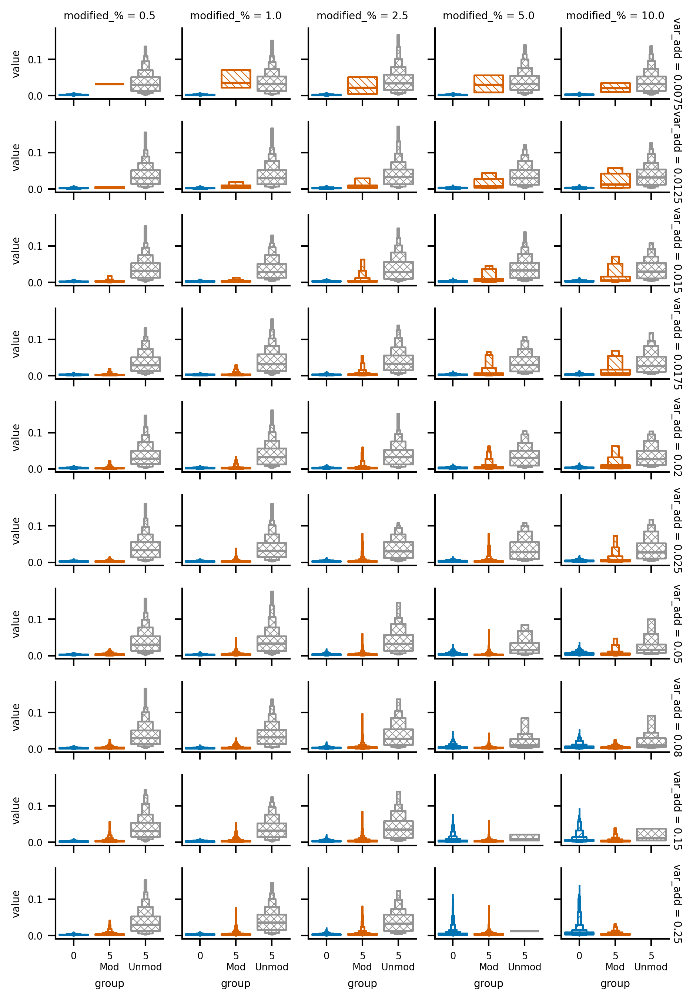

In [83]:
fg = plot_stats_group(
    dataframe=variable_add_qm9_dfs,
    model_names=MODEL_NAMES,
    ref_data=base_qm9_df,
    row="var_add",
    stats="p_std",
    mod_df_reference=True,
    split_modified="last",
    group_stat="both",
    data_offset=DEFAULT_DATA_OFFSET,
    thresholds=DEFAULT_THRESHOLD,
    kind="catplot",
    hue="group",
    height=1.5,
    aspect=1,
    annot_sizes=False,
    margin_titles=True,
)
for ax in fg.axes.flatten():
    # ax.title.set_position((1.05, 0))
    for collection in ax.collections:
        # print("\tCollection: ", collection, collection.get_edgecolor().flatten())
        for path in collection.get_paths():
            patch = PathPatch(
                path,
                facecolor=None,
                edgecolor=collection.get_edgecolor(),
                fill=False,
                hatch=HATCH_DICT[tuple(collection.get_edgecolor().flatten()[:-1])],
                hatch_linewidth=0.5,
                lw=0.5,
            )
            ax.add_patch(patch)

fg.figure.set_dpi(300)
fg.figure.set_size_inches(7, 9)
fg.tight_layout(rect=(0, 0, 0.9, 1))
fg.savefig(BASE_DIR / "reports/figures/Figure_S29.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S29.eps")

Figure S30


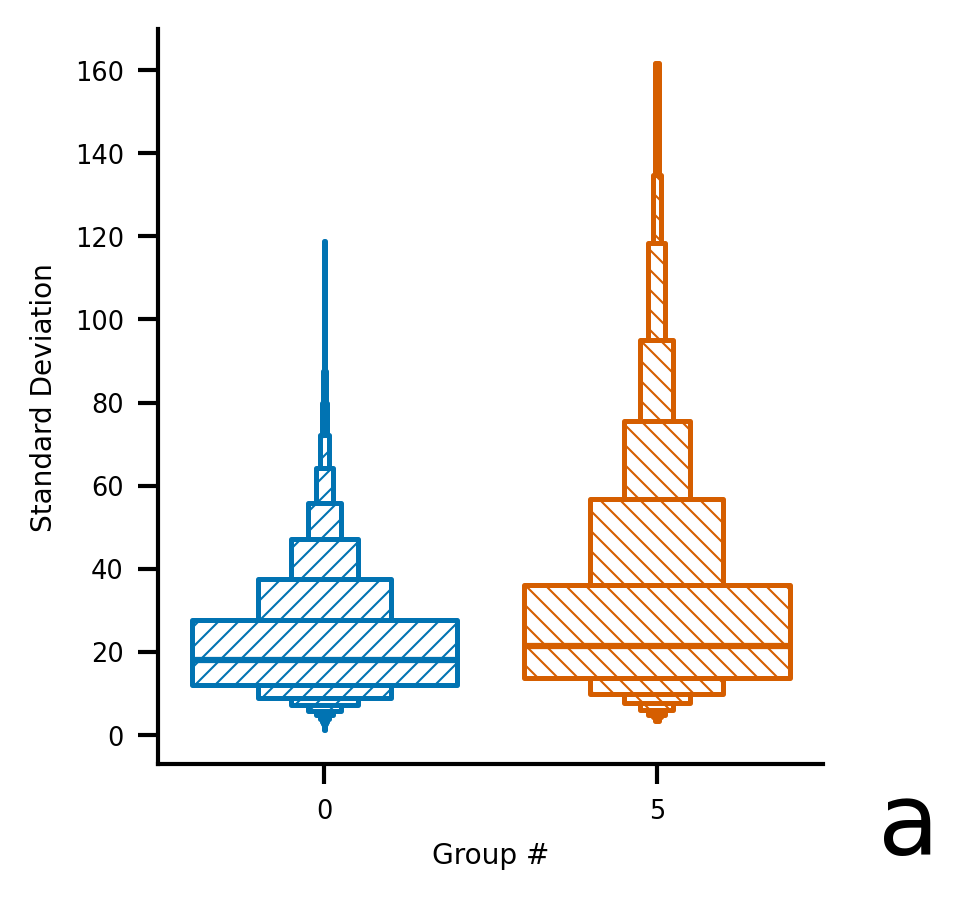

In [84]:
fg = plot_stats_group(
    dataframe=metlin_df,
    model_names=metlin_models,
    value_name="EXP",
    stats="p_std",
    mod_df_reference=True,
    split_modified=False,
    group_stat="both",
    data_offset=DEFAULT_DATA_OFFSET,
    thresholds=DEFAULT_THRESHOLD,
    groups=[0, 5],
    x_var="group",
    hue="group",
    col=None,
    row=None,
    annot_sizes=False,
    height=3,
    aspect=1,
)
for ax in fg.axes.flatten():
    ax.set_xlabel("")
    for collection in ax.collections:
        # print("\tCollection: ", collection, collection.get_edgecolor().flatten())
        for path in collection.get_paths():
            patch = PathPatch(
                path,
                facecolor=None,
                edgecolor=collection.get_edgecolor(),
                fill=False,
                hatch=HATCH_DICT[tuple(collection.get_edgecolor().flatten()[:-1])],
                hatch_linewidth=0.5,
                lw=0.5,
            )
            ax.add_patch(patch)

fg.set_xlabels("Group #")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(85 / 25.4)
fg.set_ylabels("Standard Deviation")
fg.figure.text(x=0.875, y=0.05, s="a", fontsize=24)
fg.tight_layout(rect=(0, 0, 0.85, 1))
fg.savefig(BASE_DIR / "reports/figures/Figure_S30a.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S30a.eps")

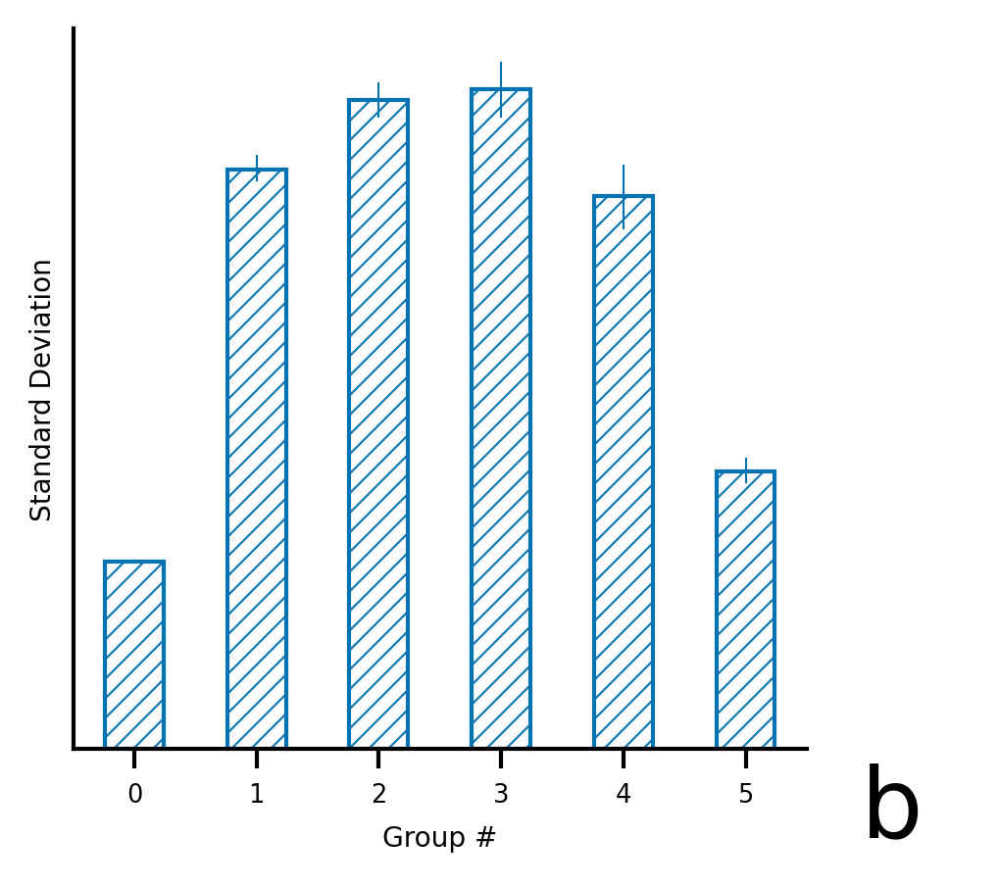

In [85]:
fg = plot_stats_group(
    dataframe=metlin_df,
    model_names=metlin_models,
    ref_data=None,
    value_name="EXP",
    stats="p_std",
    groups=np.arange(0, 6),
    mod_df_reference=True,
    kind="barplot",
    relplot_agg=True,
    x_var="group",
    y_var="p_std",
    hue=None,
    col=None,
    row=None,
    split_modified=False,
    annot_sizes=False,
    facet_kws=dict(sharey=False),
)
fg.figure.set_dpi(300)
fg.set_xlabels("Group #")
fg.set_ylabels("Standard Deviation")
fg.set(yticks=())
fg.figure.set_figwidth(85 / 25.4)
fg.figure.text(x=0.875, y=0.05, s="b", fontsize=24)
fg.tight_layout(rect=(0, 0, 0.85, 1))
fg.savefig(BASE_DIR / "reports/figures/Figure_S30b.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S30b.eps")

Figure S31


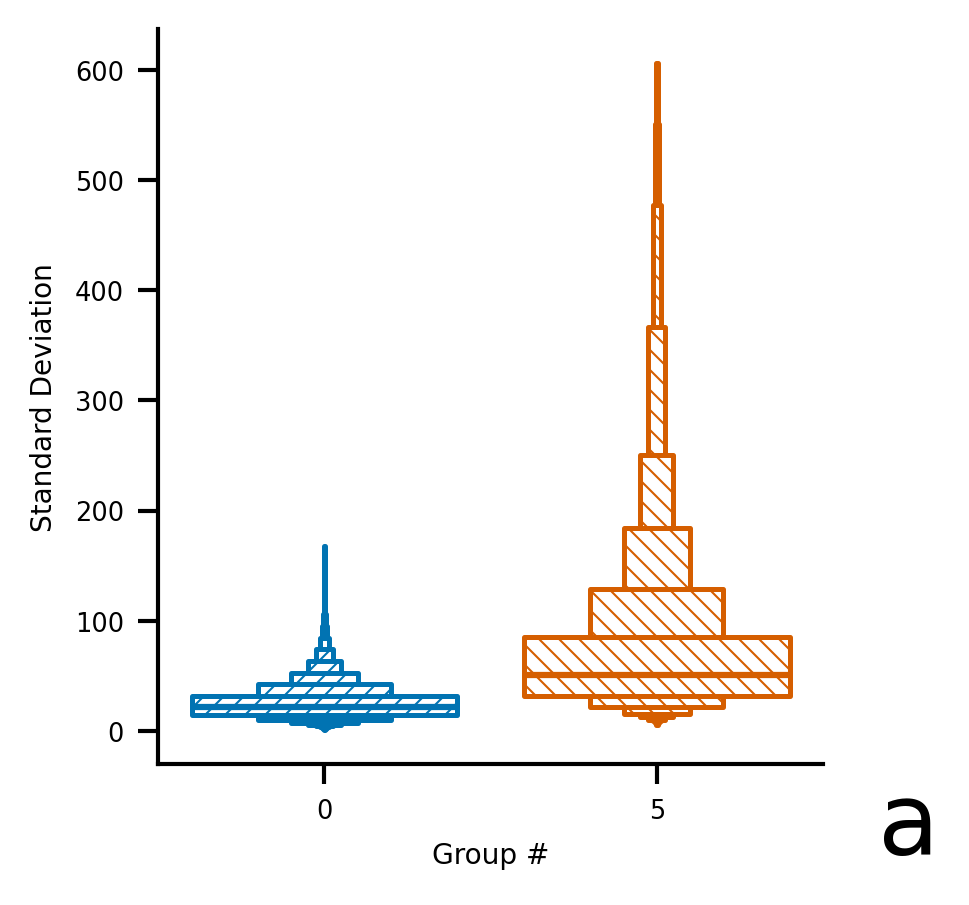

In [86]:
fg = plot_stats_group(
    dataframe=nist_df,
    model_names=nist_models,
    value_name="RI_X",
    stats="p_std",
    mod_df_reference=True,
    split_modified=False,
    group_stat="both",
    data_offset=DEFAULT_DATA_OFFSET,
    thresholds=DEFAULT_THRESHOLD,
    groups=[0, 5],
    x_var="group",
    hue="group",
    col=None,
    row=None,
    annot_sizes=False,
    height=3,
    aspect=1,
)
for ax in fg.axes.flatten():
    # print("Ax: ", ax)
    # ax.text(
    #     s=ax.get_title(),
    #     x=0.75,
    #     y=0.6,
    #     transform=ax.transAxes,
    #     ha="center",
    #     fontdict={"fontsize": ax.title.get_fontsize()},
    # )
    # ax.title.set_position((1.05, 0))
    ax.set_xlabel("")
    for collection in ax.collections:
        # print("\tCollection: ", collection, collection.get_edgecolor().flatten())
        for path in collection.get_paths():
            patch = PathPatch(
                path,
                facecolor=None,
                edgecolor=collection.get_edgecolor(),
                fill=False,
                hatch=HATCH_DICT[tuple(collection.get_edgecolor().flatten()[:-1])],
                hatch_linewidth=0.5,
                lw=0.5,
            )
            ax.add_patch(patch)

fg.set_xlabels("Group #")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(85 / 25.4)
fg.set_ylabels("Standard Deviation")
fg.figure.text(x=0.875, y=0.05, s="a", fontsize=24)
fg.tight_layout(rect=(0, 0, 0.85, 1))
fg.savefig(BASE_DIR / "reports/figures/Figure_S31a.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S31a.eps")

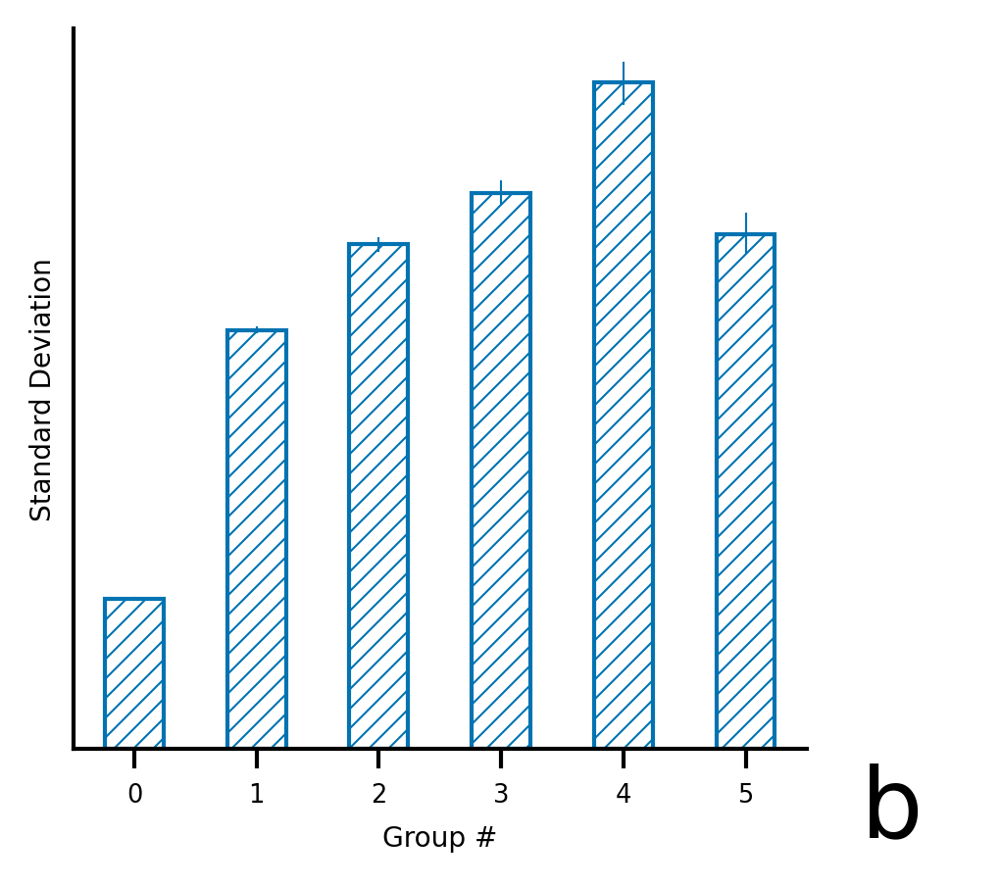

In [ ]:
fg = plot_stats_group(
    dataframe=nist_df,
    model_names=nist_models,
    ref_data=None,
    value_name="RI_X",
    stats="p_std",
    groups=np.arange(0, 6),
    mod_df_reference=True,
    kind="barplot",
    relplot_agg=True,
    x_var="group",
    y_var="p_std",
    hue=None,
    col=None,
    row=None,
    split_modified=False,
    annot_sizes=False,
    facet_kws=dict(sharey=False),
)
fg.figure.set_dpi(300)
fg.set_xlabels("Group #")
fg.set_ylabels("Standard Deviation")
fg.set(yticks=())
fg.figure.set_figwidth(85 / 25.4)
fg.figure.text(x=0.875, y=0.05, s="b", fontsize=24)
fg.tight_layout(rect=(0, 0, 0.85, 1))
fg.savefig(BASE_DIR / "reports/figures/Figure_S31b.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S31b.eps")
### "Yellow cards" vs Simple Thresholding


### Comparing Yellow Cards vs Quantile Thresholding

Figure S32


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


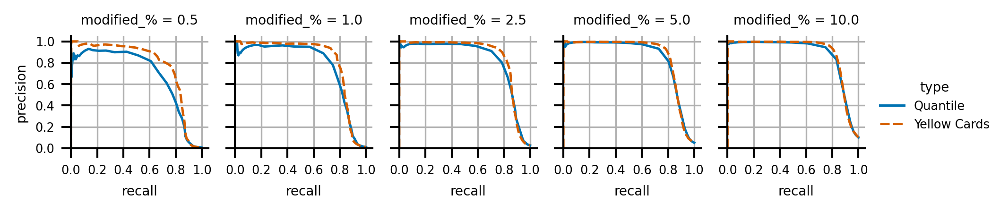

In [ ]:
results = compare_threshold_methods(dataframe=shuffled_desc_dfs, ref_data=noisy_desc_df)
results = results.sort_index(level="type").reset_index()
fg = sns.relplot(
    data=results.loc[results["modified_%"] > 0],
    x="recall",
    y="precision",
    hue="type",
    style="type",
    col="modified_%",
    kind="line",
    markers=False,
    palette="colorblind_reordered",
    height=1.5,
    aspect=1,
)
for ax in fg.axes.flatten():
    ax.grid(True)
fg.set(xlim=(0, 1.05))
fg.set(ylim=(0, 1.05))
fg.set(xticks=np.linspace(0, 1, 6))
fg.set(yticks=np.linspace(0, 1, 6))
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
fg.tight_layout()
fg.savefig(BASE_DIR / "reports/figures/Figure_S32.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S32.eps")

Table 2


In [106]:
auc_results = []
for i in results["modified_%"].unique():
    xs = results.loc[
        (results["modified_%"] == i) & (results["type"] == "Yellow Cards"), "recall"
    ].to_numpy()
    ys = results.loc[
        (results["modified_%"] == i) & (results["type"] == "Yellow Cards"), "precision"
    ].to_numpy()
    ys = ys[np.argsort(xs)]
    xs = xs[np.argsort(xs)]
    auc_results.append((i, "yellow cards", round(auc(xs, ys), 3)))

    xs = results.loc[
        (results["modified_%"] == i) & (results["type"] == "Quantile"),
        "recall",
    ].to_numpy()
    ys = results.loc[
        (results["modified_%"] == i) & (results["type"] == "Quantile"),
        "precision",
    ].to_numpy()
    ys = ys[np.argsort(xs)]
    xs = xs[np.argsort(xs)]
    auc_results.append((i, "quant", round(auc(xs, ys), 3)))
plot_df = pd.DataFrame(auc_results).set_index([0, 1]).unstack(1)
plot_df

2             
1     quant yellow cards
0                       
0.0   0.000        0.000
0.5   0.689        0.776
1.0   0.775        0.820
2.5   0.825        0.853
5.0   0.851        0.865
10.0  0.879        0.890

Figure S34


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


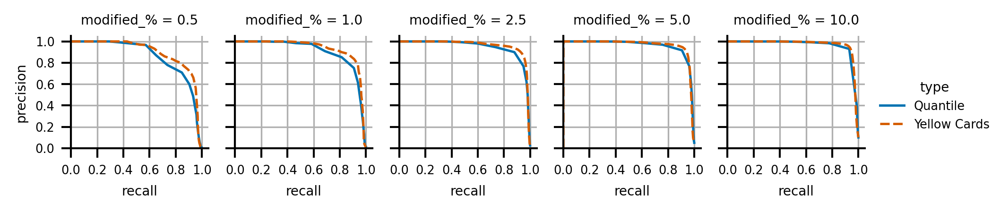

In [ ]:
results = compare_threshold_methods(dataframe=shuffled_qm9_dfs, ref_data=base_qm9_df).sort_index(level="type").reset_index()
fg = sns.relplot(
    data=results.loc[results["modified_%"] > 0],
    x="recall",
    y="precision",
    hue="type",
    style="type",
    col="modified_%",
    kind="line",
    markers=False,
    palette="colorblind_reordered",
    height=1.5,
    aspect=1,
)
for ax in fg.axes.flatten():
    ax.grid(True)
fg.set(xlim=(0, 1.05))
fg.set(ylim=(0, 1.05))
fg.set(xticks=np.linspace(0, 1, 6))
fg.set(yticks=np.linspace(0, 1, 6))
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
fg.tight_layout()
fg.savefig(BASE_DIR / "reports/figures/Figure_S33.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S33.eps")

Table 2

In [108]:
auc_results = []
for i in results["modified_%"].unique():
    xs = results.loc[
        (results["modified_%"] == i) & (results["type"] == "Yellow Cards"), "recall"
    ].to_numpy()
    ys = results.loc[
        (results["modified_%"] == i) & (results["type"] == "Yellow Cards"), "precision"
    ].to_numpy()
    ys = ys[np.argsort(xs)]
    xs = xs[np.argsort(xs)]
    auc_results.append((i, "yellow cards", round(auc(xs, ys), 3)))


    xs = results.loc[
        (results["modified_%"] == i) & (results["type"] == "Quantile"),
        "recall",
    ].to_numpy()
    ys = results.loc[
        (results["modified_%"] == i) & (results["type"] == "Quantile"),
        "precision",
    ].to_numpy()
    ys = ys[np.argsort(xs)]
    xs = xs[np.argsort(xs)]
    auc_results.append((i, "quant", round(auc(xs, ys), 3)))
plot_df = pd.DataFrame(auc_results).set_index([0, 1]).unstack(1)
plot_df

2             
1     quant yellow cards
0                       
0.0   0.000        0.000
0.5   0.859        0.893
1.0   0.904        0.931
2.5   0.945        0.960
5.0   0.957        0.963
10.0  0.962        0.969

Figure S34

In [ ]:
results = compare_threshold_methods(
    dataframe=variable_add_desc_dfs, ref_data=noisy_desc_df, num_points=100
)
results

modified                                   precision  recall        f1
threshold var_add modified_% type                                     
0.0001    0.025   0.5        Yellow Cards   0.000000     0.0  0.000000
                  1.0        Yellow Cards   0.000000     0.0  0.000000
                  2.5        Yellow Cards   0.000000     0.0  0.000000
                  5.0        Yellow Cards   0.000000     0.0  0.000000
                  10.0       Yellow Cards   0.000000     0.0  0.000000
...                                              ...     ...       ...
100.0000  0.250   0.5        Yellow Cards   0.004995     1.0  0.009940
                  1.0        Yellow Cards   0.009989     1.0  0.019781
                  2.5        Yellow Cards   0.024998     1.0  0.048778
                  5.0        Yellow Cards   0.049997     1.0  0.095232
                  10.0       Yellow Cards   0.100006     1.0  0.181829

[6965 rows x 3 columns]

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


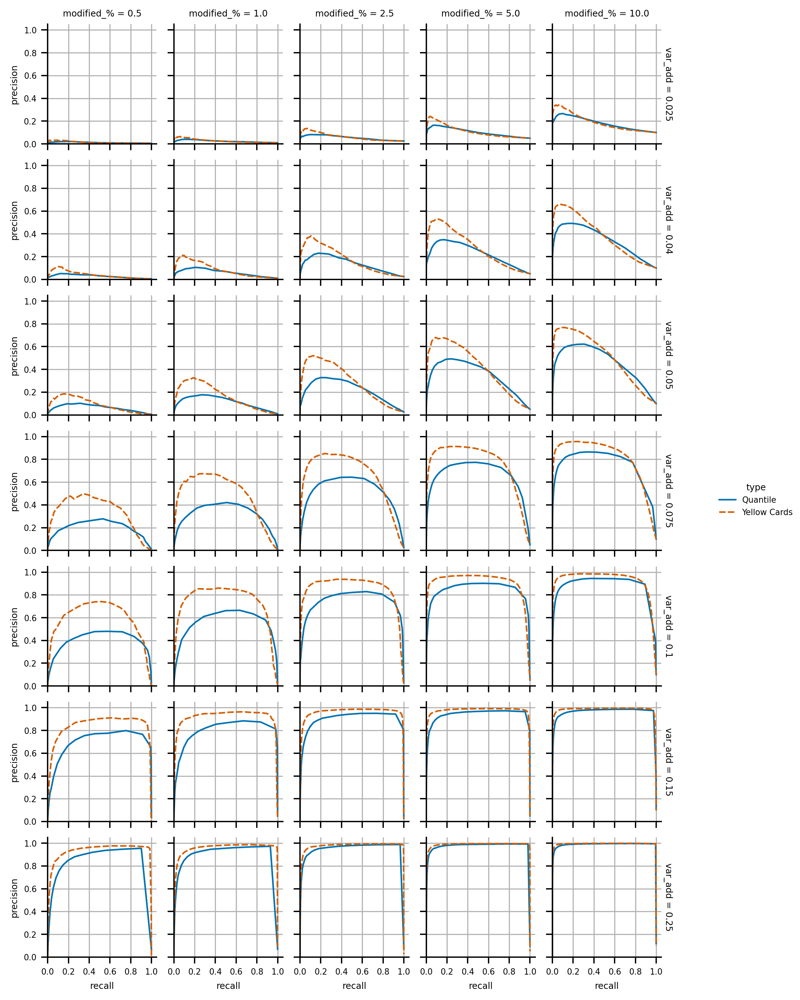

In [110]:
fg = sns.relplot(
    data=results.sort_index(level="type").reset_index(),
    x="recall",
    y="precision",
    hue="type",
    style="type",
    col="modified_%",
    row="var_add",
    kind="line",
    markers=False,
    palette="colorblind_reordered",
    height=1.5,
    aspect=1,
    facet_kws={"margin_titles": True},
)
for ax in fg.axes.flatten():
    ax.grid(True)
fg.set(xlim=(0, 1.05))
fg.set(ylim=(0, 1.05))
fg.set(xticks=np.linspace(0, 1, 6))
fg.set(yticks=np.linspace(0, 1, 6))
fg.figure.set_dpi(300)
fg.tight_layout()
fg.savefig(BASE_DIR / "reports/figures/Figure_S34.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S34.eps")

Figure S35

In [ ]:
results = compare_threshold_methods(
    dataframe=variable_add_qm9_dfs, ref_data=base_qm9_df, num_points=100
)
results

modified                                   precision  recall        f1
threshold var_add modified_% type                                     
0.0001    0.0075  0.5        Yellow Cards   0.000000     0.0  0.000000
                  1.0        Yellow Cards   0.000000     0.0  0.000000
                  2.5        Yellow Cards   0.000000     0.0  0.000000
                  5.0        Yellow Cards   0.000000     0.0  0.000000
                  10.0       Yellow Cards   0.000000     0.0  0.000000
...                                              ...     ...       ...
100.0000  0.2500  0.5        Yellow Cards   0.004993     1.0  0.009936
                  1.0        Yellow Cards   0.009993     1.0  0.019788
                  2.5        Yellow Cards   0.024994     1.0  0.048769
                  5.0        Yellow Cards   0.049995     1.0  0.095229
                  10.0       Yellow Cards   0.099998     1.0  0.181814

[9950 rows x 3 columns]

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


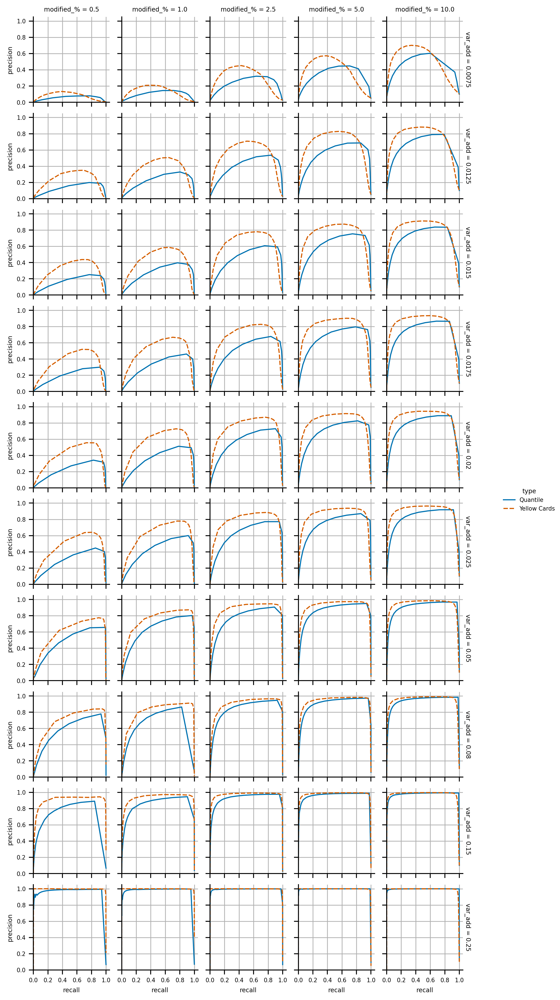

In [112]:
fg = sns.relplot(
    data=results.sort_index(level="type").reset_index(),
    x="recall",
    y="precision",
    hue="type",
    style="type",
    col="modified_%",
    row="var_add",
    kind="line",
    markers=False,
    palette="colorblind_reordered",
    height=1.5,
    aspect=1,
    facet_kws={"margin_titles": True},
)
for ax in fg.axes.flatten():
    ax.grid(True)
fg.set(xlim=(0, 1.05))
fg.set(ylim=(0, 1.05))
fg.set(xticks=np.linspace(0, 1, 6))
fg.set(yticks=np.linspace(0, 1, 6))
fg.figure.set_dpi(300)
fg.tight_layout()
fg.savefig(BASE_DIR / "reports/figures/Figure_S35.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S35.eps")

### Calculating precision

In [ ]:
def estimate_precision(
    dataframe,
    ref_data,
    quantile: float = 0.6,
    model_names=MODEL_NAMES,
    group_stat="abs",
    thresholds=DEFAULT_THRESHOLD,
    data_offset=DEFAULT_DATA_OFFSET,
    value_name="values",
):
    stat_cols = {
        "abs": f"s_{len(model_names)}_a",
        "rel": f"s_{len(model_names)}_r",
        "both": f"s_{len(model_names)}_b",
    }
    group = stat_cols.get(group_stat, f"s_{len(model_names)}_a")
    basic_stats = calc_basic_stats(
        dataframe=dataframe,
        model_names=model_names,
        data_offset=data_offset,
        ref_data=ref_data,
        value_name=value_name,
    )
    group_stats = calc_groups(
        dataframe=dataframe,
        model_names=model_names,
        thresholds=thresholds,
        data_offsets=data_offset,
        value_name=value_name,
    )
    # models_stats = calc_models_diffs(
    #     dataframe=dataframe,
    #     ref_data=ref_data,
    #     model_names=model_names,
    #     data_offset=data_offset,
    #     value_name=value_name,
    # )
    plot_stats = group_stats.join(basic_stats)  # .join(models_stats)
    ground_truth = get_modified_entries(
        data=dataframe, ref_data=ref_data, value_name=value_name
    )
    plot_stats = plot_stats.join(ground_truth)
    plot_stats.set_index(group, append=True, inplace=True)
    id_vars = ["var_add", "modified_%", group, "data_offset", "threshold_%"]
    id_vars = [x for x in id_vars if x in plot_stats.index.names]
    bins = np.append(np.linspace(0, plot_stats["p_std"].quantile(0.99), 99), np.inf)
    bin_names = bins[:-1] + 0.5 * (bins[1] - bins[0])
    plot_stats["p_std_bins"] = pd.cut(
        plot_stats["p_std"], bins=bins, labels=bin_names, right=False
    )
    hist = (
        plot_stats.groupby(id_vars + ["p_std_bins"]).size()
        / plot_stats.groupby(id_vars).size()
    )

    hist_threshold = (
        plot_stats.groupby(id_vars)["p_std"].quantile(quantile).xs(0, level=group)
    ).reindex(
        index=hist.index.droplevel("p_std_bins"), method="ffill"
    )  # 0.017

    # smart threshold
    # hist_threshold = hist.unstack(level=group).std(axis=1)
    # hist_threshold = hist_threshold.loc[
    #     (
    #         plot_stats.xs(0, level=group)["p_std"].quantile(0.6)
    #         < hist_threshold.index.get_level_values("p_std_bins").astype(float)
    #     )
    #     & (
    #         hist_threshold.index.get_level_values("p_std_bins").astype(float)
    #         < plot_stats.xs(1, level=group)["p_std"].quantile(0.5)
    #     )
    #     & (
    #         hist_threshold.index.get_level_values("p_std_bins").astype(float)
    #         < plot_stats.xs(0, level=group)["p_std"].quantile(0.8)
    #     )
    # ].fillna(0)
    # hist_threshold = hist_threshold.unstack(level="p_std_bins").idxmin(axis=1)
    # print(hist_threshold)
    # hist_threshold = hist_threshold.reindex(index=hist.index, method="ffill")

    coeffs = (
        hist.loc[
            hist.index.get_level_values("p_std_bins").astype(float)
            < hist_threshold.astype(float)
        ]
        .groupby(id_vars)
        .sum()
    )
    coeffs = coeffs.xs(0, level=group) / coeffs
    add_area = (
        hist.loc[
            hist.index.get_level_values("p_std_bins").astype(float)
            >= hist_threshold.astype(float)
        ]
        .groupby(id_vars)
        .sum()
    )
    precision = (add_area * coeffs - add_area.xs(0, level=group)) / coeffs
    precision.name = "precision"

    return (1 - precision).clip(0, 1)

In [465]:
for q in np.linspace(0.3,1.0,22):
    print(q,estimate_precision(shuffled_desc_dfs, noisy_desc_df, quantile=q).xs(5, level="s_5_a"))

C:\Users\khris\AppData\Local\Temp\ipykernel_4968\1983895208.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  plot_stats.groupby(id_vars + ["p_std_bins"]).size()


0.3 modified_%  data_offset  threshold_%
0.0         1.5          5.0                 NaN
0.5         1.5          5.0            0.651157
1.0         1.5          5.0            0.750192
2.5         1.5          5.0            1.000000
5.0         1.5          5.0            1.000000
10.0        1.5          5.0            1.000000
Name: precision, dtype: float64


C:\Users\khris\AppData\Local\Temp\ipykernel_4968\1983895208.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  plot_stats.groupby(id_vars + ["p_std_bins"]).size()


0.3333333333333333 modified_%  data_offset  threshold_%
0.0         1.5          5.0                 NaN
0.5         1.5          5.0            0.628931
1.0         1.5          5.0            0.779992
2.5         1.5          5.0            0.976891
5.0         1.5          5.0            1.000000
10.0        1.5          5.0            1.000000
Name: precision, dtype: float64


C:\Users\khris\AppData\Local\Temp\ipykernel_4968\1983895208.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  plot_stats.groupby(id_vars + ["p_std_bins"]).size()


0.36666666666666664 modified_%  data_offset  threshold_%
0.0         1.5          5.0                 NaN
0.5         1.5          5.0            0.611850
1.0         1.5          5.0            0.779729
2.5         1.5          5.0            0.858848
5.0         1.5          5.0            1.000000
10.0        1.5          5.0            1.000000
Name: precision, dtype: float64


C:\Users\khris\AppData\Local\Temp\ipykernel_4968\1983895208.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  plot_stats.groupby(id_vars + ["p_std_bins"]).size()


0.4 modified_%  data_offset  threshold_%
0.0         1.5          5.0                 NaN
0.5         1.5          5.0            0.688898
1.0         1.5          5.0            0.772084
2.5         1.5          5.0            0.862063
5.0         1.5          5.0            1.000000
10.0        1.5          5.0            1.000000
Name: precision, dtype: float64


C:\Users\khris\AppData\Local\Temp\ipykernel_4968\1983895208.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  plot_stats.groupby(id_vars + ["p_std_bins"]).size()


0.43333333333333335 modified_%  data_offset  threshold_%
0.0         1.5          5.0                 NaN
0.5         1.5          5.0            0.616395
1.0         1.5          5.0            0.772084
2.5         1.5          5.0            0.969078
5.0         1.5          5.0            1.000000
10.0        1.5          5.0            1.000000
Name: precision, dtype: float64


C:\Users\khris\AppData\Local\Temp\ipykernel_4968\1983895208.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  plot_stats.groupby(id_vars + ["p_std_bins"]).size()


0.4666666666666667 modified_%  data_offset  threshold_%
0.0         1.5          5.0                 NaN
0.5         1.5          5.0            0.630350
1.0         1.5          5.0            0.773008
2.5         1.5          5.0            0.944741
5.0         1.5          5.0            1.000000
10.0        1.5          5.0            1.000000
Name: precision, dtype: float64


C:\Users\khris\AppData\Local\Temp\ipykernel_4968\1983895208.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  plot_stats.groupby(id_vars + ["p_std_bins"]).size()


0.5 modified_%  data_offset  threshold_%
0.0         1.5          5.0                 NaN
0.5         1.5          5.0            0.692652
1.0         1.5          5.0            0.772938
2.5         1.5          5.0            0.932484
5.0         1.5          5.0            1.000000
10.0        1.5          5.0            1.000000
Name: precision, dtype: float64


C:\Users\khris\AppData\Local\Temp\ipykernel_4968\1983895208.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  plot_stats.groupby(id_vars + ["p_std_bins"]).size()


0.5333333333333333 modified_%  data_offset  threshold_%
0.0         1.5          5.0                 NaN
0.5         1.5          5.0            0.696975
1.0         1.5          5.0            0.751541
2.5         1.5          5.0            0.861198
5.0         1.5          5.0            1.000000
10.0        1.5          5.0            1.000000
Name: precision, dtype: float64


C:\Users\khris\AppData\Local\Temp\ipykernel_4968\1983895208.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  plot_stats.groupby(id_vars + ["p_std_bins"]).size()


0.5666666666666667 modified_%  data_offset  threshold_%
0.0         1.5          5.0                 NaN
0.5         1.5          5.0            0.645276
1.0         1.5          5.0            0.751541
2.5         1.5          5.0            0.919968
5.0         1.5          5.0            1.000000
10.0        1.5          5.0            1.000000
Name: precision, dtype: float64


C:\Users\khris\AppData\Local\Temp\ipykernel_4968\1983895208.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  plot_stats.groupby(id_vars + ["p_std_bins"]).size()


0.6 modified_%  data_offset  threshold_%
0.0         1.5          5.0                 NaN
0.5         1.5          5.0            0.678051
1.0         1.5          5.0            0.759561
2.5         1.5          5.0            0.914333
5.0         1.5          5.0            1.000000
10.0        1.5          5.0            1.000000
Name: precision, dtype: float64


C:\Users\khris\AppData\Local\Temp\ipykernel_4968\1983895208.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  plot_stats.groupby(id_vars + ["p_std_bins"]).size()


0.6333333333333333 modified_%  data_offset  threshold_%
0.0         1.5          5.0                 NaN
0.5         1.5          5.0            0.684739
1.0         1.5          5.0            0.762989
2.5         1.5          5.0            0.900696
5.0         1.5          5.0            1.000000
10.0        1.5          5.0            1.000000
Name: precision, dtype: float64


C:\Users\khris\AppData\Local\Temp\ipykernel_4968\1983895208.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  plot_stats.groupby(id_vars + ["p_std_bins"]).size()


0.6666666666666666 modified_%  data_offset  threshold_%
0.0         1.5          5.0                 NaN
0.5         1.5          5.0            0.677013
1.0         1.5          5.0            0.758424
2.5         1.5          5.0            0.898771
5.0         1.5          5.0            1.000000
10.0        1.5          5.0            1.000000
Name: precision, dtype: float64


C:\Users\khris\AppData\Local\Temp\ipykernel_4968\1983895208.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  plot_stats.groupby(id_vars + ["p_std_bins"]).size()


0.7 modified_%  data_offset  threshold_%
0.0         1.5          5.0                 NaN
0.5         1.5          5.0            0.672589
1.0         1.5          5.0            0.752263
2.5         1.5          5.0            0.888692
5.0         1.5          5.0            1.000000
10.0        1.5          5.0            1.000000
Name: precision, dtype: float64


C:\Users\khris\AppData\Local\Temp\ipykernel_4968\1983895208.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  plot_stats.groupby(id_vars + ["p_std_bins"]).size()


0.7333333333333334 modified_%  data_offset  threshold_%
0.0         1.5          5.0                 NaN
0.5         1.5          5.0            0.673310
1.0         1.5          5.0            0.753559
2.5         1.5          5.0            0.921648
5.0         1.5          5.0            1.000000
10.0        1.5          5.0            1.000000
Name: precision, dtype: float64


C:\Users\khris\AppData\Local\Temp\ipykernel_4968\1983895208.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  plot_stats.groupby(id_vars + ["p_std_bins"]).size()


0.7666666666666666 modified_%  data_offset  threshold_%
0.0         1.5          5.0                 NaN
0.5         1.5          5.0            0.700840
1.0         1.5          5.0            0.750071
2.5         1.5          5.0            0.878456
5.0         1.5          5.0            1.000000
10.0        1.5          5.0            1.000000
Name: precision, dtype: float64


C:\Users\khris\AppData\Local\Temp\ipykernel_4968\1983895208.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  plot_stats.groupby(id_vars + ["p_std_bins"]).size()


0.8 modified_%  data_offset  threshold_%
0.0         1.5          5.0                 NaN
0.5         1.5          5.0            0.691388
1.0         1.5          5.0            0.763896
2.5         1.5          5.0            0.895842
5.0         1.5          5.0            0.992003
10.0        1.5          5.0            1.000000
Name: precision, dtype: float64


C:\Users\khris\AppData\Local\Temp\ipykernel_4968\1983895208.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  plot_stats.groupby(id_vars + ["p_std_bins"]).size()


0.8333333333333333 modified_%  data_offset  threshold_%
0.0         1.5          5.0                 NaN
0.5         1.5          5.0            0.695771
1.0         1.5          5.0            0.767938
2.5         1.5          5.0            0.889570
5.0         1.5          5.0            1.000000
10.0        1.5          5.0            1.000000
Name: precision, dtype: float64


C:\Users\khris\AppData\Local\Temp\ipykernel_4968\1983895208.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  plot_stats.groupby(id_vars + ["p_std_bins"]).size()


0.8666666666666667 modified_%  data_offset  threshold_%
0.0         1.5          5.0                 NaN
0.5         1.5          5.0            0.699984
1.0         1.5          5.0            0.766934
2.5         1.5          5.0            0.888352
5.0         1.5          5.0            0.991064
10.0        1.5          5.0            1.000000
Name: precision, dtype: float64


C:\Users\khris\AppData\Local\Temp\ipykernel_4968\1983895208.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  plot_stats.groupby(id_vars + ["p_std_bins"]).size()


0.8999999999999999 modified_%  data_offset  threshold_%
0.0         1.5          5.0                 NaN
0.5         1.5          5.0            0.717842
1.0         1.5          5.0            0.800514
2.5         1.5          5.0            0.899787
5.0         1.5          5.0            0.987145
10.0        1.5          5.0            1.000000
Name: precision, dtype: float64


C:\Users\khris\AppData\Local\Temp\ipykernel_4968\1983895208.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  plot_stats.groupby(id_vars + ["p_std_bins"]).size()


0.9333333333333333 modified_%  data_offset  threshold_%
0.0         1.5          5.0                 NaN
0.5         1.5          5.0            0.723777
1.0         1.5          5.0            0.817695
2.5         1.5          5.0            0.913668
5.0         1.5          5.0            0.973361
10.0        1.5          5.0            1.000000
Name: precision, dtype: float64


C:\Users\khris\AppData\Local\Temp\ipykernel_4968\1983895208.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  plot_stats.groupby(id_vars + ["p_std_bins"]).size()


0.9666666666666666 modified_%  data_offset  threshold_%
0.0         1.5          5.0                 NaN
0.5         1.5          5.0            0.737018
1.0         1.5          5.0            0.823767
2.5         1.5          5.0            0.919997
5.0         1.5          5.0            0.985353
10.0        1.5          5.0            1.000000
Name: precision, dtype: float64
1.0 modified_%  data_offset  threshold_%
0.0         1.5          5.0                 NaN
0.5         1.5          5.0            0.856177
1.0         1.5          5.0            0.910404
2.5         1.5          5.0            0.960500
5.0         1.5          5.0                 NaN
10.0        1.5          5.0                 NaN
Name: precision, dtype: float64


C:\Users\khris\AppData\Local\Temp\ipykernel_4968\1983895208.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  plot_stats.groupby(id_vars + ["p_std_bins"]).size()


In [ ]:
calc_classification_metrics(shuffled_desc_dfs,ref_dataframe=noisy_desc_df).xs(5,level="group_#").sort_index()

modified                            group_len  group_pos  group_ratio  \
threshold_% modified_% data_offset                                      
5.0         0.0        1.5                283          0     0.003542   
            0.5        1.5                584        326     0.007310   
            1.0        1.5                848        638     0.010615   
            2.5        1.5               1718       1557     0.021505   
            5.0        1.5               2895       2824     0.036237   
            10.0       1.5               3559       3549     0.044549   

modified                            group_pos_ratio  precision    recall  \
threshold_% modified_% data_offset                                         
5.0         0.0        1.5                 0.000000   0.000000  0.000000   
            0.5        1.5                 0.004081   0.558219  0.819095   
            1.0        1.5                 0.007986   0.752358  0.802516   
            2.5        1.5                 0.019489   0.906286  0.780451   
            5.0        1.5                 0.035349   0.975475  0.707061   
            10.0       1.5                 0.044424   0.997190  0.444458   

modified                                  f1  
threshold_% modified_% data_offset            
5.0         0.0        1.5          0.000000  
            0.5        1.5          0.663951  
            1.0        1.5          0.776628  
            2.5        1.5          0.838675  
            5.0        1.5          0.819858  
            10.0       1.5          0.614865

In [466]:
estimate_precision(shuffled_qm9_dfs, base_qm9_df, quantile=0.6).xs(5, level="s_5_a")

C:\Users\khris\AppData\Local\Temp\ipykernel_4968\1983895208.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  plot_stats.groupby(id_vars + ["p_std_bins"]).size()


modified_%  data_offset  threshold_%
0.0         1.5          5.0                 NaN
0.5         1.5          5.0            0.567970
1.0         1.5          5.0            0.716996
2.5         1.5          5.0            0.856415
5.0         1.5          5.0            1.000000
10.0        1.5          5.0            1.000000
Name: precision, dtype: float64

In [ ]:
calc_classification_metrics(shuffled_qm9_dfs, base_qm9_df).xs(5,level="group_#").sort_index()

modified                            group_len  group_pos  group_ratio  \
threshold_% modified_% data_offset                                      
5.0         0.0        1.5                468          0     0.003535   
            0.5        1.5               1024        623     0.007734   
            1.0        1.5               1564       1236     0.011813   
            2.5        1.5               3180       2958     0.024018   
            5.0        1.5               4789       4702     0.036171   
            10.0       1.5               5703       5699     0.043075   

modified                            group_pos_ratio  precision    recall  \
threshold_% modified_% data_offset                                         
5.0         0.0        1.5                 0.000000   0.000000  0.000000   
            0.5        1.5                 0.004706   0.608398  0.942511   
            1.0        1.5                 0.009335   0.790281  0.934947   
            2.5        1.5                 0.022342   0.930189  0.894196   
            5.0        1.5                 0.035514   0.981833  0.710379   
            10.0       1.5                 0.043044   0.999299  0.430503   

modified                                  f1  
threshold_% modified_% data_offset            
5.0         0.0        1.5          0.000000  
            0.5        1.5          0.739466  
            1.0        1.5          0.856549  
            2.5        1.5          0.911837  
            5.0        1.5          0.824334  
            10.0       1.5          0.601763

In [ ]:
res = (
    calc_classification_metrics(variable_add_qm9_dfs, base_qm9_df)
    .xs(5, level="group_#")
    .sort_index()
)
res["precision_est"] = (
    estimate_precision(variable_add_qm9_dfs, base_qm9_df, quantile=0.3)
    .xs(5, level="s_5_a")
    .reorder_levels(res.index.names)
)
res["precision_delta"] = res["precision"] - res["precision_est"]
res

C:\Users\khris\AppData\Local\Temp\ipykernel_4968\1983895208.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  plot_stats.groupby(id_vars + ["p_std_bins"]).size()


modified                                    group_len  group_pos  group_ratio  \
threshold_% var_add modified_% data_offset                                      
5.0         0.0075  0.5        1.5                426          1     0.003218   
                    1.0        1.5                457          6     0.003452   
                    2.5        1.5                400         26     0.003021   
                    5.0        1.5                400         29     0.003021   
                    10.0       1.5                389         34     0.002938   
            0.0125  0.5        1.5                464         42     0.003505   
                    1.0        1.5                489         69     0.003693   
                    2.5        1.5                444         79     0.003354   
                    5.0        1.5                377         83     0.002847   
                    10.0       1.5                357         63     0.002696   
            0.0150  0.5        1.5                595        184     0.004494   
                    1.0        1.5                603        204     0.004554   
                    2.5        1.5                559        232     0.004222   
                    5.0        1.5                409        133     0.003089   
                    10.0       1.5                341         97     0.002576   
            0.0175  0.5        1.5                779        393     0.005884   
                    1.0        1.5                979        600     0.007394   
                    2.5        1.5                805        492     0.006080   
                    5.0        1.5                506        279     0.003822   
                    10.0       1.5                309         97     0.002334   
            0.0200  0.5        1.5                936        526     0.007070   
                    1.0        1.5               1258        906     0.009502   
                    2.5        1.5               1401       1118     0.010582   
                    5.0        1.5                675        460     0.005098   
                    10.0       1.5                352        157     0.002659   
            0.0250  0.5        1.5                963        588     0.007274   
                    1.0        1.5               1529       1174     0.011549   
                    2.5        1.5               2000       1731     0.015106   
                    5.0        1.5               1029        852     0.007772   
                    10.0       1.5                391        240     0.002953   
            0.0500  0.5        1.5               1022        655     0.007719   
                    1.0        1.5               1658       1299     0.012523   
                    2.5        1.5               3342       3117     0.025242   
                    5.0        1.5               2986       2890     0.022553   
                    10.0       1.5                506        417     0.003822   
            0.0800  0.5        1.5               1054        653     0.007961   
                    1.0        1.5               1645       1313     0.012425   
                    2.5        1.5               3449       3237     0.026050   
                    5.0        1.5               4014       3937     0.030318   
                    10.0       1.5                581        512     0.004388   
            0.1500  0.5        1.5               1051        661     0.007938   
                    1.0        1.5               1655       1318     0.012500   
                    2.5        1.5               3469       3261     0.026201   
                    5.0        1.5               5171       5145     0.039056   
                    10.0       1.5                635        618     0.004796   
            0.2500  0.5        1.5               1057        660     0.007984   
                    1.0        1.5               1675       1323     0.012651   
                    2.5        

In [ ]:
res = (
    calc_classification_metrics(variable_add_desc_dfs, noisy_desc_df)
    .xs(5, level="group_#")
    .sort_index()
)
res["precision_est"] = (
    estimate_precision(variable_add_desc_dfs, noisy_desc_df, quantile=0.5)
    .xs(5, level="s_5_a")
    .reorder_levels(res.index.names)
)
res["precision_delta"] = res["precision"] - res["precision_est"]
res

C:\Users\khris\AppData\Local\Temp\ipykernel_4968\1983895208.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  plot_stats.groupby(id_vars + ["p_std_bins"]).size()


modified                                    group_len  group_pos  group_ratio  \
threshold_% var_add modified_% data_offset                                      
5.0         0.025   0.5        1.5                273          8     0.003417   
                    1.0        1.5                258         12     0.003229   
                    2.5        1.5                280         29     0.003505   
                    5.0        1.5                294         58     0.003680   
                    10.0       1.5                278         87     0.003480   
            0.040   0.5        1.5                275         26     0.003442   
                    1.0        1.5                289         60     0.003617   
                    2.5        1.5                346        120     0.004331   
                    5.0        1.5                349        173     0.004369   
                    10.0       1.5                395        256     0.004944   
            0.050   0.5        1.5                308         56     0.003855   
                    1.0        1.5                365        115     0.004569   
                    2.5        1.5                463        241     0.005795   
                    5.0        1.5                478        323     0.005983   
                    10.0       1.5                439        329     0.005495   
            0.075   0.5        1.5                465        210     0.005821   
                    1.0        1.5                605        386     0.007573   
                    2.5        1.5                912        769     0.011416   
                    5.0        1.5               1101       1008     0.013781   
                    10.0       1.5                928        874     0.011616   
            0.100   0.5        1.5                573        326     0.007172   
                    1.0        1.5                844        640     0.010565   
                    2.5        1.5               1571       1433     0.019665   
                    5.0        1.5               1868       1816     0.023382   
                    10.0       1.5               1179       1153     0.014758   
            0.150   0.5        1.5                639        394     0.007998   
                    1.0        1.5                967        782     0.012104   
                    2.5        1.5               2066       1954     0.025861   
                    5.0        1.5               2950       2927     0.036926   
                    10.0       1.5               1444       1431     0.018075   
            0.250   0.5        1.5                659        398     0.008249   
                    1.0        1.5               1009        796     0.012630   
                    2.5        1.5               2101       1993     0.026299   
                    5.0        1.5               3677       3666     0.046026   
                    10.0       1.5               1495       1490     0.018713   

modified                                    group_pos_ratio  precision  \
threshold_% var_add modified_% data_offset                               
5.0         0.025   0.5        1.5                 0.000100   0.029304   
                    1.0        1.5                 0.000150   0.046512   
                    2.5        1.5                 0.000363   0.103571   
                    5.0        1.5                 0.000726   0.197279   
                    10.0       1.5                 0.001089   0.312950   
            0.040   0.5        1.5                 0.000325   0.094545   
                    1.0        1.5                 0.000751   0.207612   
                    2.5        1.5                 0.001502   0.346821   
                    5.0        1.5                 0.002165   0.495702   
                    10.0       1.5                 0.003204   0.648101   
            0.050   0.5        1.5                 0.000701   0.181818   
                    1.0        1.5      

In [ ]:
data = {}
for quant in tqdm(np.linspace(0.3,0.8,11)):
    res = calc_classification_metrics(variable_add_qm9_dfs, base_qm9_df).xs(5,level="group_#").sort_index()
    res["precision_est"] = 1-estimate_precision(variable_add_qm9_dfs, base_qm9_df, quantile=quant).xs(5, level="s_5_a").reorder_levels(res.index.names)
    res["precision_delta"] = (res["precision"]-res["precision_est"].clip(0,1)).abs()
    data[quant] = res["precision_delta"].fillna(0).sum()

  0%|          | 0/11 [00:00<?, ?it/s]

C:\Users\khris\AppData\Local\Temp\ipykernel_4968\3215636298.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  plot_stats.groupby(id_vars + ["p_std_bins"]).size()
C:\Users\khris\AppData\Local\Temp\ipykernel_4968\3215636298.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  plot_stats.groupby(id_vars + ["p_std_bins"]).size()
C:\Users\khris\AppData\Local\Temp\ipykernel_4968\3215636298.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silen

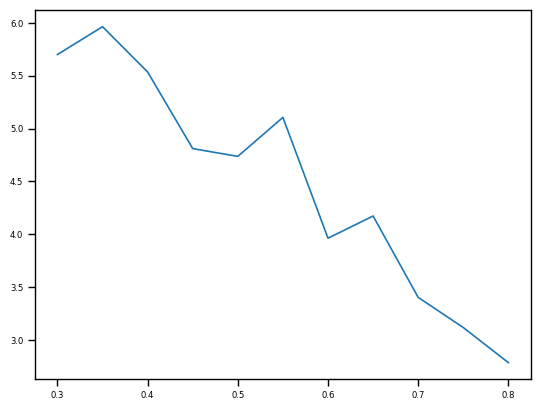

In [243]:
plt.plot(pd.Series(data))

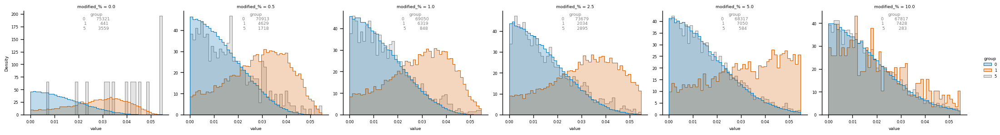

In [430]:
plot_stats_group(shuffled_desc_dfs, ref_data=noisy_desc_df, groups=[0, 1, 5], kind="histplot")

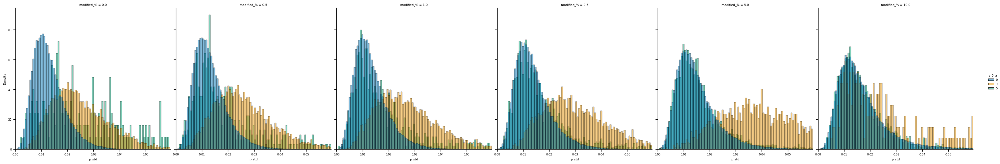

In [ ]:
res = calc_basic_stats(shuffled_desc_dfs)
res = res.join(calc_groups(shuffled_desc_dfs)).reset_index()
fg = sns.displot(
    res[np.isin(res["s_5_a"],[0,1,5])],
    x="p_std",
    bins=np.linspace(0, res["p_std"].quantile(0.99), 100),
    hue="s_5_a",
    col="modified_%",
    kind="hist",
    palette="colorblind",
    stat="density",
    common_norm=False,
)
fg.set(xlim=(0, res["p_std"].quantile(0.99)))

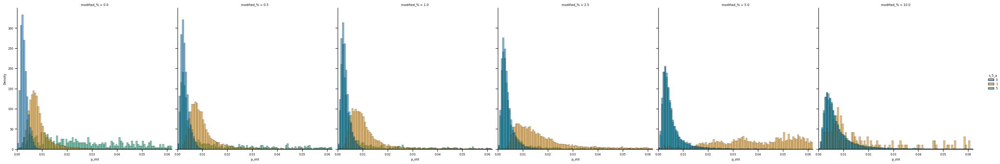

In [ ]:
res = calc_basic_stats(shuffled_qm9_dfs)
res = res.join(calc_groups(shuffled_qm9_dfs)).reset_index()
fg = sns.displot(
    res[np.isin(res["s_5_a"],[0,1,5])],
    x="p_std",
    bins=np.linspace(0, res["p_std"].quantile(0.99), 100),
    hue="s_5_a",
    col="modified_%",
    kind="hist",
    palette="colorblind",
    stat="density",
    common_norm=False,
)
fg.set(xlim=(0, res["p_std"].quantile(0.99)))